# initial exploration of Tara Data

In [1]:
# we need this one library not included in the pangeo image, install if not already available
! pip install cmocean

  Using cached cmocean-4.0.3-py3-none-any.whl.metadata (4.2 kB)
Using cached cmocean-4.0.3-py3-none-any.whl (421 kB)


In [2]:
! pip install gsw

  Using cached gsw-3.6.19-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (7.1 kB)
Using cached gsw-3.6.19-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.4 MB)


In [3]:
! pip install geopy

  Using cached geopy-2.4.1-py3-none-any.whl.metadata (6.8 kB)
  Using cached geographiclib-2.0-py3-none-any.whl.metadata (1.4 kB)
Using cached geopy-2.4.1-py3-none-any.whl (125 kB)
Using cached geographiclib-2.0-py3-none-any.whl (40 kB)


### pull in necessary libraries

In [4]:
import pandas as pd
import geopandas as gpd

import gsw

import numpy as np
from scipy import stats
import statsmodels.api as sm
import xarray as xr
from geopy import distance
import math

import matplotlib.pyplot as plt
import matplotlib
import cartopy.crs as crs
from datetime import datetime
import cmocean

from cartopy.mpl.ticker import (LongitudeFormatter, LatitudeFormatter, LatitudeLocator, LongitudeLocator)

#### function to calculate transect distances from geopandas dataframe

In [5]:
def get_dist(df, df_start, flip=False):
    distances = []
    # flip allows you to swap the starting side so that it can always do dist from the same side
    if flip == False:
        first_row = df_start.iloc[0]
    else:
        first_row = df_start.iloc[-1]
    for row in df.itertuples(index=False):
        distances.append(distance.distance((row.lat, row.lon),(first_row.lat,first_row.lon)).meters/1000)
    return(distances)

### define a base wavelength set

In [6]:
# the wavelengths we'll interpolate TO
base_wl_ap = ['ap408.5', 'ap411.9', 'ap415.3', 'ap419.2','ap423.5', 'ap427.6', 'ap431.5', 'ap435.7', 'ap439.3', 'ap443.5','ap447.9', 'ap452.7', 'ap457.1', 'ap461', 'ap465.4', 'ap469.8','ap474.3', 'ap479', 'ap483.8', 'ap488.1', 'ap492.3', 'ap496.5','ap500.8', 'ap505.4', 'ap509.9', 'ap514.7', 'ap519', 'ap523.7', 'ap528','ap532', 'ap536.1', 'ap540.4', 'ap544.5', 'ap549.2', 'ap553.3','ap557.5', 'ap561.6', 'ap565.9', 'ap570', 'ap573.7', 'ap577.5','ap582.5', 'ap586.6', 'ap590.7', 'ap594.9', 'ap599.3', 'ap603.6','ap608', 'ap612.3', 'ap616.9', 'ap621.2', 'ap625.5', 'ap629.7','ap633.9', 'ap638.2', 'ap642.3', 'ap646.6', 'ap650.9', 'ap655.5','ap659.8', 'ap664.1', 'ap668.5', 'ap672.6', 'ap676.8', 'ap680.9','ap685', 'ap689', 'ap692.9', 'ap696.6', 'ap700.5', 'ap704.2', 'ap707.9','ap712', 'ap715.5', 'ap719.3', 'ap723', 'ap726.7', 'ap730']

ap_wl = [float(i[2:]) for i in base_wl_ap]

base_wl_ap_sd = ['ap'+str(i)+'_sd' for i in ap_wl]

base_wl_cp = ['cp'+str(i) for i in ap_wl]
base_wl_cp_sd = ['cp'+str(i)+'_sd' for i in ap_wl]

### open the saved file that was generated in data_prep

In [12]:
gdf = gpd.read_feather('data/merged_tara_pacific_microbiome_acs_160124.feather')
gdf['sigma'] = gsw.sigma0(gdf.s, gdf.t)

### Pull out the flags we are worried about

These flags are defined in https://github.com/OceanOptics/InLineAnalysis which is used to process the optical data

In [13]:
def is_set(x, n):
    return x & 1 << n != 0

gdf['mission_id'] = 0
gdf.loc[gdf['datetime'] > '2020-01-01', 'mission_id'] = 1

gdf['passes_flags'] = True

# find relevant flags in TaraPacific
passes_flag = []
flag_bits = [3]

for i in gdf[gdf.mission_id==0].flag_bit:
    passed = True
    for bit in flag_bits:
        if is_set(i,bit):
            passed = False
    passes_flag.append(passed)
    
passes_flag = np.array(passes_flag)

gdf.loc[gdf['mission_id'] == 0, 'passes_flags'] = passes_flag

# find relevant flags in TaraMicrobiome
passes_flag = []
flag_bits = [8,9]

for i in gdf[gdf.mission_id==1].flag_bit:
    passed = True
    for bit in flag_bits:
        if is_set(i,bit):
            passed = False
    passes_flag.append(passed)
    
passes_flag = np.array(passes_flag)

gdf.loc[gdf['mission_id'] == 1, 'passes_flags'] = passes_flag

gdf = gdf[gdf.passes_flags==True]

## now we begin the analysis

first check out a T-S diagram of all the data

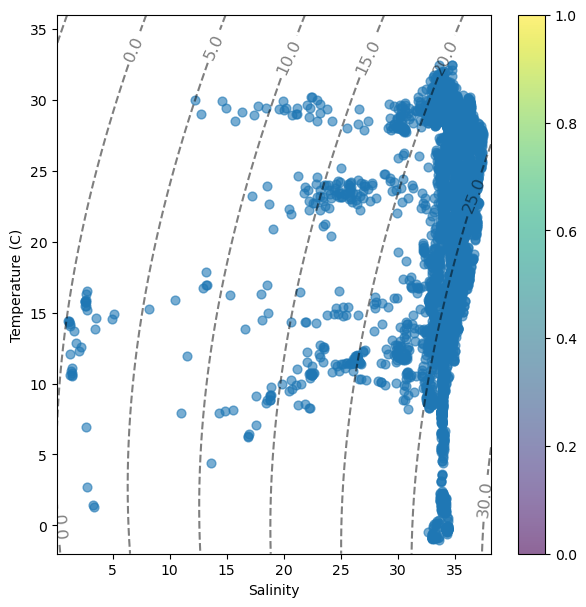

In [9]:
# salinity and temp bounds for the plot
smin = 0
smax = 38.2
tmin = -3
tmax = 36

# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))

# Create empty grid of zeros
dens = np.zeros((ydim,xdim))

# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin

# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.rho(si[i],ti[j],0)

# Substract 1000 to convert to sigma-t
dens = dens - 1000

# plot T and S diagrams first with distance from coast and then with other variables
fig, ax = plt.subplots(figsize=(7,7))
markersize=40

# ax.set_xlim(32,36.2)
# ax.set_ylim(27,30)
ax.set_xlabel('Salinity')
ax.set_ylabel('Temperature (C)')

CS = ax.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.5)
ax.clabel(CS, fontsize=12, inline=1, fmt='%1.1f') # Label every second level

alpha=0.2

im = ax.scatter(gdf.s[::100], gdf.t[::100], s=markersize,alpha=0.6)

# add a colorbar
fig.colorbar(im)
# ax.legend()

# plt.savefig('t_s_diagram.png',dpi=300)
plt.show()

# explore the intermittency of the data

In [8]:
# moving at 1.5m/s and binned into 60 second bins
# so each step is approx 90 m:
(1.5*60)

90.0

In [353]:
# or moving at 4 m/s this is 
4*60

240

In [356]:
# so moving at 4 m/s each 5 step bin is X km
4*60*5 / 1000

1.2

In [358]:
# so moving at 4 m/s each 250 step bin is X km
4*60*250/1000

60.0

In [15]:
90*250 / 1000, 90*500 / 1000, 90*2000 / 1000

(22.5, 45.0, 180.0)

In [16]:
1.5*60

90.0

pull in the main data and plot by temperature to ensure it is all there

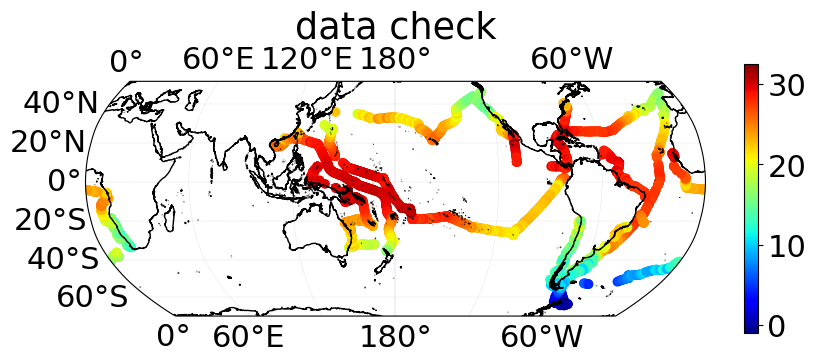

In [10]:
fig, ax = plt.subplots(figsize=(10,3.5), subplot_kw=dict(projection=crs.Robinson(central_longitude=180)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=180).proj4_init
gdf[::100].to_crs(robinson).plot(ax=ax,column='t',legend=True, cmap='jet')

ax.set_title('data check')

plt.show()

#### Examine an example of the variability within a single leg and covariance of the optical parameters

In [107]:
plt.rcParams.update({'font.size': 16})
cb_colors = ['#006BA4','#FF800E','#ABABAB','#A2C8EC']
cb_colors = ['#377eb8', '#ff7f00', '#4daf4a',
                  '#f781bf', '#a65628', '#984ea3',
                  '#999999', '#e41a1c', '#dede00']

In [111]:
gdf_subset = gdf.iloc[429*500:430*500]

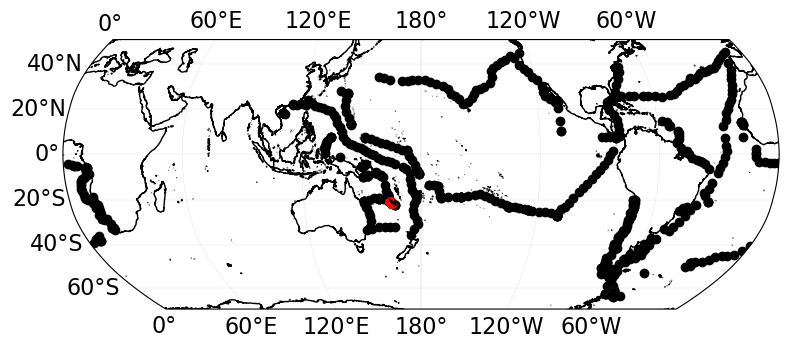

In [102]:
fig, ax = plt.subplots(figsize=(10,3.5), subplot_kw=dict(projection=crs.Robinson(central_longitude=180)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=180).proj4_init
gdf[::1000].to_crs(robinson).plot(ax=ax,c='black')

gdf_subset.to_crs(robinson).plot(ax=ax,c='red')

plt.show()



In [116]:
gdf_subset

,dt,lat,lon,t,s,ad_model400,agaus406,agaus434,agaus453,agaus470,...,hbb_bbp_24,hbb_bbp_25,hbb_bbp_26,hbb_bbp_27,hbb_bbp_28,fdom_sd,fdom_sensor,geometry,uid,sigma
utc_dt,,,,,,,,,,,,,,,,,,,,,
2017-09-08 04:52:00,08-Sep-2017 04:52:00,-20.432825,151.531533,24.9998,35.3326,0.001577,0.006034,0.003744,0.003646,0.002031,...,NaN,NaN,NaN,NaN,NaN,NaN,None,POINT (151.53153 -20.43282),1504846320000000000,23.467268
2017-09-08 04:53:00,08-Sep-2017 04:53:00,-20.432333,151.534158,25.0003,35.3323,0.001680,0.004324,0.004590,0.003960,0.002276,...,NaN,NaN,NaN,NaN,NaN,NaN,None,POINT (151.53416 -20.43233),1504846380000000000,23.466894
2017-09-08 04:54:00,08-Sep-2017 04:54:00,-20.431833,151.536450,25.0020,35.3328,0.002165,0.005701,0.005113,0.004350,0.002658,...,NaN,NaN,NaN,NaN,NaN,NaN,None,POINT (151.53645 -20.43183),1504846440000000000,23.466747
2017-09-08 04:55:00,08-Sep-2017 04:55:00,-20.431442,151.538742,25.0002,35.3332,0.002710,0.004565,0.004651,0.003967,0.002408,...,NaN,NaN,NaN,NaN,NaN,NaN,None,POINT (151.53874 -20.43144),1504846500000000000,23.467591
2017-09-08 04:56:00,08-Sep-2017 04:56:00,-20.431033,151.541067,24.9978,35.3331,0.001497,0.005402,0.005676,0.004427,0.002706,...,NaN,NaN,NaN,NaN,NaN,NaN,None,POINT (151.54107 -20.43103),1504846560000000000,23.468247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-08 15:15:00,08-Sep-2017 15:15:00,-20.230433,152.895800,23.8295,35.4776,0.001099,0.007565,0.005137,0.004393,0.002682,...,NaN,NaN,NaN,NaN,NaN,NaN,None,POINT (152.8958 -20.23043),1504883700000000000,23.925734
2017-09-08 15:16:00,08-Sep-2017 15:16:00,-20.230258,152.897917,23.8298,35.4765,0.000715,0.007028,0.004261,0.004047,0.002335,...,NaN,NaN,NaN,NaN,NaN,NaN,None,POINT (152.89792 -20.23026),1504883760000000000,23.924828
2017-09-08 15:17:00,08-Sep-2017 15:17:00,-20.230050,152.899967,23.8335,35.4760,0.000699,0.006144,0.004751,0.004052,0.002323,...,NaN,NaN,NaN,NaN,NaN,NaN,None,POINT (152.89997 -20.23005),1504883820000000000,23.923363


/tmp/ipykernel_121/1753645070.py:55: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.axvline(gdf_subset.datetime[338],c='k',alpha=1)
/tmp/ipykernel_121/1753645070.py:56: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.axvline(gdf_subset.datetime[370],c='k',alpha=1)


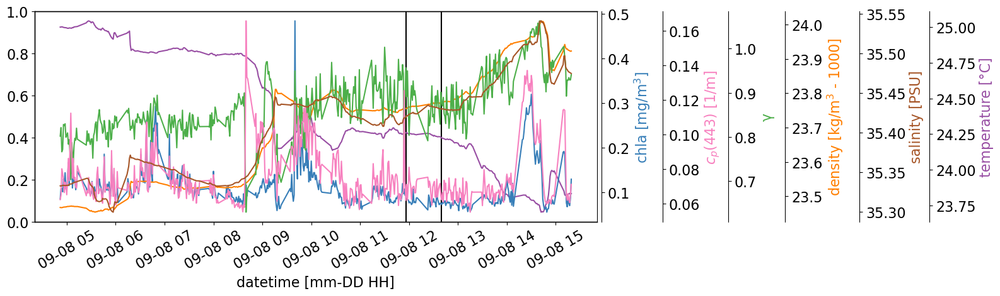

In [115]:
gdf_subset = gdf.iloc[427*500:428*500]

fig, ax = plt.subplots(figsize=(16,5))

# physical
ax_temp = ax.twinx()
ax_temp.plot(gdf_subset.datetime, gdf_subset.t,c=cb_colors[5])
ax2 = ax.twinx()
ax2.plot(gdf_subset.datetime, gdf_subset.Chl_lineheight,c=cb_colors[0], label='chla line height')
ax3 = ax.twinx()
ax3.plot(gdf_subset.datetime, gdf_subset.sigma,c=cb_colors[1], label='sigma')
ax4 = ax.twinx()
ax4.plot(gdf_subset.datetime, gdf_subset.cp_gamma,c=cb_colors[2], label='gamma')

ax5 = ax.twinx()    
ax5.plot(gdf_subset.datetime, gdf_subset['cp443.5'],c=cb_colors[3], label='cp 443')

ax_sal = ax.twinx()
ax_sal.plot(gdf_subset.datetime, gdf_subset.s,c=cb_colors[4], label='salinity [PSU]')


ax2.spines['right'].set_position(('outward', 5))

outward_scale = 75
ax_sal.spines['right'].set_position(('outward', outward_scale*4))
ax_temp.spines['right'].set_position(('outward', outward_scale*5+5))
ax3.spines['right'].set_position(('outward', outward_scale*3-10))
ax4.spines['right'].set_position(('outward', outward_scale*2))
ax5.spines['right'].set_position(('outward', outward_scale))
# ax6.spines['right'].set_position(('outward', outward_scale*4))

ax.tick_params(axis='x', rotation=30)
# ax.set_ylabel('chl a [mg/m3])')

ax_temp.set_ylabel('temperature [°C]')
ax_temp.yaxis.label.set_color(cb_colors[5])

ax2.set_ylabel('chla [mg/m$^3$]')
ax2.yaxis.label.set_color(cb_colors[0])

ax3.set_ylabel('density [kg/m$^3$ - 1000]')
ax3.yaxis.label.set_color(cb_colors[1])

ax4.set_ylabel('γ')
ax4.yaxis.label.set_color(cb_colors[2])

ax5.set_ylabel('$c_p$(443) [1/m]')
ax5.yaxis.label.set_color(cb_colors[3])

ax_sal.set_ylabel('salinity [PSU]')
ax_sal.yaxis.label.set_color(cb_colors[4])

ax.set_xlabel('datetime [mm-DD HH]')

ax.axvline(gdf_subset.datetime[338],c='k',alpha=1)
ax.axvline(gdf_subset.datetime[370],c='k',alpha=1)

fig.tight_layout()
# fig.savefig('figures/t_c_variance_spec.png',dpi=300,transparent=True)
plt.show()

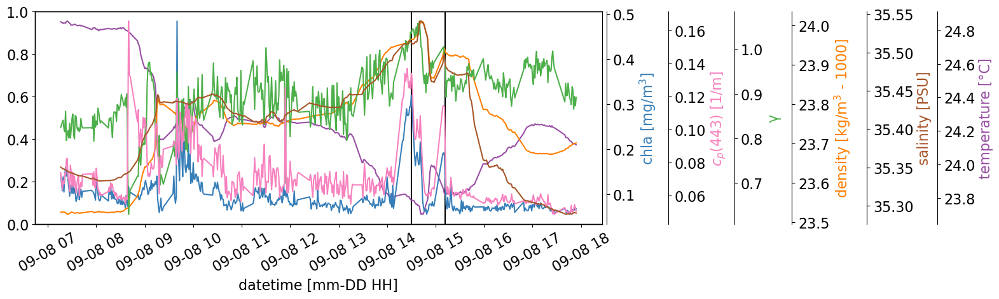

In [118]:
fig, ax = plt.subplots(figsize=(16,5))

# physical
ax_temp = ax.twinx()
ax_temp.plot(gdf_subset.datetime, gdf_subset.t,c=cb_colors[5])
ax2 = ax.twinx()
ax2.plot(gdf_subset.datetime, gdf_subset.Chl_lineheight,c=cb_colors[0], label='chla line height')
ax3 = ax.twinx()
ax3.plot(gdf_subset.datetime, gdf_subset.sigma,c=cb_colors[1], label='sigma')
ax4 = ax.twinx()
ax4.plot(gdf_subset.datetime, gdf_subset.cp_gamma,c=cb_colors[2], label='gamma')

ax5 = ax.twinx()    
ax5.plot(gdf_subset.datetime, gdf_subset['cp443.5'],c=cb_colors[3], label='cp 443')

ax_sal = ax.twinx()
ax_sal.plot(gdf_subset.datetime, gdf_subset.s,c=cb_colors[4], label='salinity [PSU]')


ax2.spines['right'].set_position(('outward', 5))

outward_scale = 75
ax_sal.spines['right'].set_position(('outward', outward_scale*4))
ax_temp.spines['right'].set_position(('outward', outward_scale*5+5))
ax3.spines['right'].set_position(('outward', outward_scale*3-10))
ax4.spines['right'].set_position(('outward', outward_scale*2))
ax5.spines['right'].set_position(('outward', outward_scale))
# ax6.spines['right'].set_position(('outward', outward_scale*4))

ax.tick_params(axis='x', rotation=30)
# ax.set_ylabel('chl a [mg/m3])')

ax_temp.set_ylabel('temperature [°C]')
ax_temp.yaxis.label.set_color(cb_colors[5])

ax2.set_ylabel('chla [mg/m$^3$]')
ax2.yaxis.label.set_color(cb_colors[0])

ax3.set_ylabel('density [kg/m$^3$ - 1000]')
ax3.yaxis.label.set_color(cb_colors[1])

ax4.set_ylabel('γ')
ax4.yaxis.label.set_color(cb_colors[2])

ax5.set_ylabel('$c_p$(443) [1/m]')
ax5.yaxis.label.set_color(cb_colors[3])

ax_sal.set_ylabel('salinity [PSU]')
ax_sal.yaxis.label.set_color(cb_colors[4])

ax.set_xlabel('datetime [mm-DD HH]')

ax.axvline(gdf_subset.datetime[338],c='k',alpha=1)
ax.axvline(gdf_subset.datetime[370],c='k',alpha=1)

fig.tight_layout()
fig.savefig('figures/t_c_variance_spec.png',dpi=300,transparent=True)
plt.show()

In [98]:
pip install colour

Note: you may need to restart the kernel to use updated packages.


In [99]:
from colour import Color

colors = list(Color("brown").range_to(Color("blue"),32))
hex_colors = [j.hex for j in colors]

In [103]:
gdf_subset.iloc[338]

dt                             17-Sep-2017 23:29:00
lat                                      -21.519533
lon                                       164.86385
t                                            23.137
s                                           35.7109
                               ...                 
geometry        POINT (164.86385 -21.5195333333333)
uid                             1505690940000000000
sigma                                     24.302039
mission_id                                        0
passes_flags                                   True
Name: 2017-09-17 23:29:00, Length: 383, dtype: object

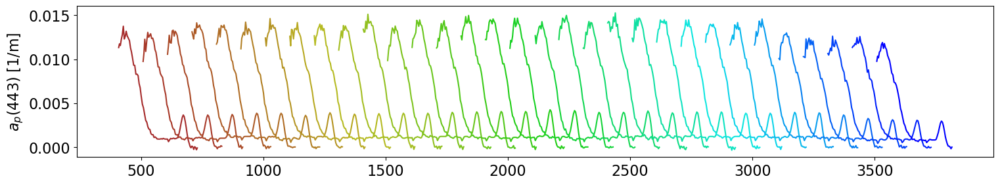

In [104]:
fig, ax = plt.subplots(figsize=(18,3))

# ax.axhline(.135,c='grey',alpha=0.3,ls='--')
# ax.axhline(.0,c='grey',alpha=0.3,ls='--')

# ax.axhline(.04,c='grey',alpha=0.3,ls='--')

for i in range(32):
    ax.plot(np.array(ap_wl)+100*i, gdf_subset.iloc[338+i][base_wl_ap].values.T,c=hex_colors[i])
# ax.set_ylim(0.08,.18)
ax.set_ylabel('$a_p$(443) [1/m]')
# plt.savefig('figures/aps_over_space.png',dpi=300,transparent=True)
plt.show()

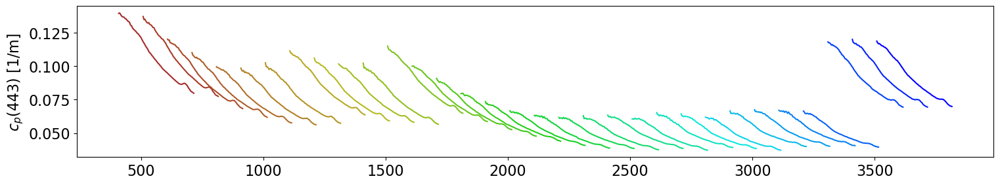

In [117]:
fig, ax = plt.subplots(figsize=(18,3))

# ax.axhline(.135,c='grey',alpha=0.3,ls='--')
# ax.axhline(.0,c='grey',alpha=0.3,ls='--')

for i in range(32):
    ax.plot(np.array(ap_wl)+100*i, gdf_subset.iloc[338+i][base_wl_cp].values.T,c=hex_colors[i])
# ax.set_ylim(0.08,.18)
ax.set_ylabel('$c_p$(443) [1/m]')
plt.savefig('figures/cps_over_space.png',dpi=300,transparent=True)
plt.show()

In [41]:
n_rows / 40000

21.684075

In [134]:
gdf_intermit[gdf_intermit.c_slope < .2][gdf_intermit.large_var > .1]

/srv/conda/envs/notebook/lib/python3.10/site-packages/geopandas/geodataframe.py:1415: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)


,lat,lon,c_slope,random_c_slope,transect_g_slope,g470_slope,s_slope,t_slope,t_mean,s_mean,...,hh_slope,ap443,large_var,small_var,max_window,datetime,max_dist,seconds_elapsed,geometry,min_dist_to_coast
852,24.952810,-80.240277,-0.066062,-0.032417,0.507307,-0.012246,1.019515,0.980345,29.873673,35.911191,...,0.175012,0.017172,0.100200,0.072724,499,2018-09-12 15:36:47.280000000,124.149503,38820.0,POINT (779280.650 111370.997),24890.308782
1040,-34.750342,-72.572268,0.103506,0.039019,0.813187,0.263326,0.429683,1.080227,13.438975,34.195042,...,0.707728,0.065461,0.612366,0.176938,499,2021-04-13 06:31:42.000000000,57.873730,35940.0,POINT (2074739.393 -5472560.929),41772.538133
1177,-11.575137,-36.991746,0.121473,-0.015424,0.365474,0.123347,0.871380,1.031258,27.157621,37.218307,...,0.092667,0.028308,0.174487,0.078073,499,2021-10-08 14:59:17.999999744,105.972087,35940.0,POINT (6435143.395 -2509824.044),41192.092060


#### Show a few examples of the calculation of variance slope

In [69]:
[17*500] # sargasso sea
[64*500] # south pacific
[541*500] # is an interesting example of when temp is flatter than chla
[578*500] # is a good example of a medium chla time when it follows standard ideas
[1076*500] # is just a nice standard example
[1227*500] # is a good example of physics driving it and variability on top

541.0

In [86]:
[17*500,64*500,541*500,578*500,667*500,1006*500,1046*500,1076*500]

[8500, 32000, 270500, 289000, 333500, 503000, 523000, 538000]

In [ ]:
plt.rcParams.update({'font.size': 12})

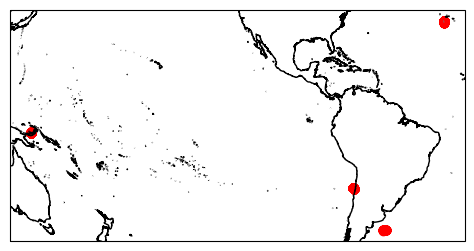

In [103]:
fig, ax = plt.subplots(figsize=(10,3), subplot_kw=dict(projection=crs.Robinson(central_longitude=-80)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels
gl.bottom_labels=False   # suppress top labels
gl.left_labels=False # suppress right labels

robinson = crs.Robinson(central_longitude=-80).proj4_init

for l in [17*500,570*500,1076*500,1227*500,]:
    gdf_subset = gdf.iloc[l:l+500]
    gdf_subset.to_crs(robinson).plot(ax=ax,c='red')

# plt.savefig('example_locations.png',dpi=300)

plt.show()

In [13]:
plt.rcParams.update({'font.size': 14})

start: 8500, stop: 9000
small scale coefficient of variation
0.03160272429853015


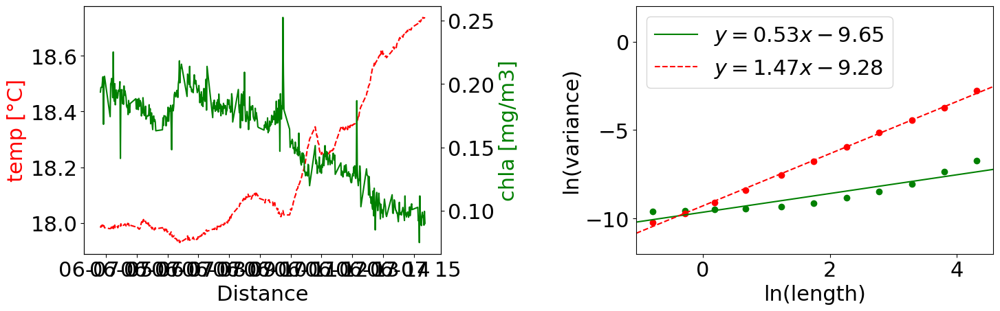

start: 285000, stop: 285500
small scale coefficient of variation
0.04099990246607747


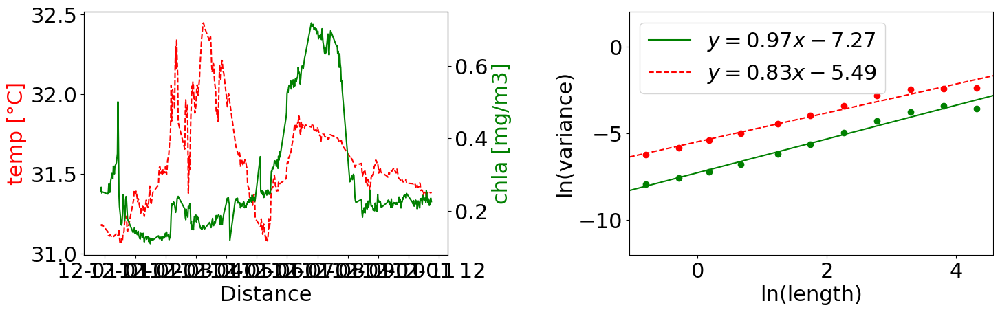

start: 538000, stop: 538500
small scale coefficient of variation
0.01156255436856142


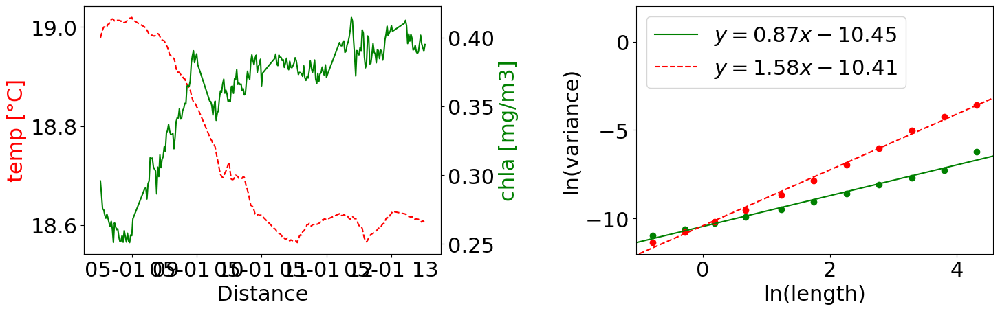

start: 613500, stop: 614000
small scale coefficient of variation
0.02971579790407782


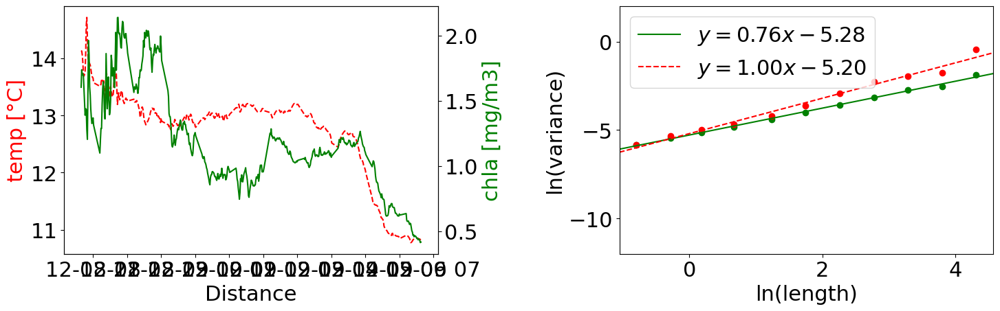

In [55]:
gdf_temp = gpd.read_feather('data/merged_tara_pacific_microbiome_acs_160124.feather')

mean_dist_per_leg = 0.15 #km
small_var_win = 7
# iterate over 10km sections of the dataset

n_rows = 867363
start=0

window_t = None
# win_sizes = [2,3,5,7,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100,110]

transect_c_slope = []
transect_t_slope = []
chla_mean = []
lat = []
lon = []

gamma_hh_spearman = []

step = 500
min_win = 3

win_sizes = [int(x) for x in np.logspace(np.log10(min_win), np.log10(step),num=11)]

# start for loop
for start in [17*500,570*500,1076*500,1227*500]:
# while start+step < n_rows:
    
    # gdf.iloc[10000:]
    stop=start+step
    # low i low v 592*500
    # high i high v 956*500
    # low i high v 1177*500
    # high i low v 1340*500
    # if start not in [17*500,570*500,1076*500,1227*500,]:
    #     start = stop
    #     continue
    # if start not in [1076*500]:
    #     start = stop
    #     continue
    # if start % 40000 != 0:
    #     start = stop
    #     continue
    print('start: ' + str(start) + ', stop: ' + str(stop))

    gdf_subset = gdf_temp.iloc[start:stop]
    dist = get_dist(gdf_subset,gdf_subset)
    max_dist = np.max(get_dist(gdf_subset,gdf_subset))
    seconds_elapsed = (gdf_subset.datetime[-1] - gdf_subset.datetime[0]).total_seconds()
    
    print('small scale coefficient of variation')
    print(np.nanmedian(gdf_subset['Chl_lineheight'].rolling(small_var_win,win_type=window_t,center=True, min_periods=int(small_var_win*.8)).std()/gdf_subset['Chl_lineheight'].rolling(small_var_win,win_type=window_t,center=True, min_periods=int(small_var_win*.8)).mean()))
    
    # if seconds_elapsed > 80000:
    #     start = stop
    #     print('too long')
    #     continue
    # elif max_dist > 500:
    #     start = stop
    #     print('too far')
    #     continue
    # elif max_dist < 20:
    #     start = stop
    #     print('not far enough')
    #     continue
    # else:
    #     print('passed checks')
    
    fig, ax = plt.subplots(1,2,figsize=(15,5))
    ax[0].plot(gdf_subset.datetime, gdf_subset.t,c='red', ls='--')

    ax2 = ax[0].twinx()
    ax2.plot(gdf_subset.datetime, gdf_subset.Chl_lineheight,c='green', label='chla line height')
    # ax3 = ax.twinx()
    # ax3.plot(gdf_subset.datetime, gdf_subset.agaus675,c=cb_colors[1], label='675 gaussian')
    # ax4 = ax.twinx()
    # ax4.plot(gdf_subset.datetime, gdf_subset.cp_gamma,c=cb_colors[2], label='gamma')
    # ax.plot(gdf_subset.datetime, gdf_subset.agaus617/gdf_subset.agaus617.mean(),c='gold')

    # ax5 = ax.twinx()    
    # ax5.plot(gdf_subset.datetime, gdf_subset['cp443.5'],c=cb_colors[3], label='cp 443')

    outward_scale = 75

    # ax3.spines['right'].set_position(('outward', outward_scale-10))
    # ax4.spines['right'].set_position(('outward', outward_scale*2))
    # ax5.spines['right'].set_position(('outward', outward_scale*3))

    ax[0].tick_params(axis='x', rotation=0)

    ax[0].set_ylabel('temp [°C]')
    ax[0].yaxis.label.set_color('red')

    ax2.set_ylabel('chla [mg/m3]')
    ax2.yaxis.label.set_color('green')
    
    
    chla_var = []
    temp_var = []
    # the actual calculation
    for window_s in win_sizes:
        chla_var.append(np.mean(gdf_subset['Chl_lineheight'].rolling(window_s,win_type=window_t,center=True).var()))
        temp_var.append(np.mean(gdf_subset['t'].rolling(window_s,win_type=window_t,center=True).var()))

    c_var = np.array(chla_var)
    t_var = np.array(temp_var)    
    win_sizes = np.array(win_sizes)

        
    ax[1].scatter(np.log(win_sizes*mean_dist_per_leg),np.log(c_var),c='green')
    ax[1].set_ylim(-13,3)
    # ax[0].set_yscale('log')
    # ax[0].set_xscale('log')
    # ax2 = ax[0].twinx()
    ax[1].scatter(np.log(win_sizes*mean_dist_per_leg),np.log(t_var),c='red')
    # ax2.set_yscale('log')
    ax[0].set_xlabel('Distance')
    ax[1].set_xlabel('ln(length)')
    # ax[0].set_ylabel('ln(chl a variance)')
    ax[1].set_ylabel('ln(variance)')
    # ax[0].yaxis.label.set_color('green')
    # ax[0].yaxis.label.set_color('red')
    ax[1].set_ylim(-12,2)
    
    m_chla,b = np.polyfit(np.log(win_sizes[c_var == c_var]*mean_dist_per_leg),np.log(c_var[c_var == c_var]), 1)
    ax[1].axline(xy1=(0, b), slope=m_chla, label=f'$y = {m_chla:.2f}x {b:+.2f}$', ls='-',c='green')
    
    m_temp,b = np.polyfit(np.log(win_sizes[t_var == t_var]*mean_dist_per_leg),np.log(t_var[t_var == t_var]), 1)
    ax[1].axline(xy1=(0, b), slope=m_temp, label=f'$y = {m_temp:.2f}x {b:+.2f}$', ls='--',c='red')
    ax[1].legend(loc='upper left')
    
    fig.tight_layout()
    plt.show()

    fig.savefig('figures/intermit_example_'+str(start)+'.png',dpi=300, transparent=True)
    
    ###
    
#     fig, ax = plt.subplots(1,2,figsize=(18,5))
    
#     gdf_subset.plot(ax=ax[0],column='Chl_lineheight',legend=True)
#     gdf_subset.plot(ax=ax[1],column='t',cmap='inferno',legend=True)
#     ax[0].set_title('Chl a [mg/m3]')
#     ax[1].set_title('Temp [C]')
#     fig.tight_layout()

#     # fig.savefig('t_c_intermit.png',dpi=300)
#     plt.show()
    
    # dists = get_dist(gdf_subset,gdf_subset)
    # diffs = np.array(dists[1:len(dists)]) - np.array(dists[:len(dists)-1])
    # print(np.mean(abs(diffs)), np.median(abs(diffs)))
    # plt.hist(diffs)
    # plt.show()


    start = stop
    ### end
    
del gdf_temp

### Do we get the same with a power density spec as intermittency

(-1.9145197086400403, -11.067190741265655)


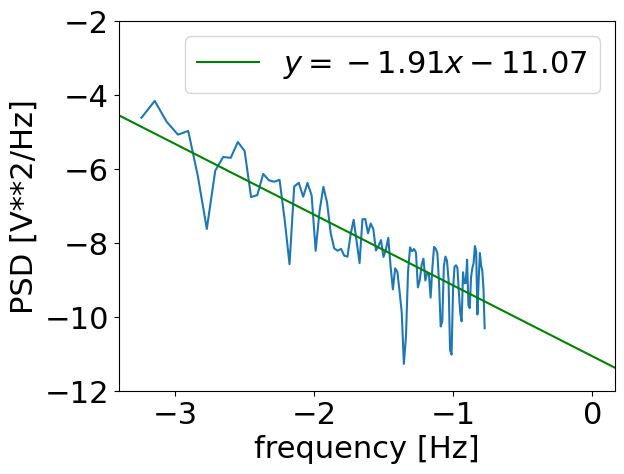

In [12]:
gdf_subset = gdf.iloc[0:500]
f, Pxx_den = signal.welch(gdf_subset.Chl_lineheight.values, 1,detrend=False, scaling='density')

plt.plot(np.log(f[10:-10]), np.log(Pxx_den[10:-10]))
plt.ylim([-12, -2])
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')

m, b = np.polyfit(np.log(f[10:-10]),np.log(Pxx_den[10:-10]), 1)
print((m,b))
plt.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$', ls='-',c='green')
plt.legend()
plt.show()

(-1.9145197086400383, -16.20690307763705)


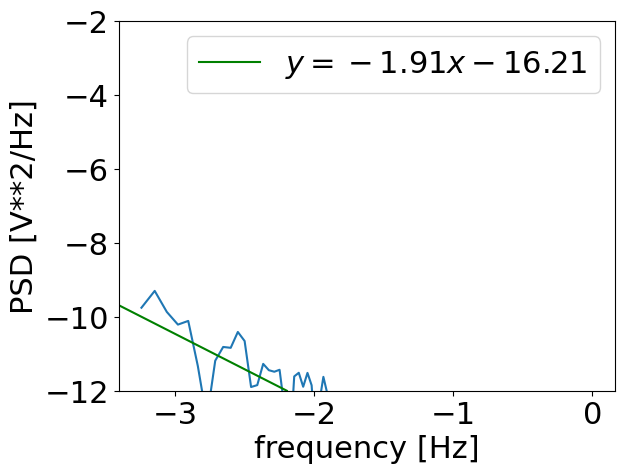

In [13]:
gdf_subset = gdf.iloc[0:500]
f, Pxx_den = signal.welch(gdf_subset.Chl_lineheight.values, 1,detrend=False, scaling='spectrum')

plt.plot(np.log(f[10:-10]), np.log(Pxx_den[10:-10]))
plt.ylim([-12, -2])
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')

m, b = np.polyfit(np.log(f[10:-10]),np.log(Pxx_den[10:-10]), 1)
print((m,b))
plt.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$', ls='-',c='green')
plt.legend()
plt.show()

In [58]:
import math
1/(math.e**-3)

20.085536923187664

(-2.172191142458605, -11.396503016286056)


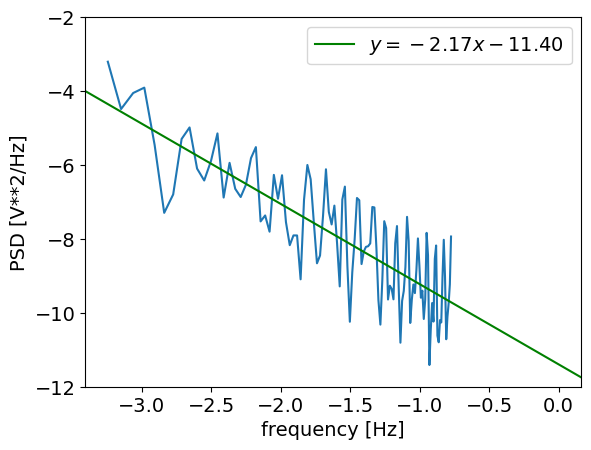

In [155]:
gdf_subset = gdf.iloc[0:500]

f, Pxx_den = signal.welch(gdf_subset.t.values, 1,detrend=False)

plt.plot(np.log(f[10:-10]), np.log(Pxx_den[10:-10]))
plt.ylim([-12, -2])
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')

m, b = np.polyfit(np.log(f[10:-10]),np.log(Pxx_den[10:-10]), 1)
print((m,b))
plt.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$', ls='-',c='green')
plt.legend()
plt.show()

In [159]:
from scipy import signal

spectra_exponent = []
intermit_exponent = []

# iterate over 10km sections of the dataset

n_rows = 661552
start=0

window_t = None
step = 500
# win_sizes = [int(x) for x in np.logspace(np.log10(2), np.log10(step),num=20)]
win_sizes=np.round(1/f[2:])[::-1].astype(int)[28:]

# start for loop
while start+step < n_rows:
    
    # gdf.iloc[10000:]
    stop=start+step
    # low i low v 592*500
    # high i high v 956*500
    # low i high v 1177*500
    # high i low v 1340*500
    # if start not in [17*500,570*500,1076*500,1227*500,]:
    #     start = stop
    #     continue
    # # if start % 40000 != 0:
    #     start = stop
    #     continue
    # print('start: ' + str(start) + ', stop: ' + str(stop))
    
    try:

        gdf_subset = gdf.iloc[start:stop]

        max_dist = np.max(get_dist(gdf_subset,gdf_subset))
        seconds_elapsed = (gdf_subset.datetime[-1] - gdf_subset.datetime[0]).total_seconds()

        if seconds_elapsed > 80000:
            start = stop
            print('too long')
            continue
        elif max_dist > 500:
            start = stop
            print('too far')
            continue
        elif max_dist < 20:
            start = stop
            print('not far enough')
            continue
        else:
            # print('passed checks')
            pass

            
        temp_var = []
        # the actual calculation of intermittency for temp
        for window_s in win_sizes:
            temp_var.append(np.mean(gdf_subset['t'].rolling(window_s,win_type=window_t,center=True).var()))

        t_var = np.array(temp_var)    
        win_sizes = np.array(win_sizes)

        # plt.plot(gdf_subset.t.values)

        m_temp,b = np.polyfit(np.log(1/win_sizes[t_var == t_var]),np.log(t_var[t_var == t_var]), 1)
        intermit_exponent.append(m_temp)

        # calculating the PSD for temp
        f, Pxx_den = signal.welch(gdf_subset.t.values, 1,detrend='constant',nperseg=128,scaling='spectrum')
        # m, b = np.polyfit(np.log(f[1:]),np.log(Pxx_den[1:]), 1)
        m, b_welch = np.polyfit(np.log(f[2:-28]),np.log(Pxx_den[2:-28]), 1)

        # data = gdf_subset.t.values.reshape(1,-1)
        # sfreq = 1
        # intercept, slope, _, _ = compute_spect_slope(sfreq, data)#, fmin=1., fmax=40.)

        spectra_exponent.append(m)
        
#         plt.scatter(np.log(1/win_sizes), np.log(t_var))
#         # plt.ylim([-12, -2])
#         plt.xlabel('win size')
#         plt.ylabel('variance')
#         plt.axline(xy1=(0, b), slope=m_temp, label=f'$y = {m_temp:.2f}x {b:+.2f}$', ls='-',c='blue')
#     #     # plt.legend()
#     #     # plt.show()


#         # plt.plot(np.log(f[1:]), np.log(Pxx_den[1:]))
#         plt.plot(np.log(f[2:-28]), np.log(Pxx_den[2:-28]))
#         # plt.ylim([-12, -2])
#         # plt.xlabel('frequency [Hz]')
#         # plt.ylabel('PSD [V**2/Hz]')
#         plt.axline(xy1=(0, b_welch), slope=m, label=f'$y = {m:.2f}x {b_welch:+.2f}$', ls='-',c='orange')
#         plt.legend()
#         # plt.close()
#         plt.show()
    except TypeError as e:
        print('TypeError')
    except IndexError as e:
        print('IndexError')

    start = stop
    ### end
    # print('#######################################################')
    # print('#######################################################')
    # print('#######################################################')

too long
too long
too long
too long
too long
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
too long
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
too long
too long
too long
not far enough
not far enough
not far enough
not far enough
not far enough
too long
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
not far enough
too long
not far enough
not far enough
not far enough
not far enough
not far enough
t

In [160]:
len(spectra_exponent)

853

In [166]:
X = np.array(spectra_exponent)
Y = np.array(intermit_exponent)

nas = np.logical_or(np.isnan(X), np.isnan(Y))

X = X[~nas]
Y = Y[~nas]

pear_r = stats.pearsonr(X,Y)
spear_r = stats.spearmanr(X,Y)
pear_r, spear_r

(PearsonRResult(statistic=0.7052917467413582, pvalue=2.4190382537005683e-124),
 SpearmanrResult(correlation=0.6741353810721922, pvalue=9.519490615446463e-110))

In [167]:
Y.shape

(820,)

In [168]:
m_temp,b = np.polyfit(X*-1,Y*-1, 1)
m_temp,b

(0.4456756056637299, 0.08652704698880852)

In [169]:
m_temp,m

(0.4456756056637299, -2.105422018060092)

In [179]:
np.nanmean(gdf_intermit.t_slope)

0.9783025778210223

In [170]:
plt.rcParams.update({'font.size': 14})

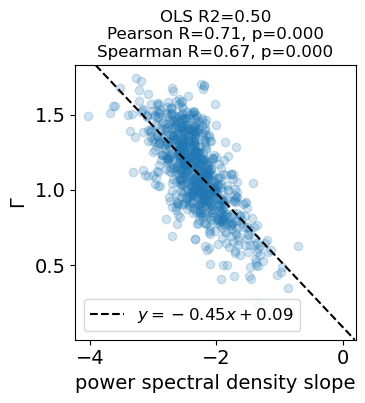

In [180]:
fig, a = plt.subplots(figsize=(4,4.25))
a.scatter(X, Y*-1,alpha=0.2)
a.set_xlabel("power spectral density slope")
a.set_ylabel("$Γ$")
# plt.xlim(.9,3.5)
# plt.ylim(.4,1.8)

ols_model = sm.OLS(Y*-1,sm.add_constant(X))
results = ols_model.fit()

# extract intercept b and slope m
b, m = results.params

# a.scatter(X,Y,alpha=0.3)
a.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$', ls='--',c='k')
# a.set_xlim(np.nanquantile(X,.005),np.nanquantile(X,.995)) 
# a.set_ylim(np.nanquantile(Y,.002),np.nanquantile(Y,.998)) 

# a.set_xlim(0,-4)
# a.set_ylim(0,2)

a.legend(prop={'size': 12})
a.set_title(f'OLS R2={results.rsquared:.2f}\nPearson R={pear_r.statistic:.2f}, p={pear_r.pvalue:.3f}\nSpearman R={spear_r.correlation:.2f}, p={pear_r.pvalue:.3f}',fontsize=12)
fig.tight_layout()
plt.savefig('spec_vs_intermit.png',dpi=300)

### Some synthetic examples

(array([52., 65., 39., 37., 59., 43., 53., 53., 45., 54.]),
 array([8.08869580e-04, 1.00668118e-01, 2.00527367e-01, 3.00386616e-01,
        4.00245865e-01, 5.00105113e-01, 5.99964362e-01, 6.99823611e-01,
        7.99682860e-01, 8.99542109e-01, 9.99401357e-01]),
 <BarContainer object of 10 artists>)

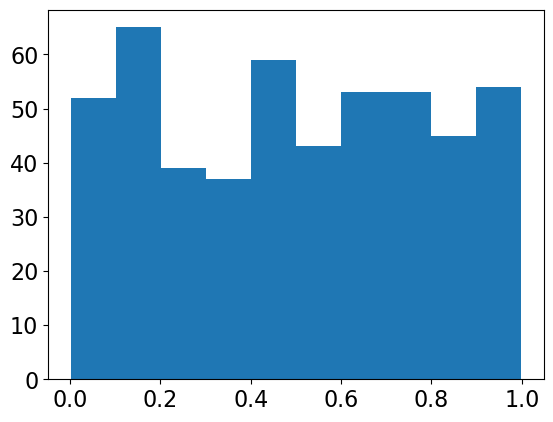

In [17]:
plt.hist(np.random.uniform(0,1,500))

1. uniform white noise and see the intermit and the PSD calcs
2. sine wave
3. step change
4. sine wave plus an increasing trend

In [32]:
cycles = 3 # how many sine cycles
resolution = 500 # how many datapoints to generate

length = np.pi * 2 * cycles
my_wave = np.sin(np.arange(0, length, length / resolution))/2+.5

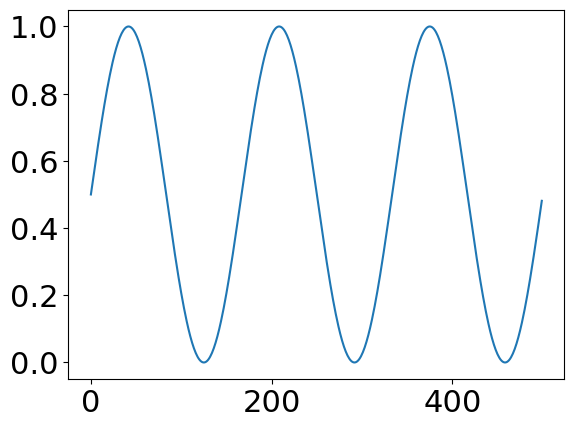

In [33]:
plt.plot(my_wave)

In [34]:
import math
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

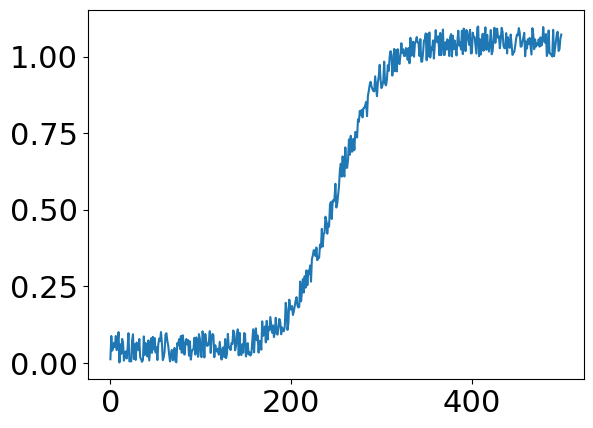

In [35]:
plt.plot(sigmoid(np.linspace(-10,10,500))+np.random.uniform(0,.1,500))

In [36]:
syn = {'data': np.hstack([np.random.uniform(0,.1,500),my_wave+np.random.uniform(0,.1,500), sigmoid(np.linspace(-10,10,500))+np.random.uniform(0,.1,500),np.linspace(0,1,500)+np.random.uniform(0,.1,500)])}

In [37]:
syn = {'data': np.hstack([np.random.uniform(0,.1,500),np.random.uniform(0,1,500), np.random.uniform(0,10,500),np.random.uniform(0,100,500)])}

In [38]:
syn = {'data': np.hstack([sigmoid(np.linspace(-10,10,500))+np.random.uniform(0,.1,500),
                          sigmoid(np.linspace(-10,10,500))+np.random.uniform(0,.5,500), 
                          sigmoid(np.linspace(-10,10,500))+np.random.uniform(0,1,500),
                          sigmoid(np.linspace(-10,10,500))+np.random.uniform(0,2,500)])}

In [39]:
syn = {'data': np.hstack([my_wave+np.random.uniform(0,.1,500),
                          my_wave+np.random.uniform(0,.5,500), 
                          my_wave+np.random.uniform(0,1,500),
                          my_wave+np.random.uniform(0,2,500)])}

In [40]:
np.var(np.hstack([np.ones(250),np.ones(250)+1]))

0.25

In [28]:
syn_df = pd.DataFrame(data=syn)

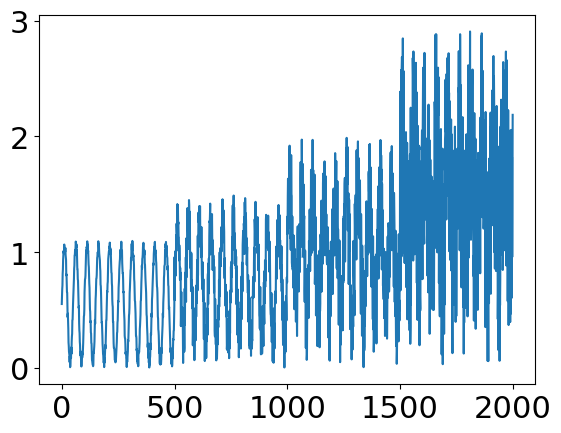

In [29]:
plt.plot(syn_df.data)

In [30]:
[int(x) for x in np.logspace(np.log10(2), np.log10(128),num=20)]

[2, 2, 3, 3, 4, 5, 7, 9, 11, 14, 17, 22, 27, 34, 42, 53, 66, 82, 102, 127]

0
500


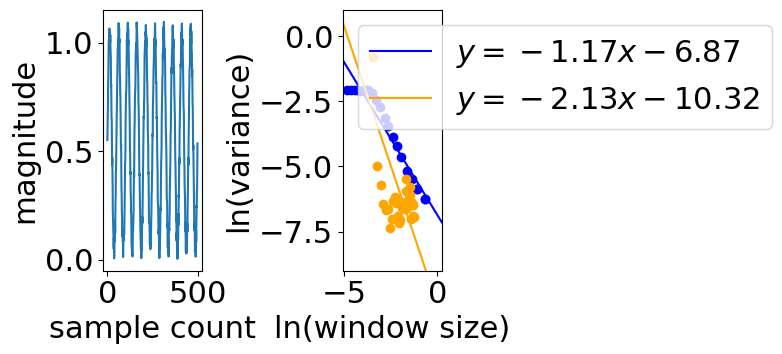

#######################################################
#######################################################
#######################################################
500
1000


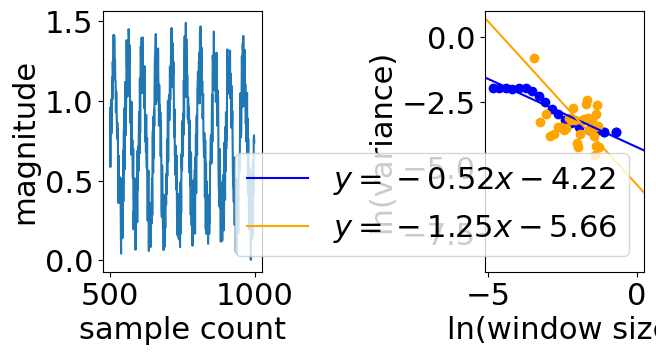

#######################################################
#######################################################
#######################################################
1000
1500


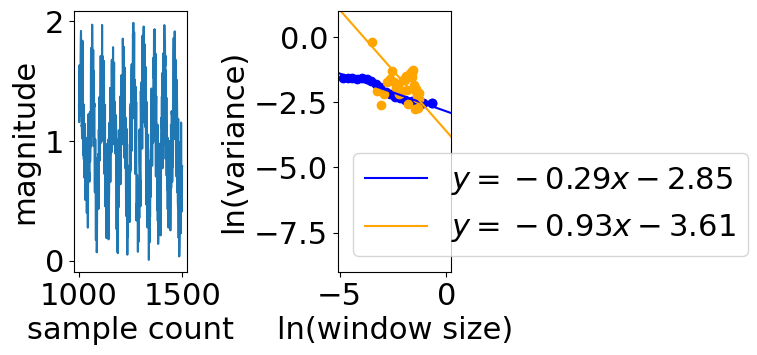

#######################################################
#######################################################
#######################################################
1500
2000


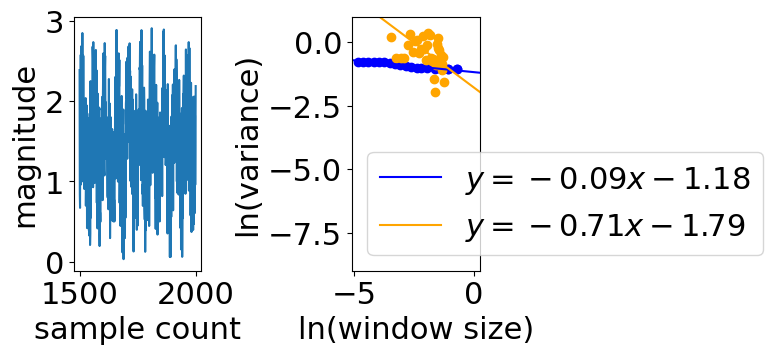

#######################################################
#######################################################
#######################################################


In [31]:
from scipy import signal

spectra_exponent = []
intermit_exponent = []

window_t = None
step = 500
win_sizes = [int(x) for x in np.logspace(np.log10(2), np.log10(128),num=20)]
# win_sizes=np.linspace(2,128,20)
# win_sizes=np.round(1/f[2:])[::-1].astype(int)[28:]

n_rows = len(syn_df)
start=0


# start for loop
while start+step <= n_rows:
    
    stop=start+step
    print(start)
    print(stop)
    
    fig, ax = plt.subplots(1,2,figsize=(7,4))
    
    syn_subset = syn_df.iloc[start:stop]
    ax[0].plot(syn_subset.data)
    ax[0].set_xlabel('sample count')
    ax[0].set_ylabel('magnitude')
    # ax[0].set_ylim(-0.05,1.15)
            
    temp_var = []
    # the actual calculation of intermittency for temp
    for window_s in win_sizes:
        temp_var.append(np.mean(syn_subset['data'].rolling(window_s,win_type=window_t,center=True).var()))

    t_var = np.array(temp_var)    
    win_sizes = np.array(win_sizes)
    
    m_temp,b = np.polyfit(np.log(1/win_sizes[t_var == t_var]),np.log(t_var[t_var == t_var]), 1)
    intermit_exponent.append(m_temp)
    
    ax[1].scatter(np.log(1/win_sizes), np.log(t_var),c='blue')
    # plt.ylim([-12, -2])
    ax[1].set_xlabel('ln(window size)')
    ax[1].set_ylabel('ln(variance)')
    ax[1].axline(xy1=(0, b), slope=m_temp, label=f'$y = {m_temp:.2f}x {b:+.2f}$', ls='-',c='blue')
    
    # calculating the PSD for temp
    f, Pxx_den = signal.welch(syn_subset['data'].values, 1,detrend=None,nperseg=128,scaling='density')
    m, b = np.polyfit(np.log(f[2:-28]),np.log(Pxx_den[2:-28]), 1)
    
    # data = syn_subset.data.values.reshape(1,-1)
    # sfreq = 1
    # psd, freqs = power_spectrum(sfreq, data)
    # intercept, slope, _, _ = compute_spect_slope(sfreq, data)#, fmin=1., fmax=40.)
    
    spectra_exponent.append(m)
    
    ax[1].scatter(np.log(f[2:-28]), np.log(Pxx_den[2:-28]),c='orange')
    # plt.plot(np.log(freqs), np.log(psd[0]))
    ax[1].set_ylim([-9, 1])
    # plt.xlabel('frequency [Hz]')
    # plt.ylabel('PSD [V**2/Hz]')
    # plt.axline(xy1=(0, intercept), slope=slope, label=f'$y = {slope:.2f}x {b:+.2f}$', ls='-',c='orange')
    ax[1].axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$', ls='-',c='orange')
    ax[1].legend()
    plt.tight_layout()
    # plt.savefig('synthetic_'+str(start)+'.png',dpi=300)
    plt.show()
    
    start = stop
    ### end
    print('#######################################################')
    print('#######################################################')
    print('#######################################################')

# variance slope calculation

In [8]:
import warnings
warnings.filterwarnings("ignore")

In [11]:
# log transform it
# gdf['Chl_lineheight'] = np.log(gdf['Chl_lineheight'])

In [12]:
500*120 / 1000

60.0

mean distance is ~.1km between samples so this means we could try three runs from 
- .5km to 5 or windows from 3 to 30
- 5 to 50km or windows from 30 to 300
- 50 to 500km or windows 300 to 3000

In [24]:
win_sizes = [int(x) for x in np.logspace(np.log10(3), np.log10(30),num=11,base=11)]
win_sizes

[3, 3, 5, 6, 8, 10, 13, 16, 21, 27, 34]

In [22]:
win_sizes = [int(x) for x in np.logspace(np.log10(30), np.log10(300),num=11)]
win_sizes

[29, 37, 47, 59, 75, 94, 119, 150, 189, 238, 300]

In [23]:
win_sizes = [int(x) for x in np.logspace(np.log10(300), np.log10(3000),num=11)]
win_sizes

[300, 377, 475, 598, 753, 948, 1194, 1503, 1892, 2382, 3000]

# Here is the actual calculation of variance slope

In [14]:
# iterate over sections of the dataset

mean_dist_per_leg = 0.15 # kilometers

n_rows = len(gdf) # 661552
start=0

window_t = None

transect_c_slope = []
transect_cdom_slope = []
cdom_mean = []
transect_c_slope_random = []
transect_g_slope = []
transect_hh_slope = []
transect_g470_slope = []
transect_cp443_slope = []
transect_t_slope = []
transect_s_slope = []
transect_sig_slope = []
chla_mean = []
lat = []
lon = []
gamma_mean = []

max_dist = []
seconds_elapsed = []

gamma_hh_spearman = []
gamma_hh_pvalue = []
hh_mean = []
t_mean = []
s_mean = []
sig_mean = []
times = []

agaus470_mean = []
agaus492_mean = []
agaus523_mean = []
agaus550_mean = []
agaus584_mean = []

bbp_1_mean = []
cp443_mean = []
ap443_mean = []

large_chla_var = []
small_chla_var = []

large_t_var = []
small_t_var = []

large_gamma_var = []
small_gamma_var = []

large_cp_var = []
small_cp_var = []

large_s_var = []
small_s_var = []

large_sigma_var = []
small_sigma_var = []

max_window_calculated = []

step = 30
min_win = 3

step = 300
min_win = 30

step = 3000
min_win = 300

step = 500
min_win = 3

win_sizes = [int(x) for x in np.logspace(np.log10(min_win), np.log10(step),num=11)]


# start for loop
while start+step < n_rows:
    # try:
        stop=start+step
        if start % step*100 == 0:
            print('start: ' + str(start) + ', stop: ' + str(stop))
        row_idxs = np.arange(n_rows)
        to_exclude = list(range(0,start))+list(range(stop,n_rows))
        if to_exclude[0] == 0:
            to_exclude.pop(0)

        # meat of it

#         df_subset = pd.read_csv('data/TaraPacific_InLine_ACS_prod_full.csv', skiprows = to_exclude)

#         gdf_subset = gpd.GeoDataFrame(
#             df_subset, geometry=gpd.points_from_xy(df_subset.lon, df_subset.lat), crs="EPSG:4326"
#         )

        gdf_subset = gdf.iloc[start:stop]
    
        max_dist.append(np.max(get_dist(gdf_subset,gdf_subset)))
        seconds_elapsed.append((gdf_subset.datetime[-1] - gdf_subset.datetime[0]).total_seconds())
        
        chla_var = []
        temp_var = []
        sal_var = []
        gamma_var = []
        g470_var = []
        cp443_var = []
        sigma_var = []
        hh_var = []
        cdom_var = []
        
        # the actual calculation
        for window_s in win_sizes:
            chla_var.append(np.mean(gdf_subset['Chl_lineheight'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))
            gamma_var.append(np.mean(gdf_subset['cp_gamma'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))
            g470_var.append(np.mean(gdf_subset['agaus470'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))
            cp443_var.append(np.mean(gdf_subset['cp443.5'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))
            hh_var.append(np.mean(gdf_subset['HH_G50'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))

            cdom_var.append(np.mean(gdf_subset['fdom'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))
            
            temp_var.append(np.mean(gdf_subset['t'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))
            sal_var.append(np.mean(gdf_subset['s'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))
            sigma_var.append(np.mean(gdf_subset['sigma'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))

        c_var = np.array(chla_var)
        g_var = np.array(gamma_var)
        g470_var = np.array(g470_var)
        cp443_var = np.array(cp443_var)
        t_var = np.array(temp_var)
        s_var = np.array(sal_var)
        sig_var = np.array(sigma_var)
        h_var = np.array(hh_var)
        cdom_var = np.array(cdom_var)

        win_sizes = np.array(win_sizes)
        
        try:
            m_chla,b = np.polyfit(np.log(win_sizes[c_var == c_var]*mean_dist_per_leg),np.log(c_var[c_var == c_var]), 1)
        except TypeError as e:
            print('caught chla LH polyfit exception')
            m_chla = np.nan
            
        try:
            m_gamma,b = np.polyfit(np.log(win_sizes[g_var == g_var]*mean_dist_per_leg),np.log(g_var[g_var == g_var]), 1)
        except TypeError as e:
            print('caught gamma polyfit exception')
            m_gamma = np.nan
            
        try:
            m_hh,b = np.polyfit(np.log(win_sizes[h_var == h_var]*mean_dist_per_leg),np.log(h_var[h_var == h_var]), 1)
        except TypeError as e:
            print('caught HH polyfit exception')
            m_hh = np.nan
        
        try:
            m_g470,b = np.polyfit(np.log(win_sizes[g470_var == g470_var]*mean_dist_per_leg),np.log(g470_var[g470_var == g470_var]), 1)
        except TypeError as e:
            print('caught gaussian polyfit exception')
            m_g470 = np.nan
        
        try:
            m_cp443,b = np.polyfit(np.log(win_sizes[cp443_var == cp443_var]*mean_dist_per_leg),np.log(cp443_var[cp443_var == cp443_var]), 1)
        except TypeError as e:
            print('caught cp443 polyfit exception')
            m_cp443 = np.nan

        try:
            m_cdom,b = np.polyfit(np.log(win_sizes[cdom_var == cdom_var]*mean_dist_per_leg),np.log(cdom_var[cdom_var == cdom_var]), 1)
        except TypeError as e:
            print('caught cdom polyfit exception')
            m_cdom = np.nan
        try:
            m_temp,b = np.polyfit(np.log(win_sizes[t_var == t_var]*mean_dist_per_leg),np.log(t_var[t_var == t_var]), 1)
            m_sal,b = np.polyfit(np.log(win_sizes[s_var == s_var]*mean_dist_per_leg),np.log(s_var[s_var == s_var]), 1)
            m_sig,b = np.polyfit(np.log(win_sizes[sig_var == sig_var]*mean_dist_per_leg),np.log(sig_var[sig_var == sig_var]), 1)
        except TypeError as e:
            print('caught T/S polyfit exception')
            m_temp = np.nan
            m_sal = np.nan
            m_sig = np.nan
        
        gdf_subset_random = gdf_subset.sample(frac=1)

        chla_var = []

        # the actual calculation but on the random subset
        for window_s in win_sizes:
            chla_var.append(np.mean(gdf_subset_random['Chl_lineheight'].rolling(window_s,win_type=window_t,center=True,min_periods=int(window_s*.8)).var()))
            
        rc_var = np.array(chla_var)
        try:
            m_chla_random,b_random = np.polyfit(np.log(win_sizes[rc_var == rc_var]*mean_dist_per_leg),np.log(rc_var[rc_var == rc_var]), 1)
        except TypeError as e:
            print('caught m_chla_random polyfit exception')
            m_chla_random = np.nan
        try:
            max_window_calculated.append(np.nanmax(win_sizes[c_var == c_var]))
        except:
            max_window_calculated.append(0)
        
        try:
            gamma_hh_spearman.append(stats.spearmanr(gdf_subset.cp_gamma, gdf_subset.HH_G50,nan_policy='omit').correlation)
            gamma_hh_pvalue.append(stats.spearmanr(gdf_subset.cp_gamma, gdf_subset.HH_G50,nan_policy='omit').pvalue)
        except ValueError as e:
            print('exception was:' + str(e))
            gamma_hh_spearman.append(np.nan)
            gamma_hh_pvalue.append(np.nan)
        
        times.append(pd.to_datetime(gdf_subset.dt,format='mixed').mean())
        
        small_var_win = min_win+2
        
        large_chla_var.append(np.mean(gdf_subset['Chl_lineheight'].rolling(step,win_type=window_t,center=True, min_periods=int(step*.8)).var()))
        small_chla_var.append(np.mean(gdf_subset['Chl_lineheight'].rolling(small_var_win,win_type=window_t,center=True, min_periods=int(small_var_win*.8)).var()))
        
        large_t_var.append(np.mean(gdf_subset['t'].rolling(step,win_type=window_t,center=True, min_periods=int(step*.8)).var()))
        small_t_var.append(np.mean(gdf_subset['t'].rolling(small_var_win,win_type=window_t,center=True, min_periods=int(small_var_win*.8)).var()))
        
        large_gamma_var.append(np.mean(gdf_subset['cp_gamma'].rolling(step,win_type=window_t,center=True, min_periods=int(step*.8)).var()))
        small_gamma_var.append(np.mean(gdf_subset['cp_gamma'].rolling(small_var_win,win_type=window_t,center=True, min_periods=int(small_var_win*.8)).var()))
        
        large_cp_var.append(np.mean(gdf_subset['cp443.5'].rolling(step,win_type=window_t,center=True, min_periods=int(step*.8)).var()))
        small_cp_var.append(np.mean(gdf_subset['cp443.5'].rolling(small_var_win,win_type=window_t,center=True, min_periods=int(small_var_win*.8)).var()))
        
        large_s_var.append(np.mean(gdf_subset['s'].rolling(step,win_type=window_t,center=True, min_periods=int(step*.8)).var()))
        small_s_var.append(np.mean(gdf_subset['s'].rolling(small_var_win,win_type=window_t,center=True, min_periods=int(small_var_win*.8)).var()))
        
        large_sigma_var.append(np.mean(gdf_subset['sigma'].rolling(step,win_type=window_t,center=True, min_periods=int(step*.8)).var()))
        small_sigma_var.append(np.mean(gdf_subset['sigma'].rolling(small_var_win,win_type=window_t,center=True, min_periods=int(small_var_win*.8)).var()))
        
        
        transect_t_slope.append(m_temp)
        transect_s_slope.append(m_sal)
        transect_sig_slope.append(m_sig)
        transect_hh_slope.append(m_hh)
        transect_c_slope.append(m_chla)
        transect_c_slope_random.append(m_chla_random)
        transect_g_slope.append(m_gamma)
        transect_g470_slope.append(m_g470)
        transect_cp443_slope.append(m_cp443)
        transect_cdom_slope.append(m_cdom)
        chla_mean.append(gdf_subset['Chl_lineheight'].mean())
        gamma_mean.append(gdf_subset['cp_gamma'].mean())
        hh_mean.append(gdf_subset['HH_G50'].mean())
        cdom_mean.append(gdf_subset['fdom'].mean())
        
        agaus470_mean.append(gdf_subset['agaus470'].mean())
        agaus492_mean.append(gdf_subset['agaus492'].mean())
        agaus523_mean.append(gdf_subset['agaus523'].mean())
        agaus550_mean.append(gdf_subset['agaus550'].mean())
        agaus584_mean.append(gdf_subset['agaus584'].mean())
        
        gdf_subset['datetime'] = pd.to_datetime(gdf_subset.dt, format='mixed')
        bbp_1_mean.append(gdf.loc[gdf_subset.datetime.min():gdf_subset.datetime.max()].bbp_1.mean())
        
        cp443_mean.append(gdf.loc[gdf_subset.datetime.min():gdf_subset.datetime.max()]['cp443.5'].mean())
        ap443_mean.append(gdf.loc[gdf_subset.datetime.min():gdf_subset.datetime.max()]['ap443.5'].mean())
        
        t_mean.append(gdf_subset['t'].mean())
        s_mean.append(gdf_subset['s'].mean())
        sig_mean.append(gdf_subset['sigma'].mean())
        
        lat.append(gdf_subset['lat'].mean())
        lon.append(gdf_subset['lon'].mean())
        
        start = stop
    # except TypeError as e:
    #     print('exception was:' + str(e))
    #     start = stop

start: 0, stop: 500
caught cdom polyfit exception
start: 500, stop: 1000
caught cdom polyfit exception
start: 1000, stop: 1500
caught cdom polyfit exception
start: 1500, stop: 2000
caught cdom polyfit exception
start: 2000, stop: 2500
caught cdom polyfit exception
start: 2500, stop: 3000
caught cdom polyfit exception
start: 3000, stop: 3500
caught cdom polyfit exception
start: 3500, stop: 4000
caught cdom polyfit exception
start: 4000, stop: 4500
caught cdom polyfit exception
start: 4500, stop: 5000
caught cdom polyfit exception
start: 5000, stop: 5500
caught cdom polyfit exception
start: 5500, stop: 6000
caught cdom polyfit exception
start: 6000, stop: 6500
caught cdom polyfit exception
start: 6500, stop: 7000
caught cdom polyfit exception
start: 7000, stop: 7500
caught cdom polyfit exception
start: 7500, stop: 8000
caught cdom polyfit exception
start: 8000, stop: 8500
caught cdom polyfit exception
caught T/S polyfit exception
start: 8500, stop: 9000
caught cdom polyfit exception
caug

In [15]:
len(lat),len(lon), len(transect_c_slope), len(transect_t_slope), len(gamma_hh_spearman),len(gamma_hh_pvalue), len(gamma_mean),len(times), len(small_chla_var), len(max_window_calculated), len(transect_cp443_slope), len(t_mean),len(transect_hh_slope)

(1323, 1323, 1323, 1323, 1323, 1323, 1323, 1323, 1323, 1323, 1323, 1323, 1323)

Create a dataframe with all the parameters

In [16]:
df = pd.DataFrame({'lat':lat,'lon':lon, 'c_slope': transect_c_slope, 'random_c_slope' : transect_c_slope_random, 'transect_g_slope' : transect_g_slope, 'g470_slope' : transect_g470_slope, 
                   's_slope': transect_s_slope, 't_slope': transect_t_slope, 't_mean' : t_mean, 's_mean' : s_mean, 'sigma_slope' :transect_sig_slope, 'sig_mean' : sig_mean,
                   'gamma_hh_spear' : gamma_hh_spearman, 'gamma_hh_pvalue' : gamma_hh_pvalue, 'gamma' : gamma_mean, 'cp443_slope' : transect_cp443_slope,
                   'chla': chla_mean, 'agaus470':agaus470_mean, 'agaus492': agaus492_mean, 'agaus523' : agaus523_mean, 'large_t_var' : large_t_var, 'small_t_var' : small_t_var,
                   'large_gamma_var' : large_gamma_var, 'small_gamma_var' : small_gamma_var,'large_cp_var' : large_cp_var, 'small_cp_var' : small_cp_var,'large_s_var' : large_s_var, 'small_s_var' : small_s_var,
                   'large_sigma_var' : large_sigma_var, 'small_sigma_var' : small_sigma_var,
                   'agaus550': agaus550_mean, 'agaus584':agaus584_mean, 'bbp_1' :bbp_1_mean, 'cp443' : cp443_mean, 'hh_mean' : hh_mean, 'hh_slope' : transect_hh_slope,
                   'ap443' : ap443_mean, 'large_var' : large_chla_var, 'small_var' : small_chla_var, 'max_window' : max_window_calculated, 'datetime' : times,
                  'max_dist' : max_dist, 'seconds_elapsed':seconds_elapsed, 'cdom_mean' : cdom_mean, 'cdom_slope' : transect_cdom_slope})

In [17]:
gdf_intermit = gpd.GeoDataFrame(
        df, geometry=gpd.points_from_xy(df.lon, df.lat), crs="EPSG:4326"
    )

Add distance from coast to each row

In [19]:
coastlines = gpd.read_file('data/ne_10m_coastline.shp')
islands = gpd.read_file('data/ne_10m_minor_islands_coastline.shp')

coastlines = pd.concat([coastlines, islands])

import geopandas as gpd
from shapely.geometry import Point

def min_distance(point, lines):
    return lines.distance(point).min()

coastline =coastlines.to_crs('EPSG:3087')
gdf_intermit = gdf_intermit.to_crs('EPSG:3087') # https://epsg.io/3087

gdf_intermit['min_dist_to_coast'] = gdf_intermit.geometry.apply(min_distance, args=(coastline,))

In [20]:
gdf_intermit.head()

,lat,lon,c_slope,random_c_slope,transect_g_slope,g470_slope,s_slope,t_slope,t_mean,s_mean,...,large_var,small_var,max_window,datetime,max_dist,seconds_elapsed,cdom_mean,cdom_slope,geometry,min_dist_to_coast
0,45.444942,-9.458165,1.246863,0.000194,1.059775,1.140268,1.161461,0.955319,15.849111,35.538602,...,0.035662,0.000182,499,2016-05-30 12:12:06.000000000,107.501430,37140.0,NaN,NaN,POINT (6196292.564 4156067.07),217522.054316
1,44.858453,-10.816276,1.079757,-0.000094,0.906420,1.096974,1.093340,0.618503,16.354629,35.536724,...,0.027844,0.000229,499,2016-05-30 23:27:29.653999872,140.836297,40859.0,NaN,NaN,POINT (6138079.362 4041518.392),224712.735577
2,44.036574,-12.135544,0.889142,0.005705,0.968281,0.867866,1.009760,0.809322,16.427152,35.620714,...,0.015376,0.000297,499,2016-05-31 10:41:50.686000128,152.890560,46319.0,NaN,NaN,POINT (6094633.54 3907976.769),262547.430521
3,43.303775,-13.641276,0.974783,-0.005724,1.094595,0.983474,1.106470,0.618075,16.614879,35.641521,...,0.010822,0.000142,499,2016-05-31 22:55:20.373999872,130.721482,37801.0,NaN,NaN,POINT (6030825.33 3773478.11),370158.924952
4,42.626305,-14.923360,0.809114,-0.003550,0.762356,0.730377,1.010881,0.992310,16.595852,35.686748,...,0.002806,0.000098,499,2016-06-01 09:21:08.640000256,118.422581,37260.0,NaN,NaN,POINT (5977757.221 3654093.92),479682.531649


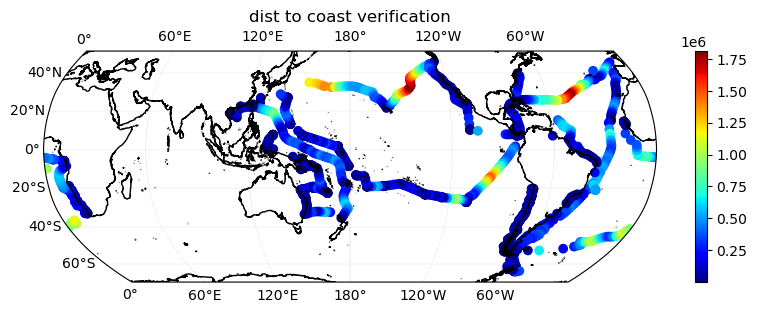

In [21]:
fig, ax = plt.subplots(figsize=(10,3), subplot_kw=dict(projection=crs.Robinson(central_longitude=180)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=180).proj4_init
gdf_intermit.to_crs(robinson).plot(ax=ax,column='min_dist_to_coast',legend=True, cmap='jet')

ax.set_title('dist to coast verification')

# plt.savefig('chla_intermittency_map.png',dpi=300)

plt.show()

## ensure all the packages give the same slope

In [61]:
import seaborn as sns

In [77]:
import scipy.stats
scipy.stats.linregress(np.log(win_sizes[c_var == c_var]*mean_dist_per_leg),np.log(c_var[c_var == c_var]))

LinregressResult(slope=0.5640721068872766, intercept=-6.480809868362469, rvalue=0.9684663321993962, pvalue=9.821428201882855e-07, stderr=0.04837044491125009, intercept_stderr=0.11529582866209517)

In [69]:
ols_model = sm.OLS(np.log(c_var[c_var == c_var]),sm.add_constant(np.log(win_sizes[c_var == c_var]*mean_dist_per_leg)))
results = ols_model.fit()

In [73]:
results.params

array([-6.48080987,  0.56407211])

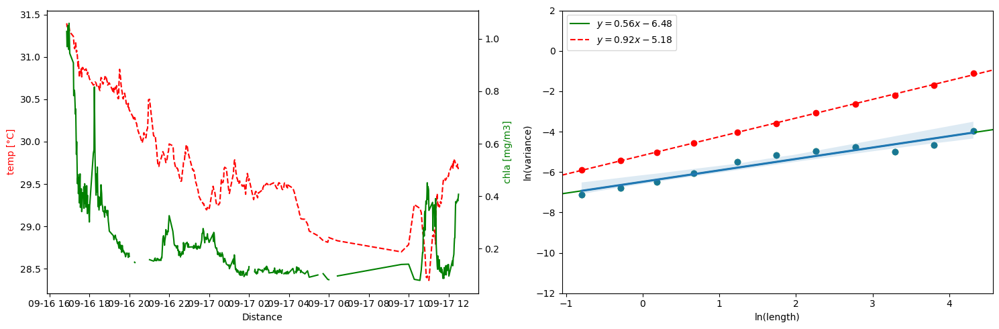

In [65]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
ax[0].plot(gdf_subset.datetime, gdf_subset.t,c='red', ls='--')

ax2 = ax[0].twinx()
ax2.plot(gdf_subset.datetime, gdf_subset.Chl_lineheight,c='green', label='chla line height')

outward_scale = 75

ax[0].tick_params(axis='x', rotation=0)

ax[0].set_ylabel('temp [°C]')
ax[0].yaxis.label.set_color('red')

ax2.set_ylabel('chla [mg/m3]')
ax2.yaxis.label.set_color('green')


ax[1].scatter(np.log(win_sizes*mean_dist_per_leg),np.log(c_var),c='green')
ax[1].set_ylim(-13,3)
# ax[0].set_yscale('log')
# ax[0].set_xscale('log')
# ax2 = ax[0].twinx()
ax[1].scatter(np.log(win_sizes*mean_dist_per_leg),np.log(t_var),c='red')
# ax2.set_yscale('log')
ax[0].set_xlabel('Distance')
ax[1].set_xlabel('ln(length)')
# ax[0].set_ylabel('ln(chl a variance)')
ax[1].set_ylabel('ln(variance)')
# ax[0].yaxis.label.set_color('green')
# ax[0].yaxis.label.set_color('red')
ax[1].set_ylim(-12,2)

m_chla,b = np.polyfit(np.log(win_sizes[c_var == c_var]*mean_dist_per_leg),np.log(c_var[c_var == c_var]), 1)
ax[1].axline(xy1=(0, b), slope=m_chla, label=f'$y = {m_chla:.2f}x {b:+.2f}$', ls='-',c='green')

sns.regplot(x=np.log(win_sizes[c_var == c_var]*mean_dist_per_leg),y=np.log(c_var[c_var == c_var]),ax=ax[1])

m_temp,b = np.polyfit(np.log(win_sizes[t_var == t_var]*mean_dist_per_leg),np.log(t_var[t_var == t_var]), 1)
ax[1].axline(xy1=(0, b), slope=m_temp, label=f'$y = {m_temp:.2f}x {b:+.2f}$', ls='--',c='red')
ax[1].legend(loc='upper left')

fig.tight_layout()
plt.show()

#### recalculate the mean dist in each transect

In [86]:
# iterate over sections of the dataset

mean_dist_per_leg = 0.15 # kilometers

n_rows = len(gdf) # 661552
start=0
step = 500
min_win = 3

median_dist = []


# start for loop
while start+step < n_rows:
    # try:
        stop=start+step
        if start % step*100 == 0:
            print('start: ' + str(start) + ', stop: ' + str(stop))
        row_idxs = np.arange(n_rows)
        to_exclude = list(range(0,start))+list(range(stop,n_rows))
        if to_exclude[0] == 0:
            to_exclude.pop(0)

        # meat of it

#         df_subset = pd.read_csv('data/TaraPacific_InLine_ACS_prod_full.csv', skiprows = to_exclude)

#         gdf_subset = gpd.GeoDataFrame(
#             df_subset, geometry=gpd.points_from_xy(df_subset.lon, df_subset.lat), crs="EPSG:4326"
#         )

        gdf_subset = gdf.iloc[start:stop]
    
        median_dist.append(np.median(np.array(get_dist(gdf_subset,gdf_subset))[1:] - np.array(get_dist(gdf_subset,gdf_subset))[:-1]))
        start = stop

start: 0, stop: 500
start: 500, stop: 1000
start: 1000, stop: 1500
start: 1500, stop: 2000
start: 2000, stop: 2500
start: 2500, stop: 3000
start: 3000, stop: 3500
start: 3500, stop: 4000
start: 4000, stop: 4500
start: 4500, stop: 5000
start: 5000, stop: 5500
start: 5500, stop: 6000
start: 6000, stop: 6500
start: 6500, stop: 7000
start: 7000, stop: 7500
start: 7500, stop: 8000
start: 8000, stop: 8500
start: 8500, stop: 9000
start: 9000, stop: 9500
start: 9500, stop: 10000
start: 10000, stop: 10500
start: 10500, stop: 11000
start: 11000, stop: 11500
start: 11500, stop: 12000
start: 12000, stop: 12500
start: 12500, stop: 13000
start: 13000, stop: 13500
start: 13500, stop: 14000
start: 14000, stop: 14500
start: 14500, stop: 15000
start: 15000, stop: 15500
start: 15500, stop: 16000
start: 16000, stop: 16500
start: 16500, stop: 17000
start: 17000, stop: 17500
start: 17500, stop: 18000
start: 18000, stop: 18500
start: 18500, stop: 19000
start: 19000, stop: 19500
start: 19500, stop: 20000
star

In [92]:
len(gdf_intermit)

220

In [33]:
# gdf_intermit.to_feather('data/gdf_intermittency_.5to5.feather')

In [34]:
# gdf_intermit.to_feather('data/gdf_intermittency_5to50.feather')

In [93]:
# gdf_intermit.to_feather('data/gdf_intermittency_50to500.feather')

In [263]:
# gdf_intermit.to_feather('data/gdf_intermittency_20to500.feather')

In [27]:
# gdf_intermit.to_feather('data/gdf_intermittency_full_flagged.feather')

In [40]:
# gdf_intermit.to_feather('data/gdf_intermittency_2000step.feather')

In [ ]:
# gdf_intermit.to_feather('data/gdf_intermittency_250step.feather')

In [116]:
# gdf_intermit.to_feather('data/gdf_intermittency.feather')

In [115]:
# gdf_intermit.to_feather('data/gdf_intermittency_log_chla.feather')

In [70]:
# gdf_intermit.to_feather('data/gdf_intermittency_t_s.feather')

In [10]:
# gdf_intermit = gpd.read_feather('data/gdf_intermittency_t_s.feather')

In [5]:
# gdf_intermit = gpd.read_feather('data/gdf_intermittency.feather')
# gdf_intermit_norm = gdf_intermit_norm[gdf_intermit_norm.max_window == 499]

In [22]:
# gdf_intermit.to_feather('data/gdf_intermittency_full_flagged_update20241008.feather')

The different dataframes we've generated and saved

In [124]:
# gdf_intermit = gpd.read_feather('data/gdf_intermittency_.5to5.feather')

In [143]:
# gdf_intermit = gpd.read_feather('data/gdf_intermittency_5to50.feather')

In [146]:
# gdf_intermit = gpd.read_feather('data/gdf_intermittency_50to500.feather')

In [9]:
# gdf_intermit = gpd.read_feather('data/gdf_intermittency_full_flagged.feather')

In [ ]:
gdf_intermit = gpd.read_feather('data/gdf_intermittency_full_flagged_update20241008.feather')

In [23]:
len(gdf_intermit)

1323

In [24]:
np.max(gdf_intermit.max_window)

499

### filter out some legs that don't meet the requirements
filter the ones that have the max window length

(array([  14.,    3.,    2.,    8.,    0.,   13.,    0.,    0.,    0.,
        1283.]),
 array([  0. ,  49.9,  99.8, 149.7, 199.6, 249.5, 299.4, 349.3, 399.2,
        449.1, 499. ]),
 <BarContainer object of 10 artists>)

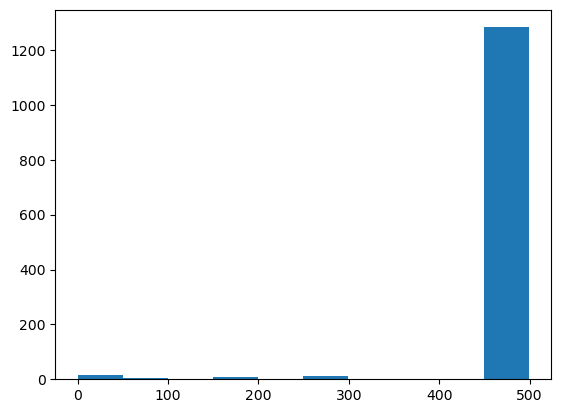

In [25]:
plt.hist(gdf_intermit.max_window)

In [26]:
# median_dist = np.array(median_dist)

In [27]:
# len(mean_dist)

In [28]:
# median_dist = median_dist[gdf_intermit.max_window == 499]
gdf_intermit = gdf_intermit[gdf_intermit.max_window == 499]

In [29]:
# gdf_intermit = gdf_intermit[gdf_intermit.max_window == 29]
# gdf_intermit = gdf_intermit[gdf_intermit.max_window == 300]
# gdf_intermit = gdf_intermit[gdf_intermit.max_window == 3000]

In [30]:
len(gdf_intermit)

1283

filter ones that dont cover enough distance

In [31]:
# at 4 m/s we would expect this many km
4 * 60 * 500 / 1000

120.0

In [32]:
np.median(gdf_intermit.max_dist)

100.32124951301677

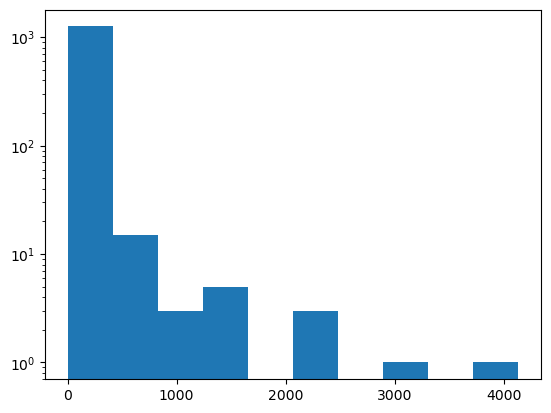

In [33]:
plt.hist(gdf_intermit.max_dist)
plt.yscale('log')

filter out a few transects that are too long

In [34]:
# median_dist = median_dist[gdf_intermit.max_dist < 200]
gdf_intermit = gdf_intermit[gdf_intermit.max_dist < 200]


In [35]:
# gdf_intermit = gdf_intermit[gdf_intermit.max_dist < 15]
# gdf_intermit = gdf_intermit[gdf_intermit.max_dist < 150]
# gdf_intermit = gdf_intermit[gdf_intermit.max_dist < 1500]

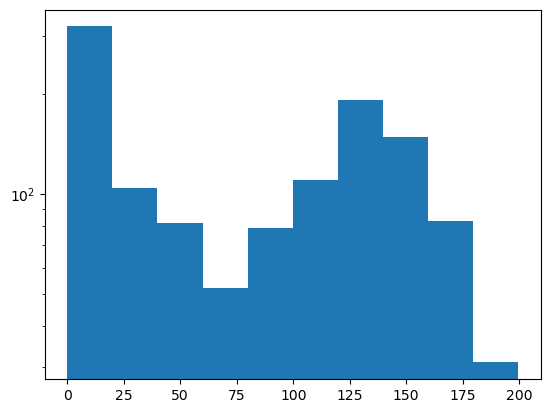

In [36]:
plt.hist(gdf_intermit.max_dist)
plt.yscale('log')

In [37]:
len(gdf_intermit)

1204

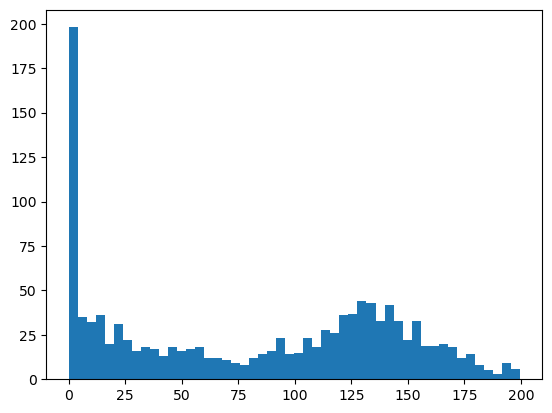

In [38]:
plt.hist(gdf_intermit.max_dist,bins=50)
plt.show()

In [39]:
# this would be under X m/s
20 / (60 * 500 / 1000)

0.6666666666666666

In [40]:
# this would be under X m/s
1 / (60 * 30 / 1000)

0.5555555555555556

In [41]:
# gdf_intermit = gdf_intermit[gdf_intermit.max_dist > 1]
# gdf_intermit = gdf_intermit[gdf_intermit.max_dist > 10]
# gdf_intermit = gdf_intermit[gdf_intermit.max_dist > 100]

In [42]:
# median_dist = median_dist[gdf_intermit.max_dist > 20]
gdf_intermit = gdf_intermit[gdf_intermit.max_dist > 20]


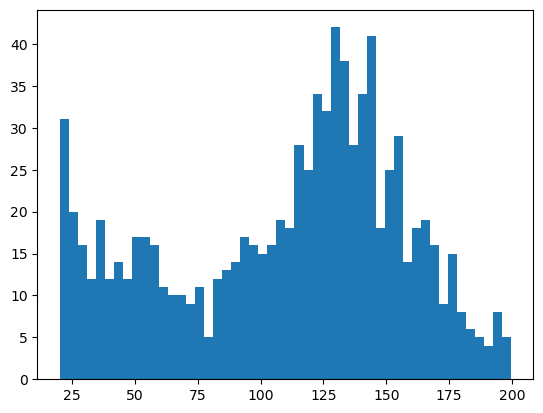

In [43]:
plt.hist(gdf_intermit.max_dist,bins=50)
plt.show()

In [44]:
len(gdf_intermit)

883

#### filter ones that span too much time

In [45]:
# we would expect this many seconds
500*60

30000

In [46]:
# we would expect this many seconds
30*60

1800

In [47]:
# we would expect this many seconds
300*60

18000

In [48]:
# gdf_intermit = gdf_intermit[gdf_intermit.seconds_elapsed < 30*60*2]
# gdf_intermit = gdf_intermit[gdf_intermit.seconds_elapsed < 300*60*2]
# gdf_intermit = gdf_intermit[gdf_intermit.seconds_elapsed < 3000*60*2]

In [49]:
500*60*2

60000

In [50]:
500/60*2

16.666666666666668

In [51]:
# median_dist = median_dist[gdf_intermit.seconds_elapsed < 500*60*3]
gdf_intermit = gdf_intermit[gdf_intermit.seconds_elapsed < 500*60*3]


In [52]:
len(gdf_intermit)

820

In [53]:
# fig, ax = plt.subplots(figsize=(10,3), subplot_kw=dict(projection=crs.Robinson(central_longitude=180)))
# ax.coastlines(resolution='10m')
# gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

# robinson = crs.Robinson(central_longitude=180).proj4_init
# gdf_intermit.to_crs(robinson).plot(ax=ax,column=median_dist,legend=True, cmap='viridis')

# ax.set_title('mean_dist')

# # plt.savefig('chla_intermittency_map.png',dpi=300)

# plt.show()

In [56]:
# plt.hist(median_dist,bins=35)
# plt.xlabel('median distance between samples')
# plt.ylabel('count')
# plt.tight_layout()
# plt.savefig('figs/median_dist_between_samples.png',dpi=300)
# plt.show()

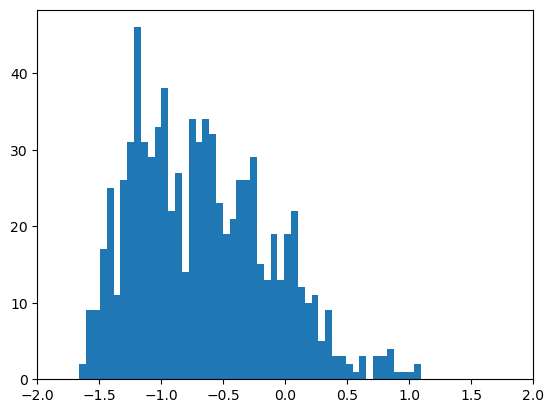

In [57]:
plt.hist(np.log10(gdf_intermit.chla),bins=50)
plt.xlim(-2,2)
# plt.yscale('log'r)
plt.show()

### Autocorrelation of gamma chla and gamma t

In [58]:
# import necessary libraries
import pandas as pd

# create a sample series
series = pd.Series([1, 2, 6, 4, 5, 6, 7, 8, 9, 20])

# use pandas rolling() and corr()
result = series.rolling(window=2)\
          .corr(series.shift(1))

# print the results
print(f"The autocorrelation is: {result.iloc[-1]}")

The autocorrelation is: 1.0


(-0.15, 0.6)

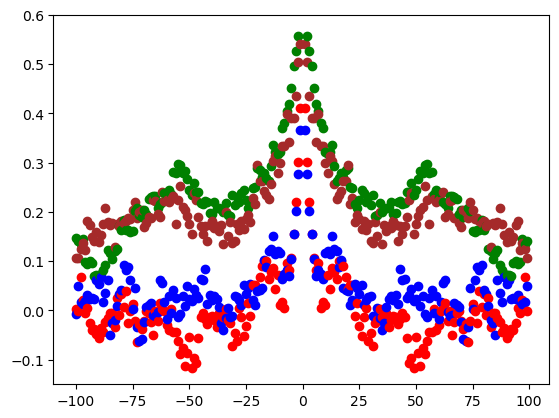

In [60]:
for i in range(-100,100):
    plt.scatter(i,gdf_intermit.c_slope.autocorr(i),c='green')
    plt.scatter(i,gdf_intermit.cp443_slope.autocorr(i),c='brown')
    plt.scatter(i,gdf_intermit.t_slope.autocorr(i),c='red')
    plt.scatter(i,gdf_intermit.s_slope.autocorr(i),c='blue')

plt.ylim(-0.15,.6)

### done with Tara processing

## now process MODIS data

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors, ticker
import xrft
import rioxarray
import xarray as xr
from netCDF4 import Dataset

Getting the dat:
1. MODIS filenames were download from https://oceandata.sci.gsfc.nasa.gov/api/file_search picking all data for August 11th 2016.
2. used wget to download all these files

In [92]:
import xarray as xr
from netCDF4 import Dataset

# fn = 'data/AQUA_MODIS.20200809T181001.L2.OC.nc' # west atlantic
# fn = 'data/AQUA_MODIS.20210321T193000.L2.OC.nc' # east pacific
# fn = 'data/AQUA_MODIS.20211005T221001.L2.OC.nc' # south pacific
fn = 'data/AQUA_MODIS.20041018T175501.L2.OC.nc' # 2002 west atlantic

xds = xr.open_dataset(fn)
dataset = Dataset(fn)

gd=dataset.groups['geophysical_data']
nav=dataset.groups['navigation_data']
lons = nav.variables["longitude"][:]
lats = nav.variables["latitude"][:]

flags= gd.variables["l2_flags"][:]

# create the chl dataset
chl_xds = xr.Dataset({'chlor_a':(('x', 'y'),gd.variables['chlor_a'][:].data)},
                    coords = {'latitude': (('x', 'y'), lats),
                              'longitude': (('x', 'y'), lons)},
                    attrs={'variable':'Chlorophyll-a'})

# merge back into the xarray dataset with all the attributes
xds['chlor_a'] = chl_xds.chlor_a
# replace nodata areas with nan
xds = xds.where(xds['chlor_a'] != -32767.0)
xds['chlor_a'] = xr.where(flags.data==0, xds['chlor_a'], np.nan)

# fn = 'data/AQUA_MODIS.20200809T181001.L2.SST.nc' # west atlantic
# fn = 'data/AQUA_MODIS.20210321T193000.L2.SST.nc' # east pacific
# fn = 'data/AQUA_MODIS.20211005T221001.L2.SST.nc' # south pacific
fn = 'data/AQUA_MODIS.20041018T175506.L2.SST.nc' # 2002 west atlantic
dataset = Dataset(fn)

gd=dataset.groups['geophysical_data']
nav=dataset.groups['navigation_data']
lons = nav.variables["longitude"][:]
lats = nav.variables["latitude"][:]

flags= gd.variables["l2_flags"][:]

# create the sst dataset
sst_xds = xr.Dataset({'sst':(('x', 'y'),gd.variables['sst'][:].data)},
                    coords = {'latitude': (('x', 'y'), lats),
                              'longitude': (('x', 'y'), lons)},
                    attrs={'variable':'Sea Surface Temp'})

# merge back into the xarray dataset with all the attributes
xds['sst'] = sst_xds.sst
# replace nodata areas with nan
xds = xds.where(xds['sst'] != -32767.0)

# only use data with a good flag
xds['sst'] = xr.where(flags.data==0, xds['sst'], np.nan)


In [93]:
gd.variables.keys()

dict_keys(['sst', 'qual_sst', 'flags_sst', 'bias_sst', 'stdv_sst', 'sstref', 'l2_flags'])

In [10]:
import xarray as xr
from netCDF4 import Dataset

def grab_modis_oc(fn, sst_fn=False, full_flag=True):
    # create the initial dataset so that we have all the attributes
    xds = xr.open_dataset(fn)
    # open the file with netCDF to get all the actual data
    dataset = Dataset(fn)

    gd    = dataset.groups['geophysical_data']
    nav   = dataset.groups['navigation_data']
    lons  = nav.variables["longitude"][:]
    lats  = nav.variables["latitude"][:]
    flags = gd.variables["l2_flags"][:]

    # create the chl dataset, now we're only adding in chla
    # but the options are: ['aot_869', 'angstrom', 'Rrs_412', 'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555', 'Rrs_645', 'Rrs_667', 'Rrs_678', 'chlor_a', 'Kd_490', 'pic', 'poc', 'ipar', 'nflh', 'par', 'l2_flags']

    chl_xds = xr.Dataset({'chlor_a':(('x', 'y'),gd.variables['chlor_a'][:].data)},
                        coords = {'latitude': (('x', 'y'), lats),
                                  'longitude': (('x', 'y'), lons)},
                        attrs={'variable':'Chlorophyll-a'})

    # merge back into the xarray dataset with all the attributes
    xds['chlor_a'] = chl_xds.chlor_a
    # replace nodata areas with nan
    xds = xds.where(xds['chlor_a'] != -32767.0)
    # eliminate everything that isn't a flag bit of 0 (meaning no flags)
    if full_flag:
        xds['chlor_a'] = xr.where(flags.data==0, xds['chlor_a'], np.nan)

    if sst_fn:
        dataset = Dataset(sst_fn)

        gd=dataset.groups['geophysical_data']
        nav=dataset.groups['navigation_data']
        lons = nav.variables["longitude"][:]
        lats = nav.variables["latitude"][:]

        flags= gd.variables["l2_flags"][:]

        # create the sst dataset
        # full options are ['sst', 'qual_sst', 'flags_sst', 'bias_sst', 'stdv_sst', 'sstref', 'l2_flags']
        sst_xds = xr.Dataset({'sst':(('x', 'y'),gd.variables['sst'][:].data)},
                            coords = {'latitude': (('x', 'y'), lats),
                                      'longitude': (('x', 'y'), lons)},
                            attrs={'variable':'Sea Surface Temp'})

        # merge back into the xarray dataset with all the attributes
        xds['sst'] = sst_xds.sst
        # replace nodata areas with nan
        xds = xds.where(xds['sst'] != -32767.0)

        # only use data with a good flag
        if full_flag:
            xds['sst'] = xr.where(flags.data==0, xds['sst'], np.nan)
        
    return(xds)

In [11]:
import glob
fns = glob.glob("data/modis/*OC.nc")

In [12]:
import glob
sst_fns = glob.glob("data/modis/*SST.nc")

In [13]:
fns.sort()
sst_fns.sort()

In [14]:
len(fns)

5113

In [19]:
len(sst_fns)

8925

In [15]:
# fns_old = fns.copy()

In [130]:
import warnings
warnings.filterwarnings("ignore")

In [17]:
fns[0],fns[-1]

('data/modis/AQUA_MODIS.20160801T000501.L2.OC.nc',
 'data/modis/AQUA_MODIS.20160831T235501.L2.OC.nc')

In [18]:
sst_fns[0],sst_fns[-1]

('data/modis/AQUA_MODIS.20160801T000010.L2.SST.nc',
 'data/modis/AQUA_MODIS.20160831T235510.L2.SST.nc')

here we could premake an xarray grid and then assign values at specific points in that grid as we move through the loop



In [22]:
fns[0].split('.')[1]

'20160801T000501'

In [23]:
from datetime import datetime
datetime.strptime(fns[0].split('.')[1], '%Y%m%dT%H%M%S')

datetime.datetime(2016, 8, 1, 0, 5, 1)

In [48]:
# iterate over sections of the dataset

mean_dist_per_leg = 1 # kilometers

window_t = None

transect_c_slope = []
transect_t_slope = []
chla_mean = []
lat = []
lon = []

t_mean = []
dates = []
dt_dates = []

large_chla_var = []
small_chla_var = []

large_t_var = []
small_t_var = []

max_window_calculated = []

step = 75
min_win = 3

win_sizes = [int(x) for x in np.logspace(np.log10(min_win), np.log10(step),num=11)]

# loop through images here

run_sst = True

for idx, fn in enumerate(fns):
    if idx < 2887:
        continue
    print('NOW runnning ' +str(idx) +' '+ fn)
    current_date = fn.split('.')[1]
    try:
        # grabbing a matching sst image within 1 minute
        xds = grab_modis_oc(fn, glob.glob(fn[:-11]+'*.SST.nc')[0], full_flag=True)
    except (OSError,KeyError):
        print('*** os error, likely corrupt file? ' +str(idx) +' '+ fn)
        continue
    
    for x in range(0,xds.chlor_a.shape[0],step):
        for y in range(0,xds.chlor_a.shape[1],step):    
            # ensure there are at least 70% of samples in the full window
            if xds.chlor_a[x:x+step,y:y+step].count().values/step**2 < 0.7:
                continue
            if run_sst:
                if xds.sst[x:x+step,y:y+step].count().values/step**2 < 0.7:
                    continue

            chla_var = []
            temp_var = []

            # the actual calculation
            for window_s in win_sizes:
                chla_var.append(xds.chlor_a[x:x+step,y:y+step].rolling(x=window_s,y=window_s,center=True,min_periods=window_s**2*.7).var().mean().values)
                if run_sst:
                    temp_var.append(xds.sst[x:x+step,y:y+step].rolling(x=window_s,y=window_s,center=True,min_periods=window_s**2*.7).var().mean().values)

            c_var = np.array(chla_var)
            if run_sst:
                t_var = np.array(temp_var)

            win_sizes = np.array(win_sizes)

            try:
                m_chla,b_c = np.polyfit(np.log(win_sizes[c_var == c_var]*mean_dist_per_leg),np.log(c_var[c_var == c_var]), 1)
            except TypeError as e:
                print('caught chla LH polyfit exception')
                m_chla = np.nan
                b_c = np.nan
            if run_sst:
                try:
                    m_temp,b_t = np.polyfit(np.log(win_sizes[t_var == t_var]*mean_dist_per_leg),np.log(t_var[t_var == t_var]), 1)
                except TypeError as e:
                    print('caught T/S polyfit exception')
                    m_temp = np.nan
                    b_t = np.nan

            small_var_win = min_win+2

            large_chla_var.append(xds.chlor_a[x:x+step,y:y+step].var().values)
            small_chla_var.append(xds.chlor_a[x:x+step,y:y+step].rolling(x=small_var_win,y=small_var_win,center=True,min_periods=small_var_win**2*.7).var().mean().values)
            
            if run_sst:
                large_t_var.append(xds.sst[x:x+step,y:y+step].var().values)
                small_t_var.append(xds.sst[x:x+step,y:y+step].rolling(x=small_var_win,y=small_var_win,center=True,min_periods=small_var_win**2*.7).var().mean().values)
                transect_t_slope.append(m_temp)
                t_mean.append(xds.sst[x:x+step,y:y+step].mean().values)
            else:
                large_t_var.append(np.nan)
                small_t_var.append(np.nan)
                transect_t_slope.append(np.nan)
                t_mean.append(np.nan)
                
            transect_c_slope.append(m_chla)
            chla_mean.append(xds.chlor_a[x:x+step,y:y+step].mean().values)
            
            dates.append(current_date)
            dt_dates.append(datetime.strptime(current_date, '%Y%m%dT%H%M%S'))


            lat.append(xds.chlor_a[x:x+step,y:y+step].latitude.mean().values)
            lon.append(xds.chlor_a[x:x+step,y:y+step].longitude.mean().values)

    #             fig, ax = plt.subplots(1,2,figsize=(15,5))
    #             ax[0].plot(gdf_subset.index, gdf_subset.t,c='red', ls='--')

    #             ax2 = ax[0].twinx()
    #             ax2.plot(gdf_subset.index, gdf_subset.Chl_lineheight,c='green', label='chla line height')

    #             outward_scale = 75

    #             ax[0].tick_params(axis='x', rotation=0)

    #             ax[0].set_ylabel('temp [C]')
    #             ax[0].yaxis.label.set_color('red')

    #             ax2.set_ylabel('chla line height')
    #             ax2.yaxis.label.set_color('green')

    #             ax[1].scatter(np.log(win_sizes),np.log(c_var),c='green')
    #             # ax[1].set_ylim(-13,3)
    #             ax[1].scatter(np.log(win_sizes),np.log(t_var),c='red')
    #             ax[0].set_xlabel('Distance')
    #             ax[1].set_xlabel('ln(length)')
    #             ax[1].set_ylabel('ln(variance)')

    #             ax[1].axline(xy1=(0, b_c), slope=m_chla, label=f'$y = {m_chla:.2f}x {b_c:+.2f}$', ls='-',c='green')

    #             ax[1].axline(xy1=(0, b_t), slope=m_temp, label=f'$y = {m_temp:.2f}x {b_t:+.2f}$', ls='--',c='red')
    #             ax[1].legend(loc='lower right')

    #             fig.tight_layout()
    #             plt.show()

NOW runnning 2887 data/modis/AQUA_MODIS.20160818T125000.L2.OC.nc
NOW runnning 2888 data/modis/AQUA_MODIS.20160818T125501.L2.OC.nc
NOW runnning 2889 data/modis/AQUA_MODIS.20160818T130001.L2.OC.nc
NOW runnning 2890 data/modis/AQUA_MODIS.20160818T130501.L2.OC.nc
NOW runnning 2891 data/modis/AQUA_MODIS.20160818T131001.L2.OC.nc
NOW runnning 2892 data/modis/AQUA_MODIS.20160818T135501.L2.OC.nc
NOW runnning 2893 data/modis/AQUA_MODIS.20160818T140001.L2.OC.nc
NOW runnning 2894 data/modis/AQUA_MODIS.20160818T140501.L2.OC.nc
NOW runnning 2895 data/modis/AQUA_MODIS.20160818T141001.L2.OC.nc
NOW runnning 2896 data/modis/AQUA_MODIS.20160818T141501.L2.OC.nc
NOW runnning 2897 data/modis/AQUA_MODIS.20160818T142000.L2.OC.nc
NOW runnning 2898 data/modis/AQUA_MODIS.20160818T142500.L2.OC.nc
NOW runnning 2899 data/modis/AQUA_MODIS.20160818T143000.L2.OC.nc
NOW runnning 2900 data/modis/AQUA_MODIS.20160818T143500.L2.OC.nc
NOW runnning 2901 data/modis/AQUA_MODIS.20160818T144001.L2.OC.nc
NOW runnning 2902 data/mo

In [30]:
1

1

In [49]:
df = pd.DataFrame({'lat':np.array(lat),'lon':np.array(lon), 'c_slope': np.array(transect_c_slope),
                  't_slope': np.array(transect_t_slope), 't_mean' : np.array(t_mean), 
                   'chla': np.array(chla_mean), 'large_t_var' : np.array(large_t_var), 
                   'small_t_var' : np.array(small_t_var), 'large_var' : np.array(large_chla_var), 
                   'small_var' : np.array(small_chla_var), 'dates' : np.array(dt_dates)})

In [50]:
# df.to_csv('data/df_modis_08_2016_part2.csv')

In [32]:
# df.to_csv('data/df_modis_08_2016_part1.csv')

In [124]:
df_part1 = pd.read_csv('data/df_modis_08_2016_part1.csv')

In [125]:
df_part2 = pd.read_csv('data/df_modis_08_2016_part2.csv')

In [126]:
df = pd.concat([df_part1, df_part2])

In [127]:
df

,Unnamed: 0,lat,lon,c_slope,t_slope,t_mean,chla,large_t_var,small_t_var,large_var,small_var,dates
0,0,-35.552520,-148.73297,0.533052,0.418735,14.119955,0.120680,0.042351,0.009878,0.000047,9.112167e-06,2016-08-01 00:15:01
1,1,-35.956917,-150.95813,0.462601,0.379918,14.134510,0.124248,0.044285,0.016531,0.000041,1.003969e-05,2016-08-01 00:15:01
2,2,-17.733053,-154.11990,0.813525,0.405488,26.833546,0.036962,0.071629,0.025459,0.000018,1.751105e-06,2016-08-01 00:20:01
3,3,-18.166056,-156.81800,0.629326,0.465801,26.509995,0.030627,0.093100,0.021236,0.000005,9.681756e-07,2016-08-01 00:20:01
4,4,-17.235487,-155.30002,0.771445,0.753225,26.960032,0.031244,0.339764,0.046892,0.000008,1.086711e-06,2016-08-01 00:20:01
...,...,...,...,...,...,...,...,...,...,...,...,...
6753,6753,33.139114,-155.39750,0.502271,0.684474,23.706034,0.042864,0.370214,0.069146,0.000013,3.519639e-06,2016-08-31 23:50:01
6754,6754,58.287790,-164.29878,0.794600,0.552276,13.868999,1.777322,0.059292,0.012819,0.060508,8.352693e-03,2016-08-31 23:55:01
6755,6755,58.127600,-165.73105,0.858704,0.443450,13.763664,1.961663,0.032363,0.008488,0.133901,1.468938e-02,2016-08-31 23:55:01
6756,6756,61.027355,-170.31398,1.004829,0.679585,11.269236,1.145785,0.077075,0.012439,0.054510,3.608659e-03,2016-08-31 23:55:01


In [128]:
# define your target grid however you'd like
y = np.linspace(-90, 90, 180)
x = np.linspace(-180, 180, 180)
# broadcast these against eachother to get every combo of x, y points
xx, yy = np.meshgrid(x, y)

yy = yy.flatten()
xx = xx.flatten()

In [131]:
for i in range(len(xx)):
    new_row = {'lat':yy[i], 'lon':xx[i], 'c_slope':np.nan, 't_slope':np.nan, 't_mean':np.nan, 
               'chla':np.nan, 'large_t_var':np.nan,'small_t_var':np.nan, 'large_var':np.nan, 'small_var':np.nan}
    df = df.append(new_row, ignore_index=True)

In [132]:
gdf_modis = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lon, df.lat), crs="EPSG:4326"
)

In [41]:
# gdf_modis.to_feather('data/gdf_modis_0108to1108.feather')

In [42]:
# gdf_modis.to_feather('data/gdf_modis_1108to1508.feather')

In [43]:
# gdf_modis_old = gpd.read_feather('data/gdf_modis_1108to1508.feather')

In [44]:
# gdf_modis = pd.concat([gdf_modis_old, gdf_modis])

In [120]:
# gdf_modis = gpd.read_feather('data/gdf_modis.feather')

In [133]:
gdf_modis = gdf_modis.assign(lon = lambda x: np.round(x.lon,0))
gdf_modis = gdf_modis.assign(lat = lambda x: np.round(x.lat,0))
gdf_modis_grouped = gdf_modis.groupby(["lat", "lon"]).mean()

In [134]:
ds_modis = gdf_modis_grouped.to_xarray()

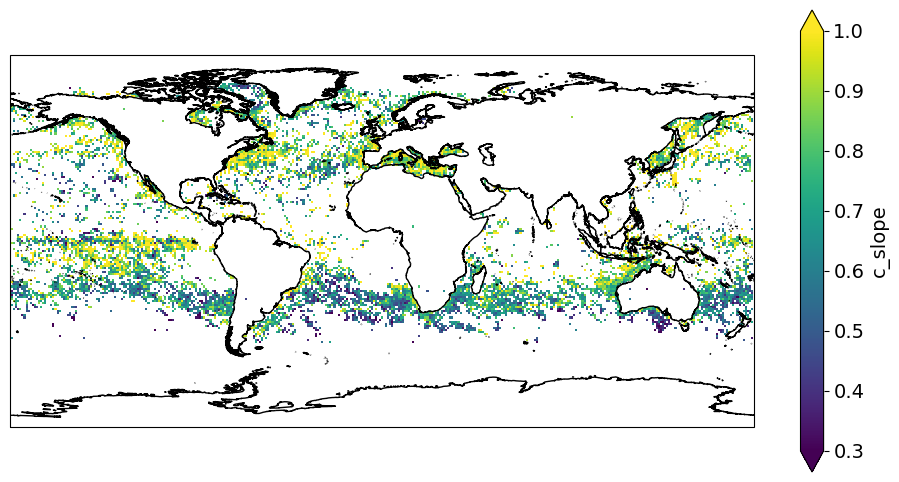

In [135]:
fig, ax = plt.subplots(figsize=(12,6),subplot_kw=dict(projection=crs.PlateCarree()))

ax.coastlines(resolution='10m')

ds_modis.c_slope.plot(ax=ax, x='lon', y='lat', cmap='viridis', vmin=0.3,vmax=1)

plt.show()

In [156]:
plt.rcParams.update({'font.size': 14})

In [137]:
ds_modis.coarsen(lon=2,lat=2,boundary='pad').mean()

<xarray.Dataset>
Dimensions:      (lat: 91, lon: 181)
Coordinates:
  * lat          (lat) float64 -89.5 -87.5 -85.5 -83.5 ... 84.5 86.5 88.5 90.0
  * lon          (lon) float64 -179.5 -177.5 -175.5 -173.5 ... 176.5 178.5 180.0
Data variables:
    Unnamed: 0   (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    c_slope      (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    t_slope      (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    t_mean       (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    chla         (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    large_t_var  (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    small_t_var  (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    large_var    (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan
    small_var    (lat, lon) float64 nan nan nan nan nan ... nan nan nan nan nan

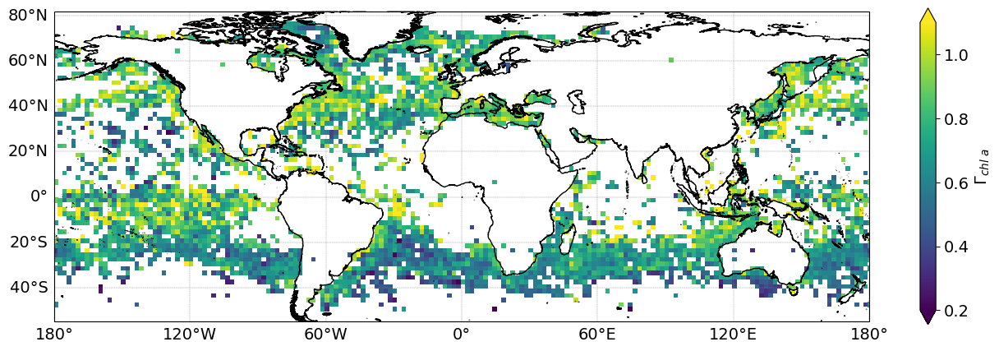

In [143]:
fig, ax = plt.subplots(figsize=(16,5),subplot_kw=dict(projection=crs.PlateCarree()))

ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.3, draw_labels=True)
gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

ds_modis.coarsen(lon=2,lat=2,boundary='pad').mean().c_slope.plot(ax=ax, x='lon', y='lat', cmap='viridis', 
                                                 vmin=0.2,vmax=1.1,cbar_kwargs={'label': "$Γ_{chl\ a}$"})

ax.set_ylim(-55,82)

plt.savefig('variance_slope_c_global.png',dpi=300)
plt.show()

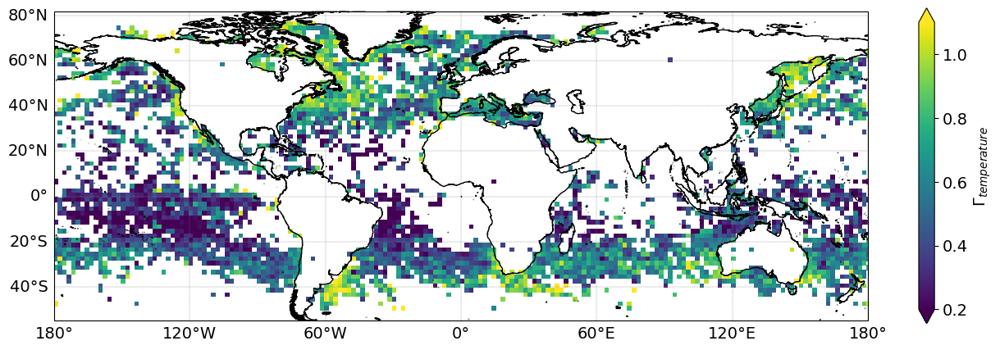

In [142]:
fig, ax = plt.subplots(figsize=(16,5),subplot_kw=dict(projection=crs.PlateCarree()))

ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.3, draw_labels=True)
gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

ds_modis.coarsen(lon=2,lat=2,boundary='pad').mean().t_slope.plot(ax=ax, x='lon', y='lat', cmap='viridis', 
                                                     vmin=0.2,vmax=1.1, cbar_kwargs={'label': "$Γ_{temperature}$"})

ax.set_ylim(-55,82)

plt.savefig('variance_slope_t_global.png',dpi=300)
plt.show()

Text(0, 0.5, 'temp var slope')

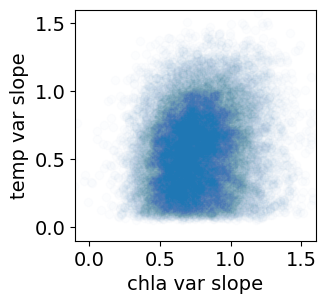

In [83]:
fig, ax = plt.subplots(figsize=(3.1,3))

plt.scatter(gdf_modis.c_slope,gdf_modis.t_slope,alpha=0.01)
plt.xlim(-.1,1.6)
plt.ylim(-.1,1.6)
# plt.axhline(.5,c='k',ls='--')
# plt.axvline(.5,c='k',ls='--')
plt.xlabel('chla var slope')
plt.ylabel('temp var slope')

# plt.savefig('south_pacific_slope_comparison.png',dpi=300)

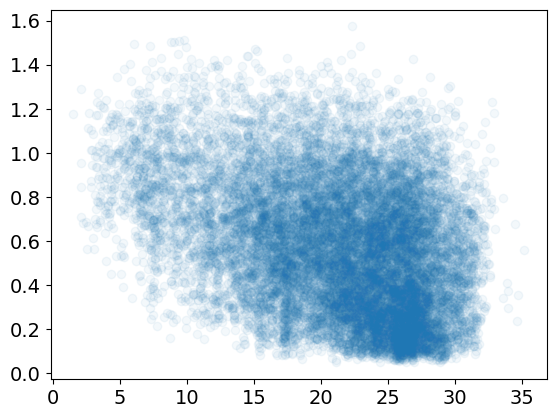

In [40]:
plt.scatter(gdf_modis.t_mean,gdf_modis.t_slope,alpha=0.05)
# plt.xscale('log')

(-0.2, 1.5)

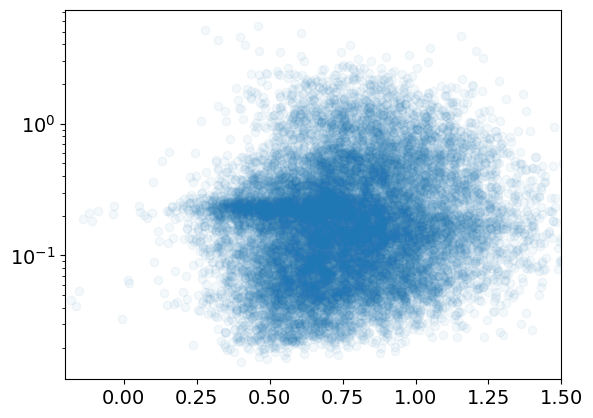

In [41]:
plt.scatter(gdf_modis.c_slope,gdf_modis.chla,alpha=0.05)
plt.yscale('log')
plt.xlim(-0.2,1.5)

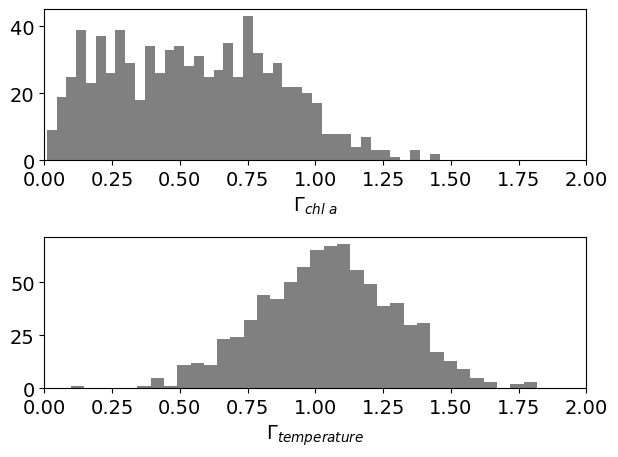

In [158]:
fig, ax = plt.subplots(2,1)
ax[0].hist(gdf_intermit.c_slope,color='grey',bins=40)
ax[0].set_xlim(0,2)
# ax[0].set_ylim(0,55)
ax[0].set_xlabel('$Γ_{chl\ a}$')
ax[1].hist(gdf_intermit.t_slope,color='grey',bins=40)
ax[1].set_xlim(0,2)
# ax[1].set_ylim(0,55)
ax[1].set_xlabel('$Γ_{temperature}$')
fig.tight_layout()
plt.savefig('figures/t_chla_hist_comparison_tara.png',dpi=300, transparent=True)
plt.show()

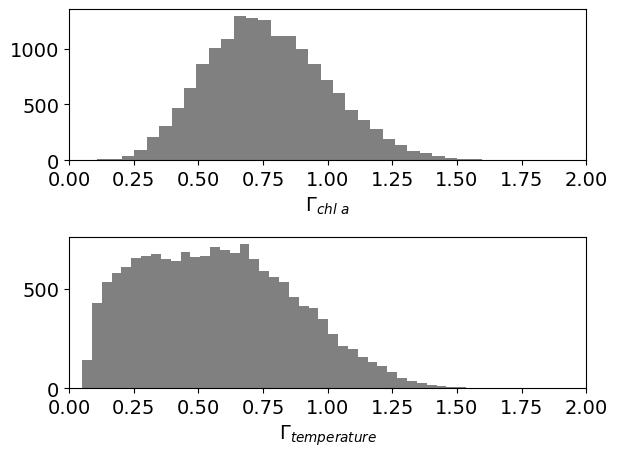

In [145]:
fig, ax = plt.subplots(2,1)
ax[0].hist(gdf_modis.c_slope,color='grey',bins=40)
ax[0].set_xlim(0,2)
# ax[0].set_ylim(0,55)
ax[0].set_xlabel('$Γ_{chl\ a}$')
ax[1].hist(gdf_modis.t_slope,color='grey',bins=40)
ax[1].set_xlim(0,2)
# ax[1].set_ylim(0,55)
ax[1].set_xlabel('$Γ_{temperature}$')
fig.tight_layout()
plt.savefig('t_chla_hist_comparison_modis.png',dpi=300, transparent=True)
plt.show()

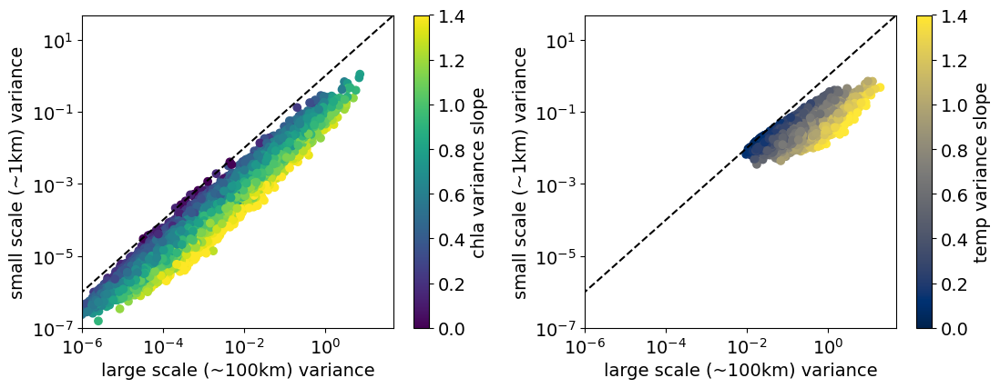

In [69]:
fig, ax = plt.subplots(1,2,figsize=(7.5*1.5,3*1.5))
im = ax[0].scatter(gdf_modis.large_var,gdf_modis.small_var,c=gdf_modis.c_slope,vmin=0.0,vmax=1.4)
fig.colorbar(im,label='chla variance slope')

im = ax[1].scatter(gdf_modis.large_t_var,gdf_modis.small_t_var,c=gdf_modis.t_slope,vmin=0.0,vmax=1.4, cmap='cividis')

fig.colorbar(im,label='temp variance slope')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('large scale (~100km) variance')
ax[0].set_ylabel('small scale (~1km) variance')
ax[0].set_xlim(10e-7,50)
ax[0].set_ylim(10e-8,50)
ax[0].plot([10e-8, 100], [10e-8, 100], ls="--",c='k')


ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('large scale (~100km) variance')
ax[1].set_ylabel('small scale (~1km) variance')
ax[1].set_xlim(10e-7,50)
ax[1].set_ylim(10e-8,50)
ax[1].plot([10e-8, 100], [10e-8, 100], ls="--",c='k')

fig.tight_layout()

plt.savefig('small_scale_var_large_c_t_aqua.png',dpi=300)
plt.show()

In [59]:
import scipy

In [186]:
plt.rcParams.update({'font.size': 14})

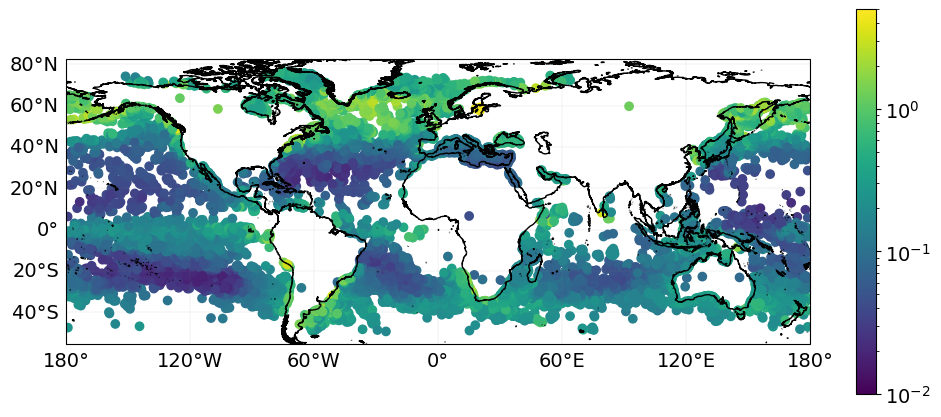

In [84]:
fig, ax = plt.subplots(figsize=(12,5), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')

gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

gdf_modis.plot(column='chla',legend=True,ax=ax,norm=colors.LogNorm(vmin=.01,vmax=5))

# plt.savefig('south_pacific_c_slope.png',dpi=300)

plt.show()

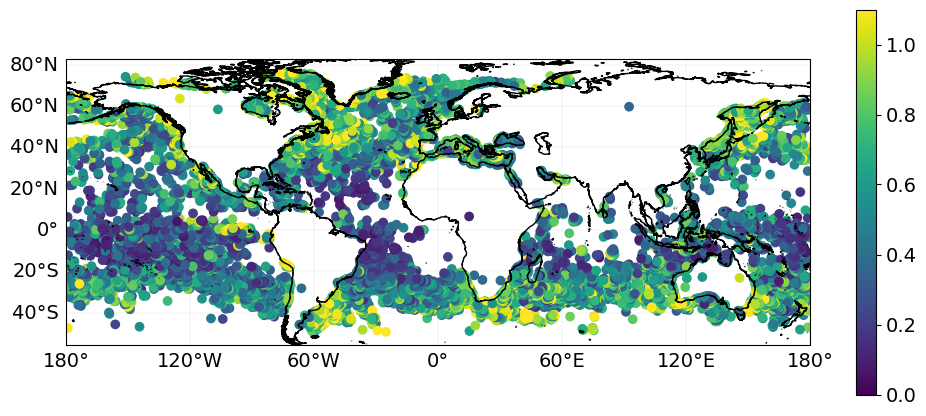

In [44]:
fig, ax = plt.subplots(figsize=(12,5), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')

gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

gdf_modis.plot(column='t_slope',legend=True,ax=ax,vmin=0.0,vmax=1.1)

# plt.savefig('south_pacific_c_slope.png',dpi=300)

plt.show()

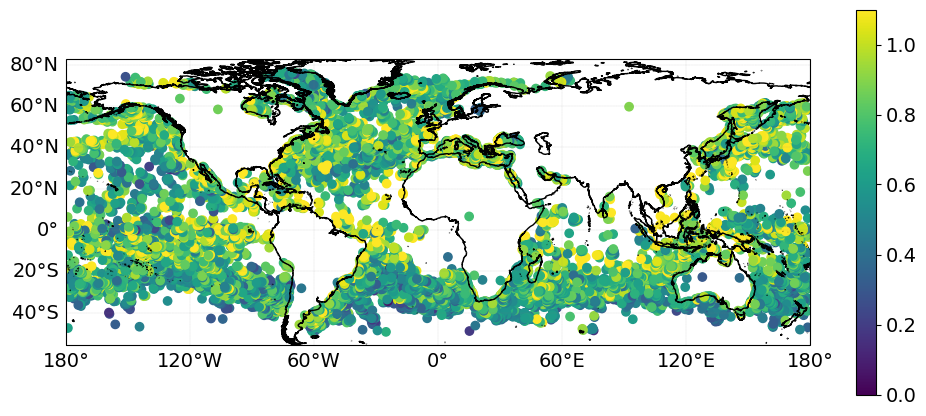

In [45]:
fig, ax = plt.subplots(figsize=(12,5), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')

gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

gdf_modis.plot(column='c_slope',legend=True,ax=ax,vmin=0.0,vmax=1.1)

# plt.savefig('south_pacific_c_slope.png',dpi=300)

plt.show()

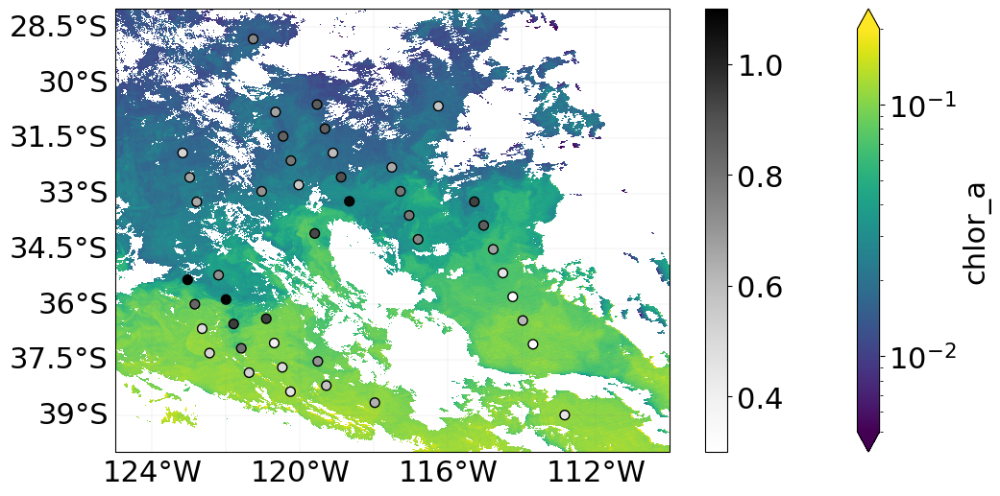

In [378]:
fig, ax = plt.subplots(figsize=(12,6),subplot_kw=dict(projection=crs.PlateCarree()))

ax.coastlines(resolution='10m')

xds.chlor_a.plot(ax=ax, x='longitude', y='latitude', cmap='viridis', norm=colors.LogNorm(vmin=.005,vmax=.2))

gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

# ax.scatter(xds_subset.chlor_a[300].longitude,xds_subset.chlor_a[300].latitude)
im = ax.scatter(gdf_modis.lon,gdf_modis.lat,c=gdf_modis.c_slope,s=50,vmin=0.3,vmax=1.1,cmap='Greys',edgecolor='k')
fig.colorbar(im)

# west atlantic
# ax.set_ylim(25,40)
# ax.set_xlim(-78,-66)

# south pacific
ax.set_ylim(-40,-28)
ax.set_xlim(-125,-110)

plt.savefig('south_pacific_chla_2d.png',dpi=300)

plt.show()

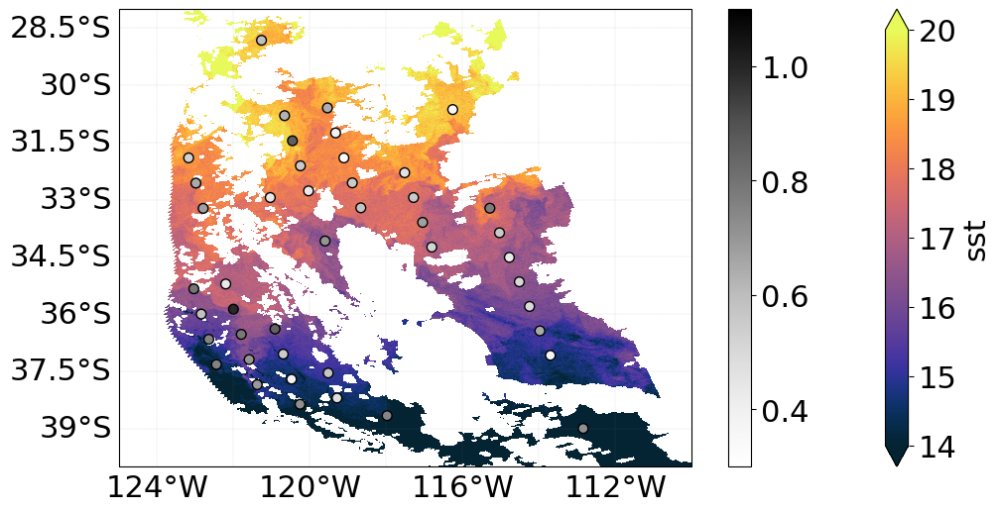

In [379]:
fig, ax = plt.subplots(figsize=(12,6),subplot_kw=dict(projection=crs.PlateCarree()))

ax.coastlines(resolution='10m')

xds.sst.plot(ax=ax, x='longitude', y='latitude', vmin=14, vmax=20, cmap=cmocean.cm.thermal)

gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

# ax.scatter(xds_subset.chlor_a[300].longitude,xds_subset.chlor_a[300].latitude)
im = ax.scatter(gdf_modis.lon,gdf_modis.lat,c=gdf_modis.t_slope,s=50,vmin=0.3,vmax=1.1,cmap='Greys',edgecolor='k')
fig.colorbar(im)

# west atlantic
# ax.set_ylim(25,40)
# ax.set_xlim(-78,-66)

# south pacific
ax.set_ylim(-40,-28)
ax.set_xlim(-125,-110)

plt.savefig('south_pacific_sst_2d.png',dpi=300)

plt.show()

In [46]:
xds_subset = xds.where((xds.latitude>=-32) & (xds.latitude<=-31), drop=True)
xds_subset = xds_subset.where((xds_subset.longitude>=-121) & (xds_subset.longitude<=-120), drop=True)

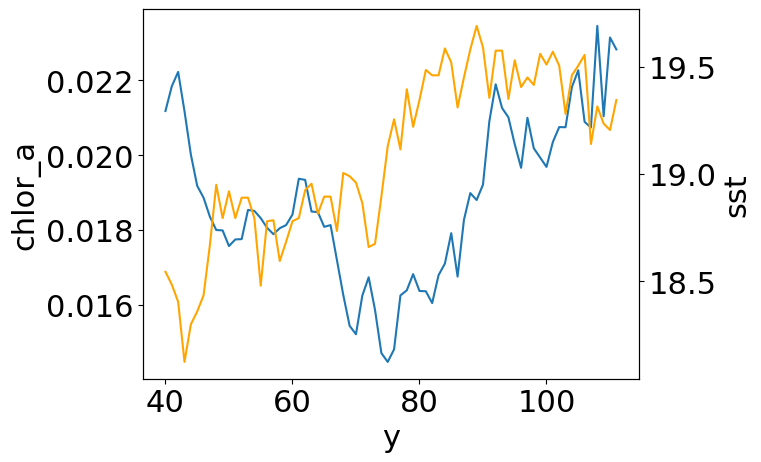

In [48]:
fig, ax = plt.subplots()

xds_subset.chlor_a[300].plot(ax=ax)
ax2 = ax.twinx()
xds_subset.sst[300].plot(ax=ax2,c='orange')

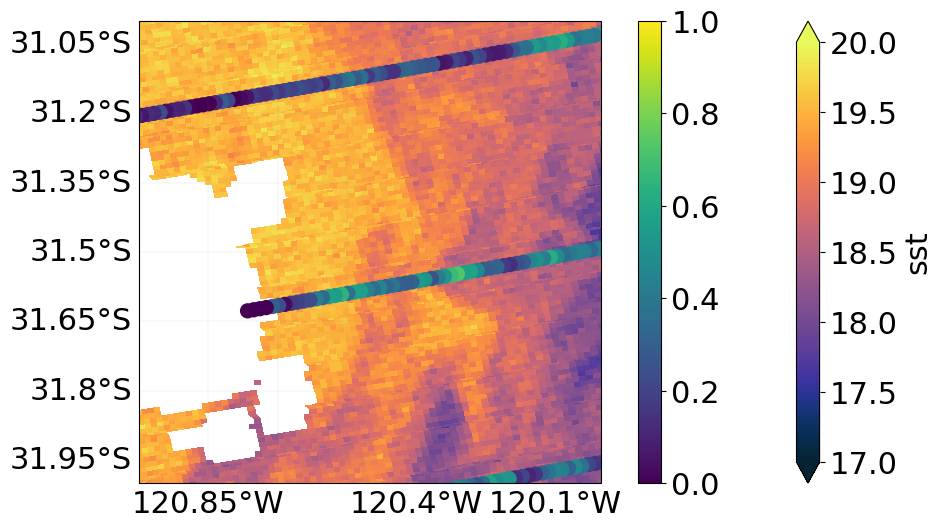

In [50]:
fig, ax = plt.subplots(figsize=(12,6),subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
xds.sst.plot(ax=ax, x='longitude', y='latitude', vmin=17, vmax=20, cmap=cmocean.cm.thermal)

gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

# ax.scatter(xds_subset.chlor_a[300].longitude,xds_subset.chlor_a[300].latitude)

im = ax.scatter(gdf_modis.lon,gdf_modis.lat,c=gdf_modis.t_slope,s=100,vmin=0,vmax=1)
fig.colorbar(im)


ax.set_ylim(-32,-31)
ax.set_xlim(-121,-120)

# plt.savefig('south_pacific_temp.png',dpi=300)

plt.show()

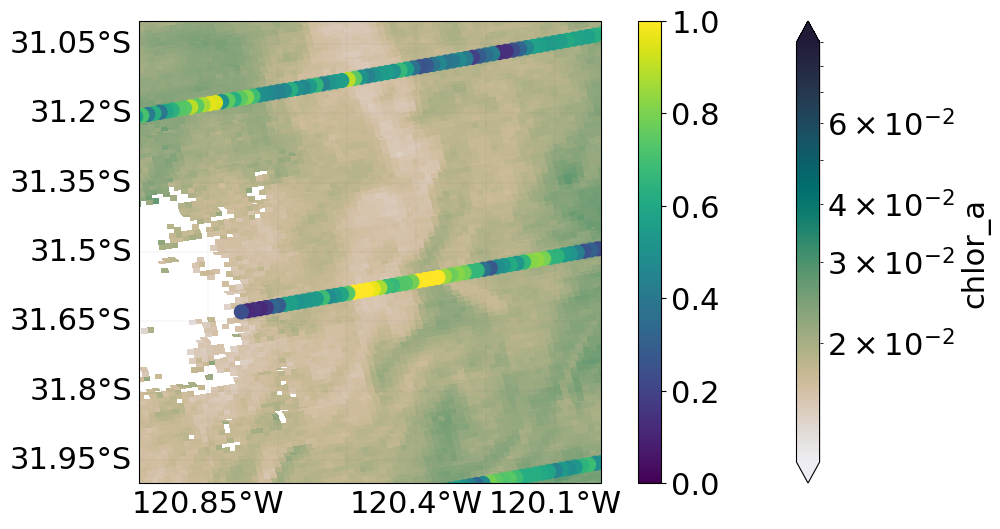

In [51]:
fig, ax = plt.subplots(figsize=(12,6),subplot_kw=dict(projection=crs.PlateCarree()))

ax.coastlines(resolution='10m')

xds.chlor_a.plot(ax=ax, x='longitude', y='latitude', cmap=cmocean.cm.rain, norm=colors.LogNorm(vmin=.011,vmax=.09))

gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

# ax.scatter(xds_subset.chlor_a[300].longitude,xds_subset.chlor_a[300].latitude)
im = ax.scatter(gdf_modis.lon,gdf_modis.lat,c=gdf_modis.c_slope,s=100,vmin=0,vmax=1)
fig.colorbar(im)

ax.set_ylim(-32,-31)
ax.set_xlim(-121,-120)

# plt.savefig('south_pacific_chla_zoom.png',dpi=300)

plt.show()

In [135]:
xds_subset = xds.where((xds.latitude>=33) & (xds.latitude<=39), drop=True)
xds_subset = xds_subset.where((xds_subset.longitude>=-75) & (xds_subset.longitude<=--69), drop=True)

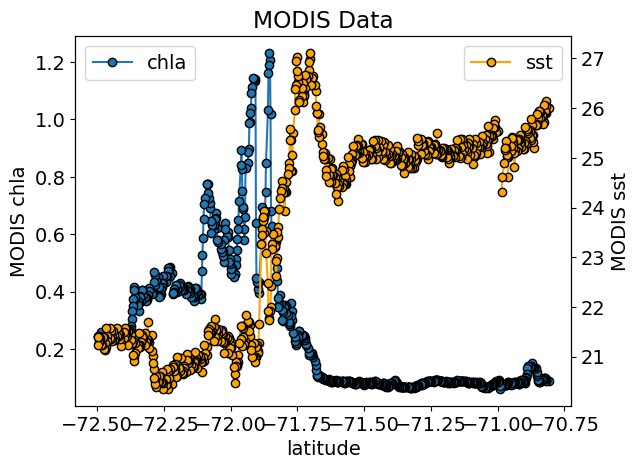

In [394]:
i = 625
fig, ax = plt.subplots()

ax.plot(xds_subset.longitude[:,i],xds_subset.chlor_a[:,i],marker='o',markeredgecolor='k',label='chla')
# ax.set_yscale('log')
ax2 = ax.twinx()
ax2.plot(xds_subset.longitude[:,i],xds_subset.sst[:,i],c='orange',marker='o',markeredgecolor='k',label='sst')

ax.legend(loc='upper left')
ax2.legend(loc='upper right')

# ax.set_ylim(0,.08)
# ax2.set_ylim(27.4,31)

ax.set_title('MODIS Data')
ax.set_xlabel('latitude')
ax.set_ylabel('MODIS chla')
ax2.set_ylabel('MODIS sst')

plt.savefig('MODIS_sargasso.png',dpi=300)

plt.show()

In [ ]:
starti = 5000
stopi = 25000

fig, ax = plt.subplots()
ax.plot(gdf[21000:23500].Chl_lineheight.rolling(7).mean()[::7],marker='o')
# ax.set_yscale('log')

axt = ax.twinx()
# axt.plot(gdf[starti:stopi].cp_gamma,c=cb_colors[1])

axt.plot(gdf[21000:23500].t.rolling(7).mean()[::7],c='orange',marker='o')
# axt2 = ax.twinx()

# gdf['cp447.9']
# axt.plot(gdf[starti:stopi].cp_gamma,c=cb_colors[1])

In [403]:
xds_subset = xds.where((xds.latitude>=25) & (xds.latitude<=32), drop=True)
xds_subset = xds_subset.where((xds_subset.longitude>=-70) & (xds_subset.longitude<=-64), drop=True)

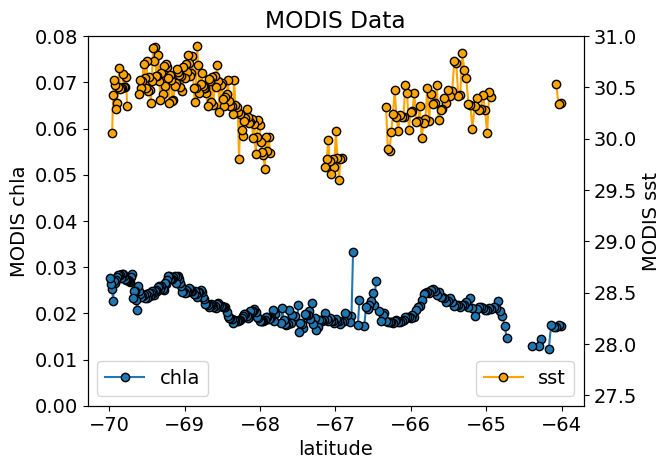

In [409]:
i = 475
fig, ax = plt.subplots()

ax.plot(xds_subset.longitude[i],xds_subset.chlor_a[i],marker='o',markeredgecolor='k',label='chla')
# ax.set_yscale('log')
ax2 = ax.twinx()
ax2.plot(xds_subset.longitude[i],xds_subset.sst[i],c='orange',marker='o',markeredgecolor='k',label='sst')

ax.legend(loc='lower left')
ax2.legend(loc='lower right')

ax.set_ylim(0,.08)
ax2.set_ylim(27.4,31)

ax.set_title('MODIS Data')
ax.set_xlabel('latitude')
ax.set_ylabel('MODIS chla')
ax2.set_ylabel('MODIS sst')

plt.savefig('MODIS_sargasso.png',dpi=300)

plt.show()

(array([2.000e+00, 0.000e+00, 3.000e+00, 1.600e+01, 3.600e+01, 2.700e+01,
        5.200e+01, 3.704e+03, 4.740e+03, 2.500e+02]),
 array([-5.45941619, -4.74384132, -4.02826644, -3.31269156, -2.59711668,
        -1.88154181, -1.16596693, -0.45039205,  0.26518283,  0.98075771,
         1.69633258]),
 <BarContainer object of 10 artists>)

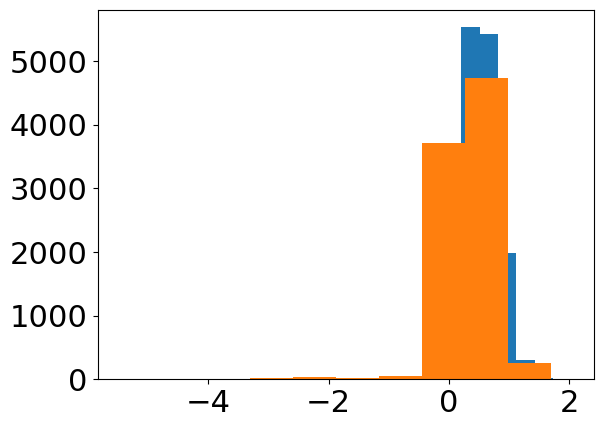

In [58]:
plt.hist(transect_c_slope)
plt.hist(transect_t_slope)

In [59]:
plt.rcParams.update({'font.size': 14})

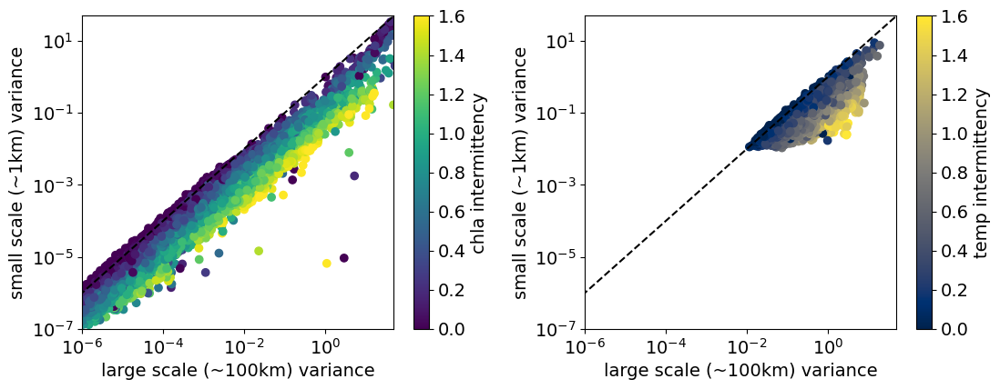

In [50]:
fig, ax = plt.subplots(1,2,figsize=(7.5*1.5,3*1.5))
im = ax[0].scatter(gdf_modis.large_var,gdf_modis.small_var,c=gdf_modis.c_slope,vmin=0.0,vmax=1.6)
fig.colorbar(im,label='chla intermittency')

im = ax[1].scatter(gdf_modis.large_t_var,gdf_modis.small_t_var,c=gdf_modis.t_slope,vmin=0.0,vmax=1.6, cmap='cividis')

fig.colorbar(im,label='temp intermittency')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('large scale (~100km) variance')
ax[0].set_ylabel('small scale (~1km) variance')
ax[0].set_xlim(10e-7,50)
ax[0].set_ylim(10e-8,50)
ax[0].plot([10e-8, 100], [10e-8, 100], ls="--",c='k')


ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('large scale (~100km) variance')
ax[1].set_ylabel('small scale (~1km) variance')
ax[1].set_xlim(10e-7,50)
ax[1].set_ylim(10e-8,50)
ax[1].plot([10e-8, 100], [10e-8, 100], ls="--",c='k')

fig.tight_layout()

# plt.savefig('small_scale_var_large_c_t_black.png',dpi=300)
plt.show()

### done processing MODIS

In [36]:
gdf_intermit.c_slope.median(), gdf_intermit.c_slope.mean()

(0.5182143968324796, 0.536690895374724)

In [37]:
gdf_intermit.t_slope.median(), gdf_intermit.t_slope.mean()

(0.9710309478357345, 0.9783025778210223)

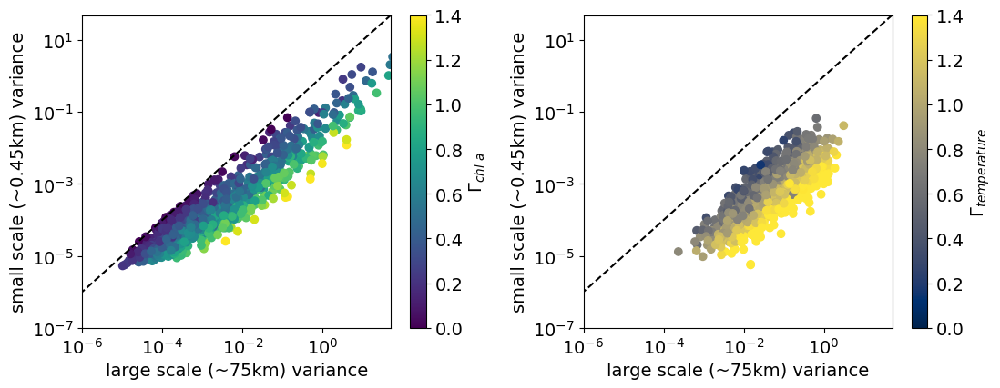

In [119]:
fig, ax = plt.subplots(1,2,figsize=(7.5*1.5,3*1.5))
im = ax[0].scatter(gdf_intermit.large_var,gdf_intermit.small_var,c=gdf_intermit.c_slope,vmin=0.0,vmax=1.4)
fig.colorbar(im,label='$Γ_{chl\ a}$')

im = ax[1].scatter(gdf_intermit.large_t_var,gdf_intermit.small_t_var,c=gdf_intermit.t_slope,vmin=0.0,vmax=1.4, cmap='cividis')

fig.colorbar(im,label='$Γ_{temperature}$')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('large scale (~75km) variance')
ax[0].set_ylabel('small scale (~0.45km) variance')
ax[0].set_xlim(10e-7,50)
ax[0].set_ylim(10e-8,50)
ax[0].plot([10e-8, 100], [10e-8, 100], ls="--",c='k')


ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('large scale (~75km) variance')
ax[1].set_ylabel('small scale (~0.45km) variance')
ax[1].set_xlim(10e-7,50)
ax[1].set_ylim(10e-8,50)
ax[1].plot([10e-8, 100], [10e-8, 100], ls="--",c='k')

fig.tight_layout()

plt.savefig('small_scale_var_large_c_t_tara.png',dpi=300)
plt.show()

# main figures

In [80]:
plt.rcParams.update({'font.size': 22})

### Figure 1

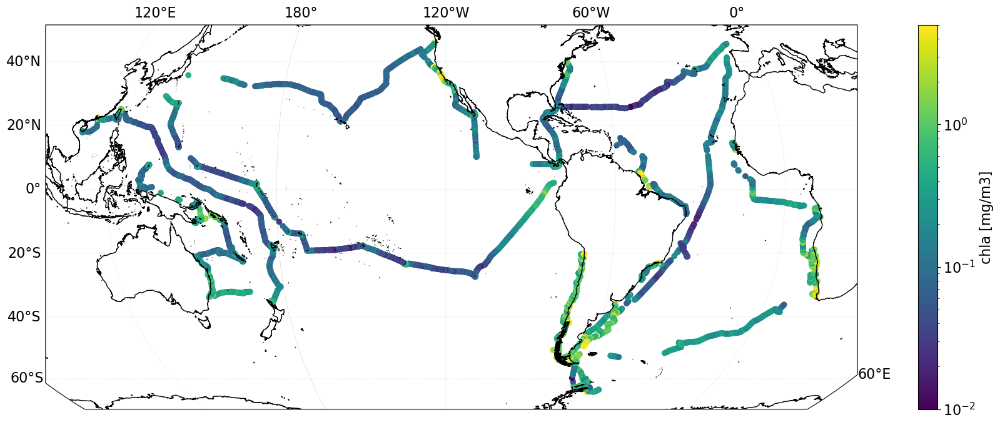

In [166]:
# crs is Robinson which I like for global maps
fig, ax = plt.subplots(figsize=(25,8), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))

ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

# gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.bottom_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf[::100].to_crs(robinson).plot(ax=ax,column='Chl_lineheight',legend=True, norm=matplotlib.colors.LogNorm(vmin=0.01, vmax=5), cmap='viridis',legend_kwds={'label': 'chla [mg/m3]'})

# ax.set_title('chla [mg/m3]')

plt.savefig('figures/chla_map.png',dpi=300, transparent=True)

plt.show()

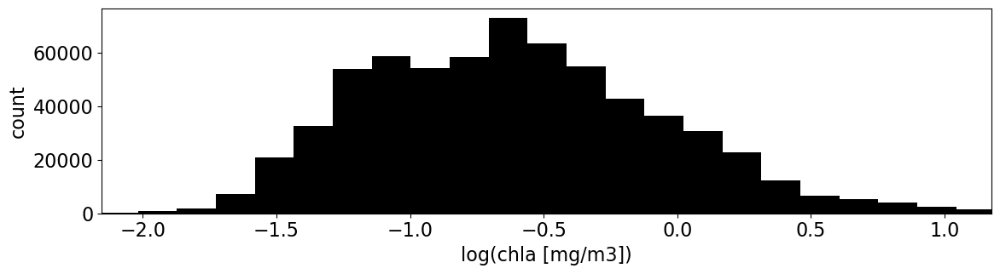

In [167]:
fig, ax = plt.subplots(figsize=(12,3.5))

ax.hist(np.log10(gdf.Chl_lineheight),bins=50,color='k')
# ax.set_yscale('log')
ax.set_xlim(np.log10(0.007),np.log10(15))

ax.set_ylabel('count')
ax.set_xlabel('log(chla [mg/m3])')

fig.tight_layout()

plt.savefig('figures/chla_hist.png',dpi=300, transparent=True)

plt.show()

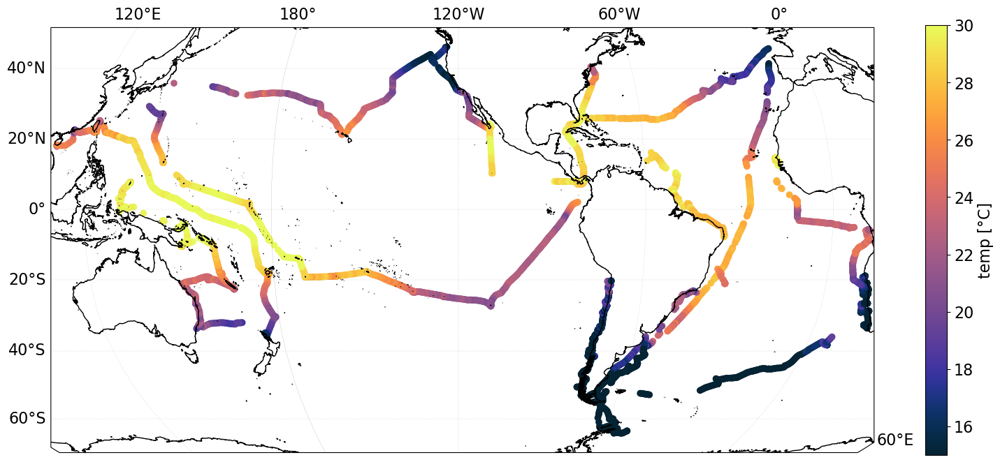

In [168]:
# crs is Robinson which I like for global maps
fig, ax = plt.subplots(figsize=(19,8), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))

ax.set_xlim(-12134807-200000,12450955+120000)

ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

gl.bottom_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf[::100].to_crs(robinson).plot(ax=ax,column='t',legend=True, vmin=15, vmax=30, cmap=cmocean.cm.thermal,legend_kwds={'label': 'temp [°C]'})

# ax.set_title('temp [C°]')

plt.savefig('figures/temp_map.png',dpi=300,transparent=True)

plt.show()

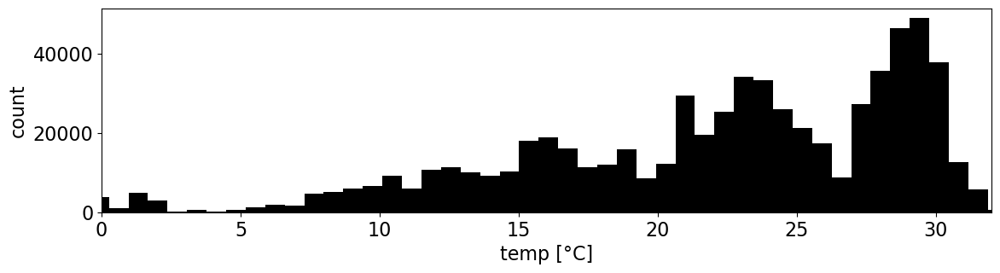

In [169]:
fig, ax = plt.subplots(figsize=(12,3.5))

ax.hist(gdf.t,bins=50,color='k')
ax.set_xlim(0,32)

ax.set_ylabel('count')
ax.set_xlabel('temp [°C]')

fig.tight_layout()

plt.savefig('figures/temp_hist.png',dpi=300, transparent=True)

plt.show()

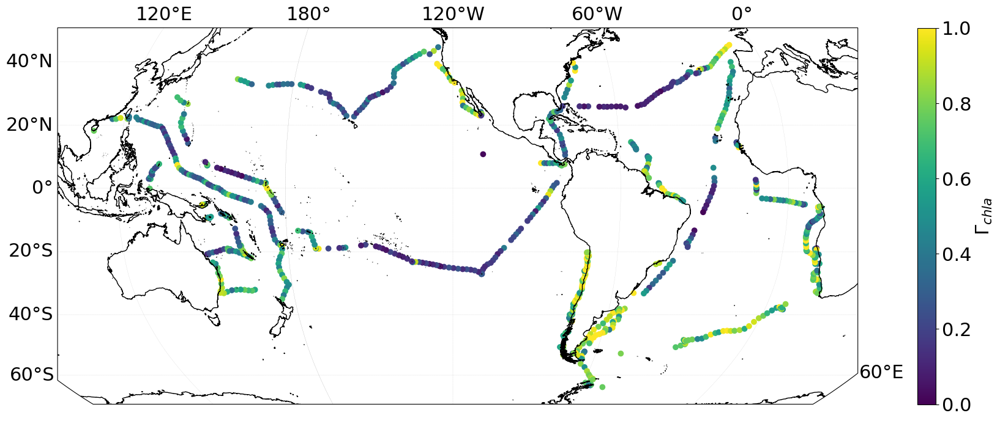

In [82]:
# crs is Robinson which I like for global maps
fig, ax = plt.subplots(figsize=(25,8), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))

# ax.set_xlim(-12134807-200000,12450955+200000)

ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

gl.bottom_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf_intermit.to_crs(robinson).plot(ax=ax,column='c_slope',legend=True, vmin=0.0, vmax=1, cmap='viridis',legend_kwds={'label': '$Γ_{chla}$'})

# ax.set_title('chl a intermittency')

plt.savefig('figures/chla_intermit_map.png',dpi=300, transparent=True)

plt.show()

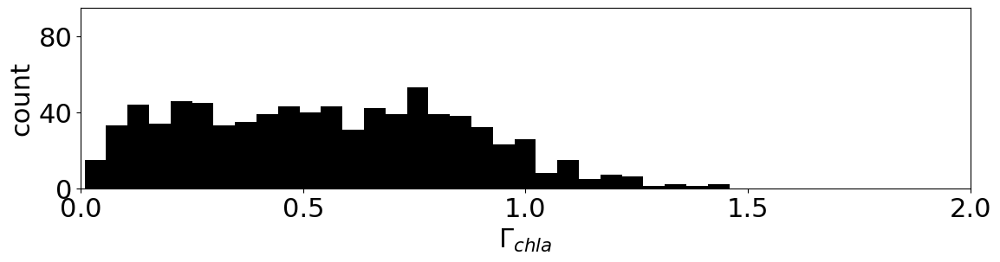

In [81]:
fig, ax = plt.subplots(figsize=(12,3.5))

ax.hist(gdf_intermit.c_slope,bins=30,color='k')
# ax.set_yscale('log')
ax.set_xlim(0,2)
ax.set_ylim(0,95)

ax.xaxis.set_major_locator(plt.MaxNLocator(4))
ax.yaxis.set_major_locator(plt.MaxNLocator(3))

ax.set_ylabel('count')
ax.set_xlabel('$Γ_{chla}$')

fig.tight_layout()

plt.savefig('figures/c_slope_hist.png',dpi=300, transparent=True)

plt.show()

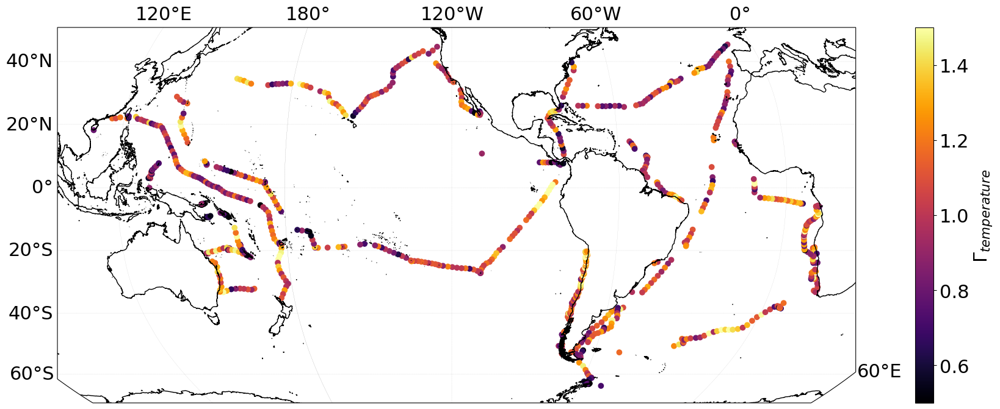

In [83]:
# crs is Robinson which I like for global maps
fig, ax = plt.subplots(figsize=(25,8), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))

ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.bottom_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf_intermit.to_crs(robinson).plot(ax=ax,column='t_slope',legend=True, vmin=0.5, vmax=1.5, cmap='inferno',legend_kwds={'label': '$Γ_{temperature}$'})

plt.savefig('figures/temp_intermit_map.png',dpi=300, transparent=True)

plt.show()

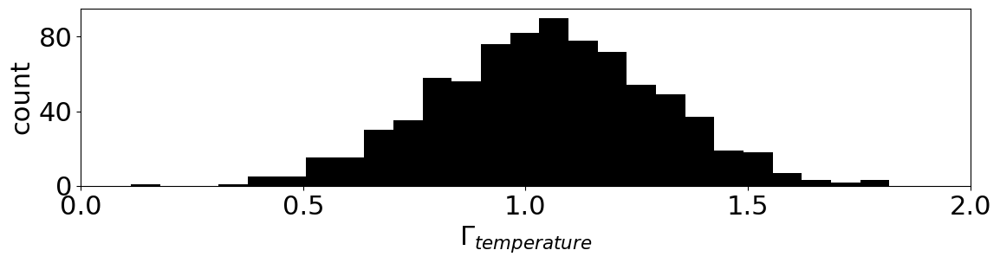

In [84]:
fig, ax = plt.subplots(figsize=(12,3.5))

ax.hist(gdf_intermit.t_slope,bins=30,color='k')
# ax.set_yscale('log')
ax.set_xlim(0,2)
ax.set_ylim(0,95)

ax.xaxis.set_major_locator(plt.MaxNLocator(4))
ax.yaxis.set_major_locator(plt.MaxNLocator(3))

ax.set_ylabel('count')
ax.set_xlabel('$Γ_{temperature}$')

fig.tight_layout()

plt.savefig('figures/t_slope_hist.png',dpi=300, transparent=True)

plt.show()

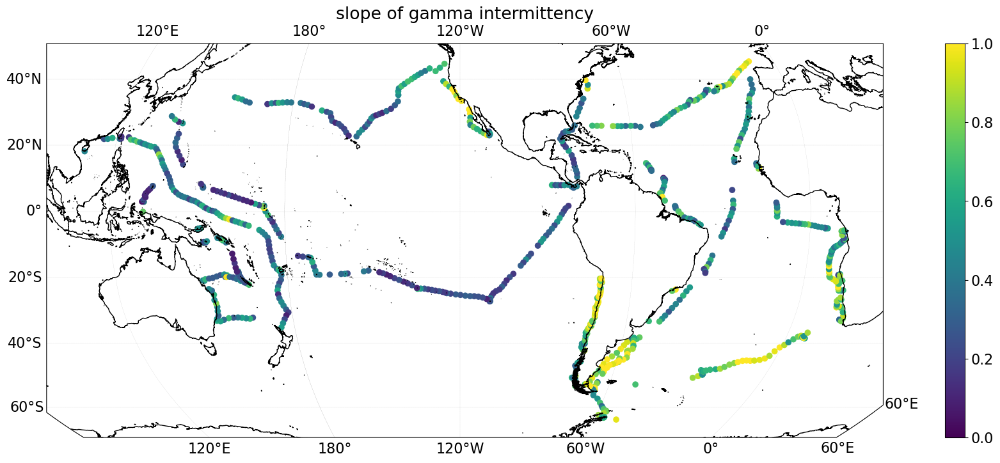

In [176]:
fig, ax = plt.subplots(figsize=(25,8), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf_intermit.to_crs(robinson).plot(ax=ax,column='transect_g_slope',legend=True, vmin=0,vmax=1, cmap='viridis')

ax.set_title('slope of gamma intermittency')

# plt.savefig('gamma_intermittency_map.png',dpi=300)

plt.show()

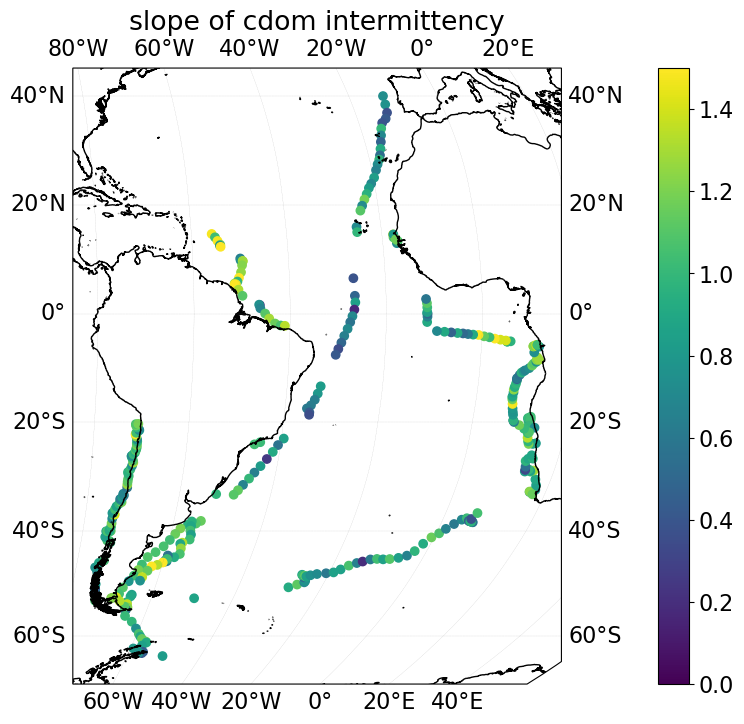

In [177]:
fig, ax = plt.subplots(figsize=(25,8), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf_intermit.to_crs(robinson).plot(ax=ax,column='cdom_slope',legend=True, vmin=0,vmax=1.5, cmap='viridis')

ax.set_title('slope of cdom intermittency')

# plt.savefig('gamma_intermittency_map.png',dpi=300)

plt.show()

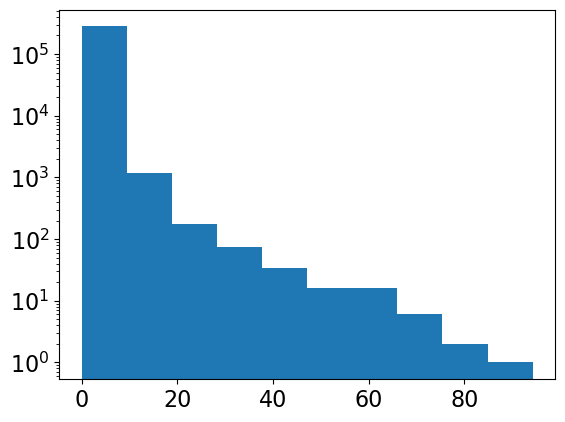

In [124]:
plt.hist(gdf.fdom)
plt.yscale('log')

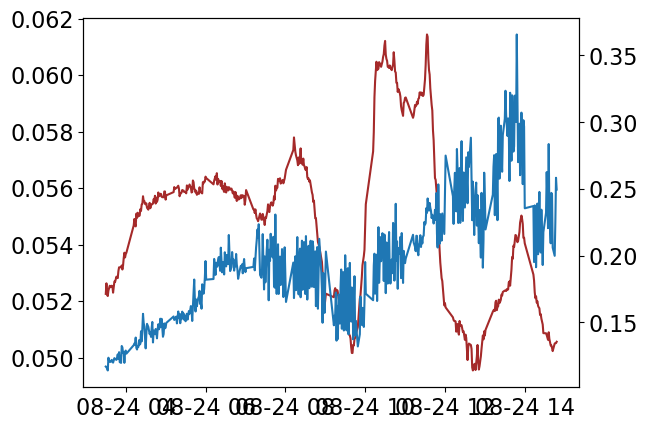

In [141]:
fig, ax = plt.subplots()
ax.plot(gdf.fdom[-5000:-4500],c='brown')
ax2 = ax.twinx()
ax2.plot(gdf.Chl_lineheight[-5000:-4500])
# ax2.set_yscale('log')

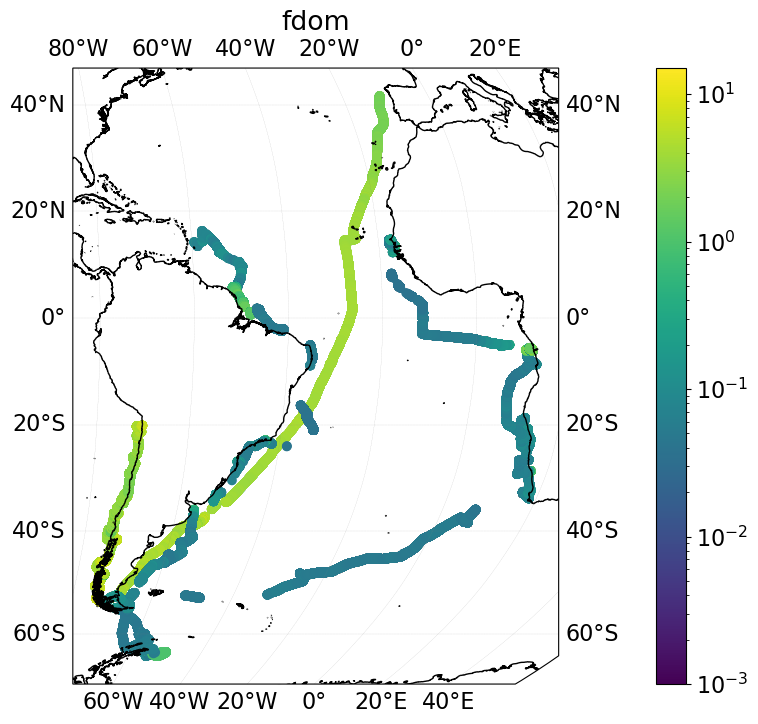

In [127]:
fig, ax = plt.subplots(figsize=(25,8), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf.to_crs(robinson).plot(ax=ax,column='fdom',legend=True, norm=LogNorm(vmin=.001, vmax=15), cmap='viridis')

ax.set_title('fdom')

# plt.savefig('gamma_intermittency_map.png',dpi=300)

plt.show()

# exploring longhurst provinces

In [178]:
from matplotlib.colors import LogNorm

In [179]:
longhurst = gpd.read_file('data/Longhurst_world_v4_2010.shp')

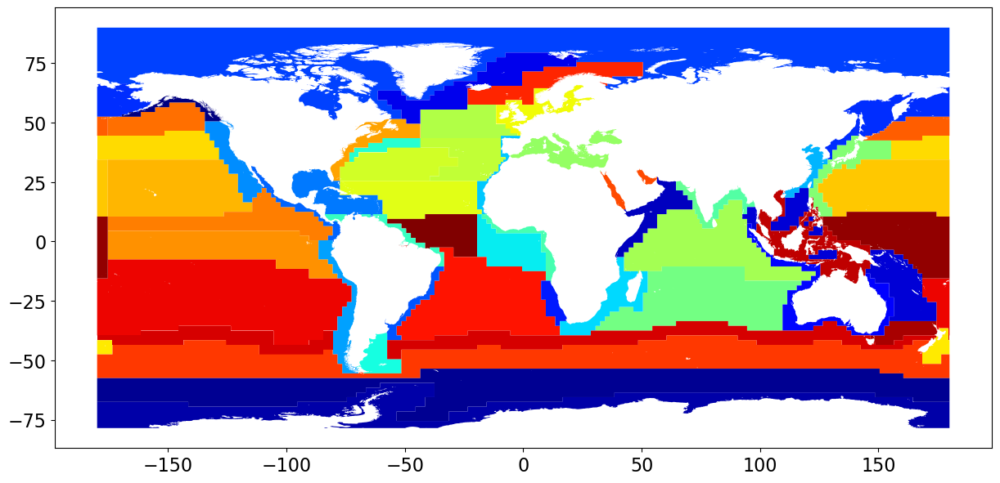

In [180]:
fig, ax = plt.subplots(figsize=(16,7))
longhurst.plot(ax=ax,column='ProvCode',cmap='jet')
# longhurst[longhurst.FID==18].plot(ax=ax,column='ProvCode')
plt.show()

data from https://www.ncei.noaa.gov/data/oceans/woa/WOA18/DATA/nitrate/netcdf/all/1.00/

In [185]:
n_ds = xr.open_dataset('data/woa18_all_n00_01.nc', decode_times=False)

In [186]:
p_ds = xr.open_dataset('data/woa18_all_p00_01.nc', decode_times=False)

In [187]:
s_ds = xr.open_dataset('data/woa18_all_i00_01.nc', decode_times=False)

In [188]:
o_ds = xr.open_dataset('data/woa18_all_o00_01.nc', decode_times=False)

In [189]:
o2sat_ds = xr.open_dataset('data/woa18_all_O200_01.nc', decode_times=False)

In [101]:
gdf_intermit = gdf_intermit.to_crs('EPSG:3087')

In [190]:
# Get the centroids, and create the indexers for the DataArray:
centroids = gdf_intermit.to_crs('EPSG:4326').centroid
x_indexer = xr.DataArray(centroids.x, dims=["point"])
y_indexer = xr.DataArray(centroids.y, dims=["point"])

In [191]:
gdf_intermit['woa_nitrate'] = n_ds.n_an[0,0].sel(lat=y_indexer, lon=x_indexer, method="nearest").values

In [192]:
gdf_intermit['woa_phos'] = p_ds.p_an[0,0].sel(lat=y_indexer, lon=x_indexer, method="nearest").values

In [193]:
gdf_intermit['woa_silicate'] = s_ds.i_an[0,0].sel(lat=y_indexer, lon=x_indexer, method="nearest").values

In [194]:
gdf_intermit['woa_oxygen'] = o_ds.o_an[0,0].sel(lat=y_indexer, lon=x_indexer, method="nearest").values

In [195]:
gdf_intermit['woa_o2sat'] = o2sat_ds.O_an[0,0].sel(lat=y_indexer, lon=x_indexer, method="nearest").values

<GeoAxes: title={'center': 'depth = 0.0 [meters], time = 8.214e+03 [months ...'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>

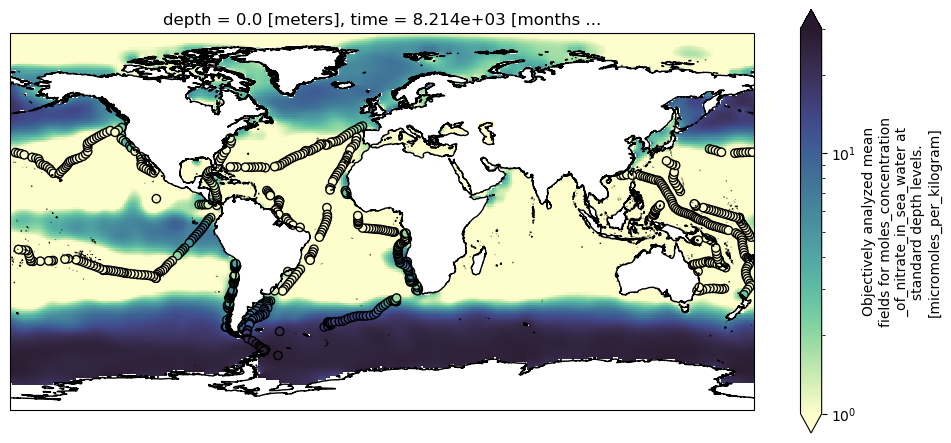

In [56]:
fig, ax = plt.subplots(figsize=(12,5.5), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')

n_ds.n_an[0,0].plot(ax=ax,x='lon', y='lat', cmap=cmocean.cm.deep, norm=LogNorm(vmin=1, vmax=30), add_colorbar=True)
gdf_intermit.to_crs('EPSG:4326').plot(ax=ax,column='woa_nitrate',cmap=cmocean.cm.deep, norm=LogNorm(vmin=1, vmax=30), edgecolor='k')

<GeoAxes: title={'center': 'depth = 0.0 [meters], time = 8.214e+03 [months ...'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>

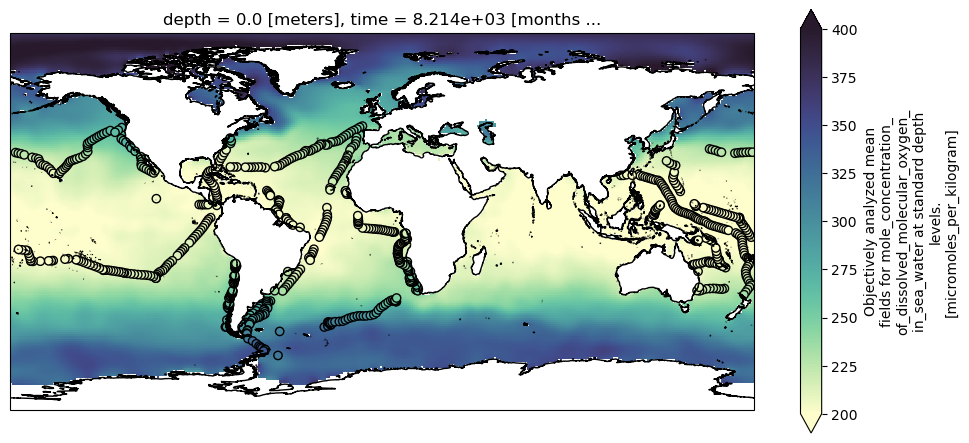

In [57]:
fig, ax = plt.subplots(figsize=(12,5.5), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')

o_ds.o_an[0,0].plot(ax=ax,x='lon', y='lat', cmap=cmocean.cm.deep, vmin=200, vmax=400, add_colorbar=True)
gdf_intermit.to_crs('EPSG:4326').plot(ax=ax,column='woa_oxygen',cmap=cmocean.cm.deep, vmin=200, vmax=400, edgecolor='k')

<GeoAxes: title={'center': 'depth = 0.0 [meters], time = 8.214e+03 [months ...'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>

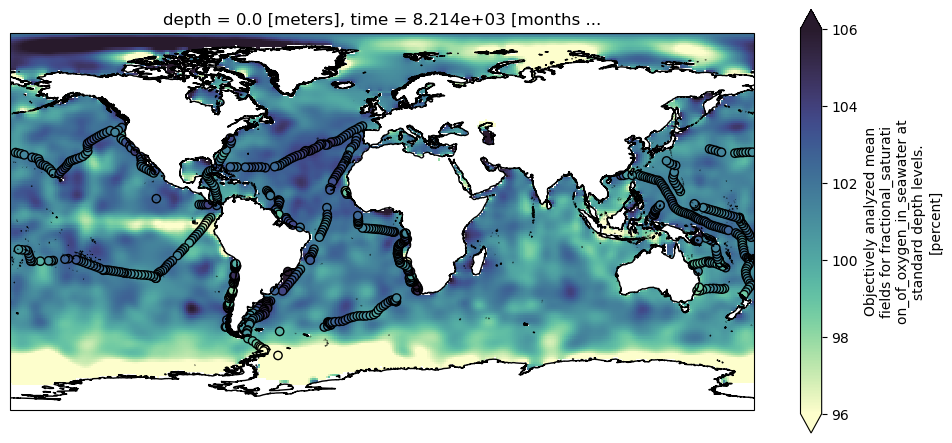

In [58]:
fig, ax = plt.subplots(figsize=(12,5.5), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')

o2sat_ds.O_an[0,0].plot(ax=ax,x='lon', y='lat', cmap=cmocean.cm.deep, vmin=96, vmax=106, add_colorbar=True)
gdf_intermit.to_crs('EPSG:4326').plot(ax=ax,column='woa_o2sat',cmap=cmocean.cm.deep, vmin=96, vmax=106, edgecolor='k')

In [102]:
gdf_intermit = gdf_intermit.sjoin_nearest(longhurst.to_crs('EPSG:3087'), how="left",max_distance=5000,distance_col='geo_dist')

In [103]:
gdf_intermit.columns

Index(['lat', 'lon', 'c_slope', 'random_c_slope', 'transect_g_slope',
       'g470_slope', 's_slope', 't_slope', 't_mean', 's_mean', 'sigma_slope',
       'sig_mean', 'gamma_hh_spear', 'gamma_hh_pvalue', 'gamma', 'cp443_slope',
       'chla', 'agaus470', 'agaus492', 'agaus523', 'large_t_var',
       'small_t_var', 'large_gamma_var', 'small_gamma_var', 'large_cp_var',
       'small_cp_var', 'large_s_var', 'small_s_var', 'large_sigma_var',
       'small_sigma_var', 'agaus550', 'agaus584', 'bbp_1', 'cp443', 'hh_mean',
       'hh_slope', 'ap443', 'large_var', 'small_var', 'max_window', 'datetime',
       'max_dist', 'seconds_elapsed', 'cdom_mean', 'cdom_slope', 'geometry',
       'index_right', 'ProvCode', 'ProvDescr', 'geo_dist'],
      dtype='object')

In [104]:
gdf_intermit = gdf_intermit.rename(columns={'index_right' : 'FID'})

In [105]:
np.unique(gdf_intermit.FID,return_counts=True)

(array([ 3.,  4.,  5.,  6.,  7.,  8.,  9., 11., 12., 13., 14., 16., 17.,
        18., 19., 20., 32., 33., 34., 36., 37., 38., 39., 40., 41., 43.,
        44., 45., 46., 47., 48., 50., 51., 52., 53., nan]),
 array([ 3,  1, 29, 19, 20, 30, 37,  6, 15, 11,  7, 16, 29, 11, 38, 42,  3,
        12, 42, 83, 28,  7,  8, 87, 53, 21,  9, 80,  3,  2, 17, 14, 24,  1,
        11,  1]))

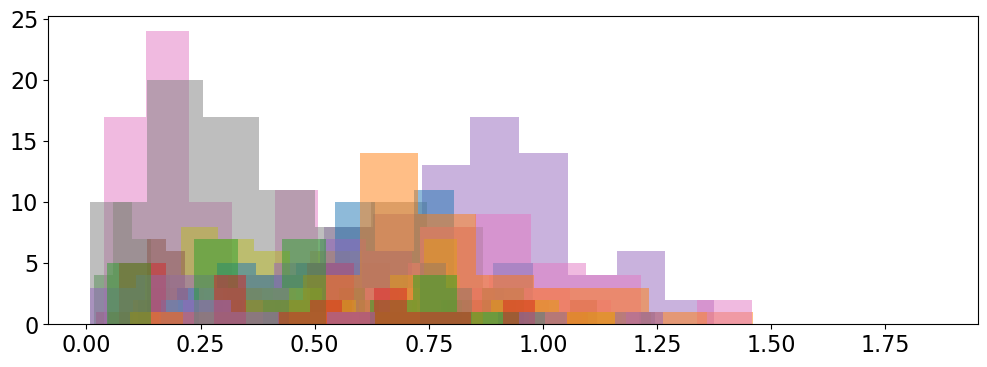

In [106]:
fig, ax = plt.subplots(figsize=(12,4))
for fid in gdf_intermit.FID.unique():
    if np.isnan(fid):
        continue    
    ax.hist(gdf_intermit[gdf_intermit.FID==fid].c_slope,alpha=0.5)
plt.show()

In [64]:
counter = 0
for fid in gdf_intermit.FID.unique():
    if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
        counter +=1
counter

18

In [65]:
! pip install distinctipy

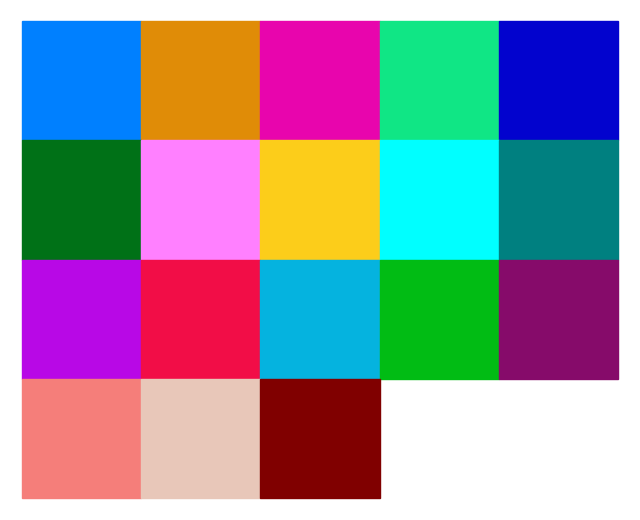

In [66]:
import distinctipy

# number of colours to generate

N = counter

# generate N visually distinct colours
colors = distinctipy.get_colors(N, colorblind_type="Deuteranomaly",rng=42)

# display the colours
distinctipy.color_swatch(colors)

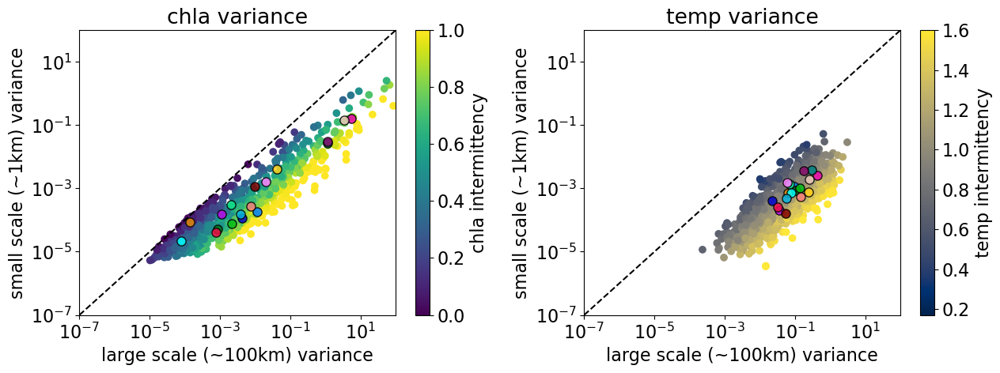

In [107]:
fig, ax = plt.subplots(1,2,figsize=(13,5))
im = ax[0].scatter(gdf_intermit.large_var,gdf_intermit.small_var,c=gdf_intermit.c_slope,vmin=0.,vmax=1)
fig.colorbar(im,label='chla intermittency')

im = ax[1].scatter(gdf_intermit.large_t_var,gdf_intermit.small_t_var,c=gdf_intermit.t_slope,vmin=0.17,vmax=1.6, cmap='cividis')

counter = 0
for fid in gdf_intermit.FID.unique():
    if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
        ax[0].scatter(gdf_intermit[gdf_intermit.FID == fid].large_var.mean(), 
                    gdf_intermit[gdf_intermit.FID == fid].small_var.mean(),
                    color=colors[counter],alpha=0.85,s=65,edgecolor='k')
        ax[1].scatter(gdf_intermit[gdf_intermit.FID == fid].large_t_var.mean(), 
            gdf_intermit[gdf_intermit.FID == fid].small_t_var.mean(),
            color=colors[counter],alpha=0.85,s=65,edgecolor='k')

        counter +=1

fig.colorbar(im,label='temp intermittency')

ax[0].set_title('chla variance')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('large scale (~100km) variance')
ax[0].set_ylabel('small scale (~1km) variance')
ax[0].set_xlim(10e-8, 100)
ax[0].set_ylim(10e-8, 100)
ax[0].plot([10e-8, 100], [10e-8, 100], ls="--",c='k')

ax[1].set_title('temp variance')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('large scale (~100km) variance')
ax[1].set_ylabel('small scale (~1km) variance')
ax[1].set_xlim(10e-8, 100)
ax[1].set_ylim(10e-8, 100)
ax[1].plot([10e-8, 100], [10e-8, 100], ls="--",c='k')

fig.tight_layout()

# plt.savefig('ss_ls_var_chla_temp.png',dpi=300)
plt.show()

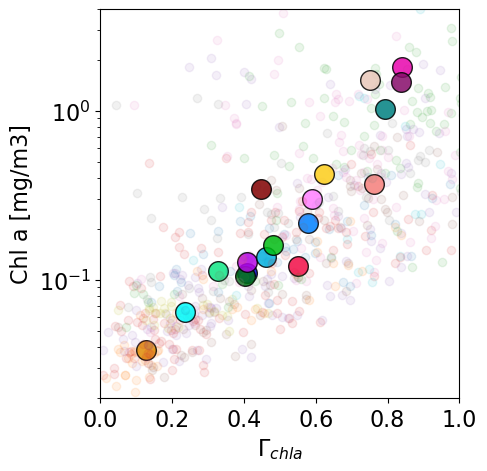

In [112]:
fid_list = []

fig, ax = plt.subplots(figsize=(5.15,5))

counter = 0
for fid in gdf_intermit.FID.unique():
    if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
        fid_list.append(fid)
        plt.scatter(gdf_intermit[gdf_intermit.FID == fid].c_slope, 
                     gdf_intermit[gdf_intermit.FID == fid].chla,alpha=0.1)
        plt.scatter(gdf_intermit[gdf_intermit.FID == fid].c_slope.mean(), 
                     gdf_intermit[gdf_intermit.FID == fid].chla.mean(),
                    color=colors[counter],alpha=0.85,s=200,edgecolor='k')
        counter +=1
plt.yscale('log')
# plt.ylim(-4,4)
plt.xlabel('$Γ_{chl a}$')
plt.ylabel('Chl a [mg/m3]')
plt.ylim(.02,4)
plt.xlim(.0,1)

# plt.title('Longhurst provinces plotted on chla\n and chla intermit')

plt.tight_layout()

# plt.savefig('longhurst_chla_vs_chlaintermit.png',dpi=300)

In [69]:
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
plt.rcParams.update({'font.size': 16})

OLS R2=0.01
Pearson R=-0.09, p=0.015
Spearman R=-0.16, p=0.015


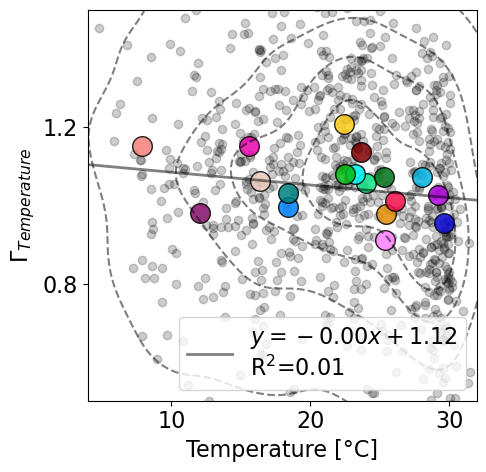

OLS R2=0.00
Pearson R=-0.02, p=0.564
Spearman R=-0.03, p=0.564


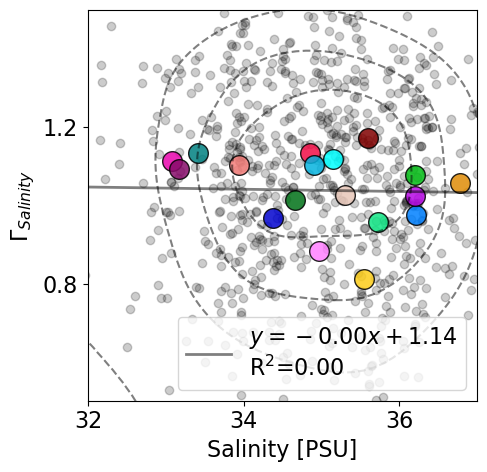

OLS R2=0.01
Pearson R=0.09, p=0.012
Spearman R=0.08, p=0.012


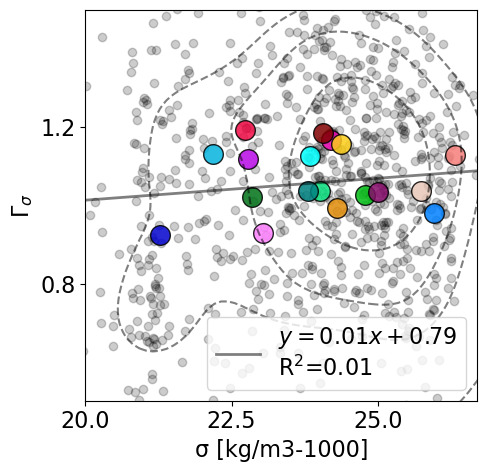

doing this
['t_mean', 's_mean', 'sig_mean', 'chla', 'cp443', 'gamma', 'cdom_mean']
OLS R2=0.44
Pearson R=0.66, p=0.000
Spearman R=0.71, p=0.000


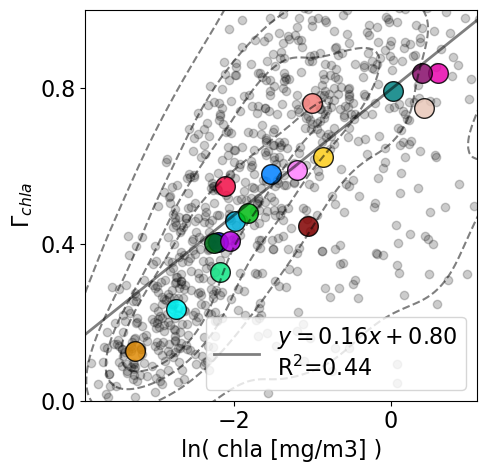

doing this
['t_mean', 's_mean', 'sig_mean', 'chla', 'cp443', 'gamma', 'cdom_mean']
OLS R2=0.22
Pearson R=0.47, p=0.000
Spearman R=0.46, p=0.000


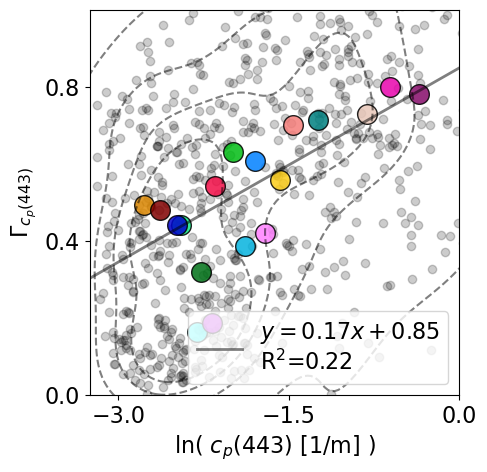

OLS R2=0.06
Pearson R=-0.24, p=0.000
Spearman R=-0.29, p=0.000


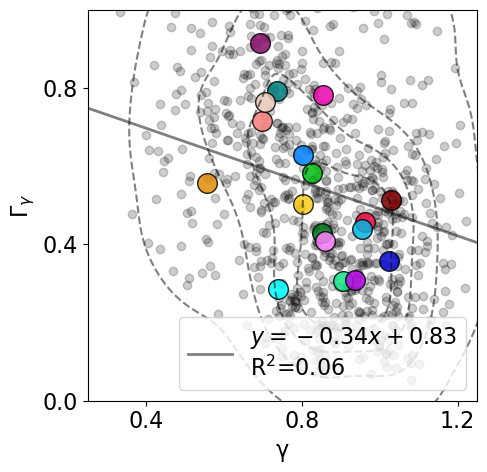

doing this
['t_mean', 's_mean', 'sig_mean', 'chla', 'cp443', 'gamma', 'cdom_mean']
OLS R2=0.00
Pearson R=0.00, p=0.992
Spearman R=0.13, p=0.992


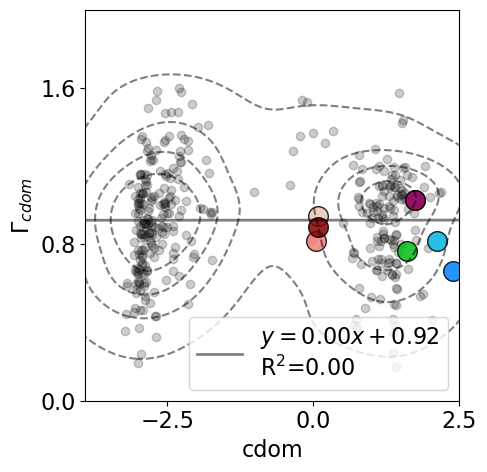

In [198]:
xs = ['t_mean', 's_mean',  'sig_mean', 'chla',     'cp443',       'gamma', 'cdom_mean']
ys = ['t_slope','s_slope', 'sigma_slope', 'c_slope', 'cp443_slope', 'transect_g_slope', 'cdom_slope']

xs_names = ['Temperature [°C]', 'Salinity [PSU]',  'σ [kg/m3-1000]', 'ln( chla [mg/m3] )',     'ln( $c_p$(443) [1/m] )', 'γ', 'cdom']
ys_names = ['Temperature','Salinity', 'σ', 'chla', 'c_p(443)', 'γ' ,'cdom']

scales = ['linear','linear','linear','log','log','linear']

xlims = [[4,32],[32,37],[20,26.7],[-3.9,1.1],[-3.25,0],[.25,1.25],[-3.9,2.5]]
ylims = [[.5,1.5],[.5,1.5],[.5,1.5],[0,1],[0,1],[0,1],[0,2]]


for i in range(len(xs)):
    fig, ax = plt.subplots(figsize=(5.15,5))
    
    counter = 0

#     xs = ['t_mean', 's_mean',  'sig_mean', 'chla',     'cp443',       'gamma']
#     ys = ['t_slope','s_slope', 'sigma_slope', 'c_slope', 'cp443_slope', 'transect_g_slope' ]
    if xs[i] in ['chla',     'cp443', 'cdom_mean']:
        print('doing this')
        print(xs)
        X = np.log(gdf_intermit[xs[i]])
    else:
        X = gdf_intermit[xs[i]]
    Y = gdf_intermit[ys[i]]

    nas = np.logical_or(np.isnan(X), np.isnan(Y))

    X = X[~nas]
    Y = Y[~nas]

    sns.kdeplot(x=X,y=Y,color='k',alpha=0.5,levels=5, ax=ax, linestyles='--')
    
    ax.scatter(X, Y,alpha=0.2,c='k')

    ols_model = sm.OLS(Y,sm.add_constant(X))
    results = ols_model.fit()

    pear_r = stats.pearsonr(X, Y)
    spear_r = stats.spearmanr(X, Y)

    print(f'OLS R2={results.rsquared:.2f}\nPearson R={pear_r.statistic:.2f}, p={pear_r.pvalue:.3f}\nSpearman R={spear_r.correlation:.2f}, p={pear_r.pvalue:.3f}')

    # extract intercept b and slope m
    b, m = results.params

    ax.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$\nR$^2$={results.rsquared:.2f}', ls='-',c='black',lw=2,alpha=0.5)
    
    # just data within the provinces
    for fid in gdf_intermit.FID.unique():
        if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
            if xs[i] in ['chla', 'cp443']:
                plt.scatter(np.log(gdf_intermit[gdf_intermit.FID == fid][xs[i]].mean()), 
                         gdf_intermit[gdf_intermit.FID == fid][ys[i]].mean(),
                        color=colors[counter],alpha=0.85,s=200,edgecolor='k')
            else:
                plt.scatter(gdf_intermit[gdf_intermit.FID == fid][xs[i]].mean(), 
                         gdf_intermit[gdf_intermit.FID == fid][ys[i]].mean(),
                        color=colors[counter],alpha=0.85,s=200,edgecolor='k')
            counter +=1
    # plt.xscale(scales[i])

    plt.ylabel('$Γ_{'+ys_names[i]+'}$')
    
    plt.xlabel(xs_names[i])
    
    plt.ylim(ylims[i][0],ylims[i][1])
    
    # if xs[i] == 'gamma':
    #         plt.xlim(xlims[i][1],xlims[i][0])
    # else:
    plt.xlim(xlims[i][0],xlims[i][1])
        
    ax.legend(loc='lower right')

    # plt.title('Longhurst provinces plotted on chla\n and chla intermit')
    
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    ax.yaxis.set_major_locator(plt.MaxNLocator(3))
    ax.xaxis.set_major_locator(plt.MaxNLocator(3))

    plt.tight_layout()

    plt.savefig('figures/longhurst_'+ys_names[i]+'.png',dpi=300, transparent=True)
    plt.show()
    # break

In [183]:
from matplotlib.colors import Normalize

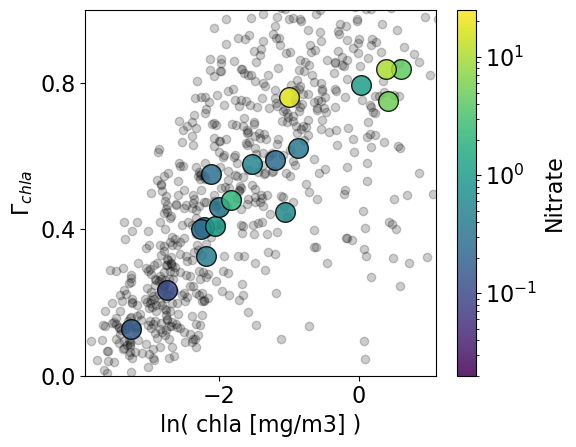

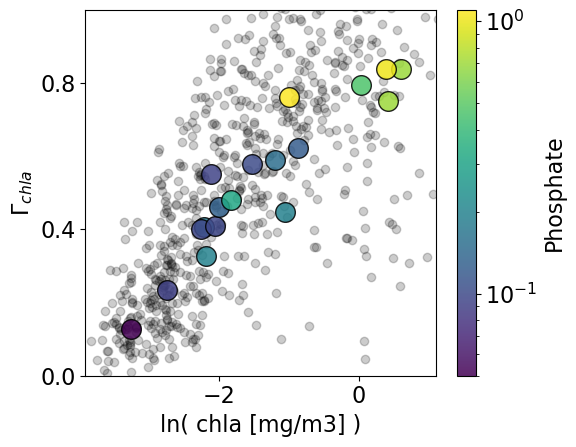

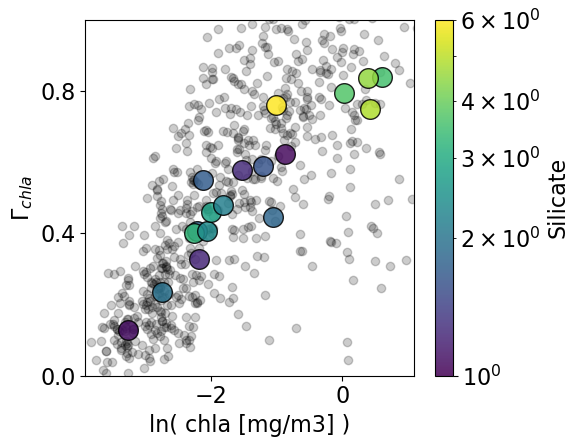

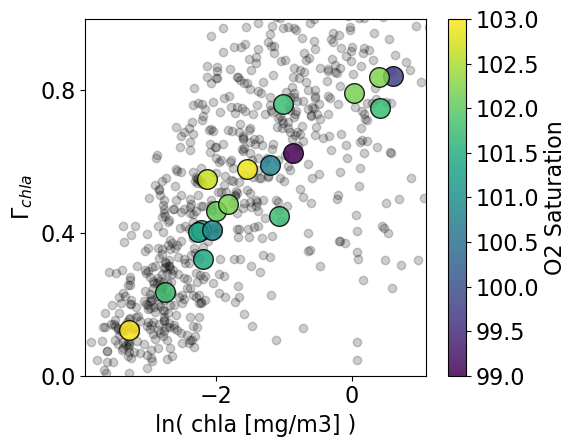

In [199]:
c_vars = ['woa_nitrate', 'woa_phos', 'woa_silicate', 'woa_o2sat']
c_names = ['Nitrate', 'Phosphate', 'Silicate', 'O2 Saturation']


vmins = [LogNorm(vmin=.02, vmax=25),LogNorm(vmin=.05, vmax=1.1),LogNorm(vmin=1, vmax=6),Normalize(vmin=99, vmax=103)]

for i in range(len(c_vars)):
    fig, ax = plt.subplots(figsize=(6,4.75))

    # sns.kdeplot(x=np.log(gdf_intermit[gdf_intermit.FID == fid].chla),y=gdf_intermit[gdf_intermit.FID == fid].c_slope,color='k',alpha=0.5,levels=5, ax=ax)

    for fid in gdf_intermit.FID.unique():
        if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
            plt.scatter(np.log(gdf_intermit[gdf_intermit.FID == fid].chla), 
                         gdf_intermit[gdf_intermit.FID == fid].c_slope,alpha=0.2,c='k')

    for fid in gdf_intermit.FID.unique():
        if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
            plt.scatter(np.log(gdf_intermit[gdf_intermit.FID == fid].chla.mean()), 
                         gdf_intermit[gdf_intermit.FID == fid].c_slope.mean(),
                         c=gdf_intermit[gdf_intermit.FID == fid][c_vars[i]].mean(),norm=vmins[i],alpha=0.85,s=200,edgecolor='k')
            

    # plt.xscale('log')
    plt.colorbar(label=c_names[i])

    plt.ylabel('$Γ_{chla}$')
    plt.xlabel('ln( chla [mg/m3] )')
    
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    ax.yaxis.set_major_locator(plt.MaxNLocator(3))
    ax.xaxis.set_major_locator(plt.MaxNLocator(3))
               
    plt.ylim(0,1)
    plt.xlim(np.log(.02),np.log(3))

    plt.tight_layout()

    plt.savefig('figures/longhurst_props'+c_vars[i]+'.png',dpi=300, transparent=True)
    plt.show()

OLS R2=0.43
Pearson R=0.65, p=0.000
Spearman R=0.64, p=0.000


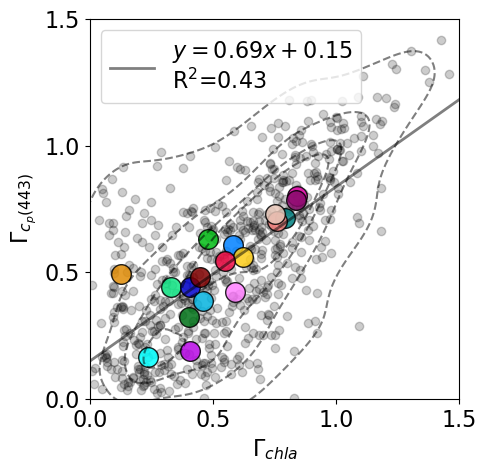

OLS R2=0.43
Pearson R=0.66, p=0.000
Spearman R=0.63, p=0.000


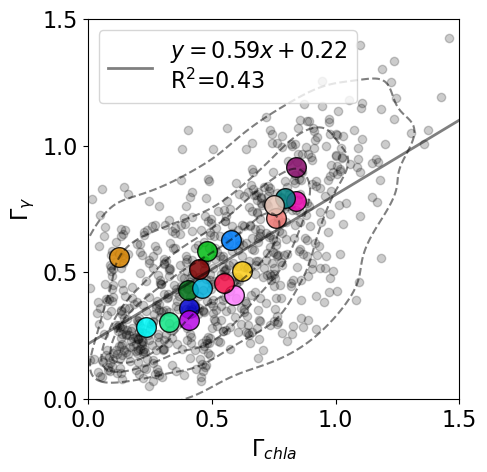

OLS R2=0.02
Pearson R=0.15, p=0.000
Spearman R=0.14, p=0.000


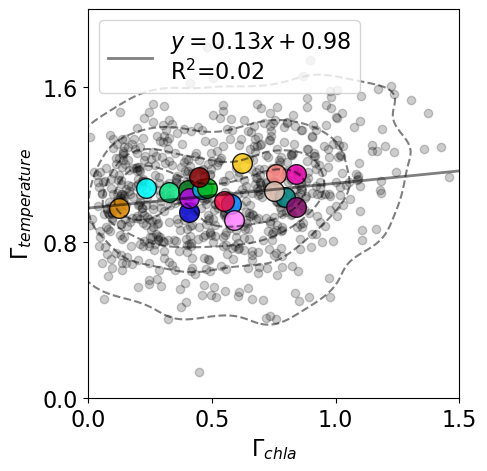

OLS R2=0.01
Pearson R=0.11, p=0.002
Spearman R=0.10, p=0.002


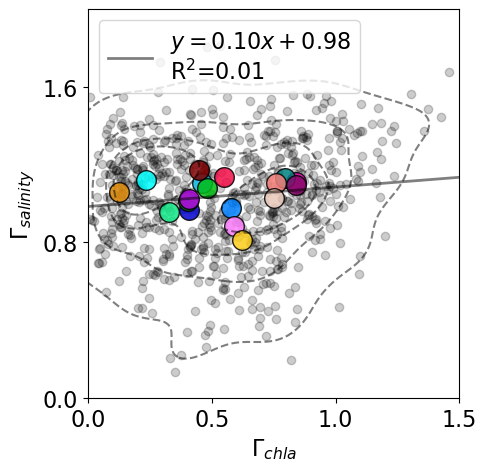

OLS R2=0.25
Pearson R=0.50, p=0.000
Spearman R=0.48, p=0.000


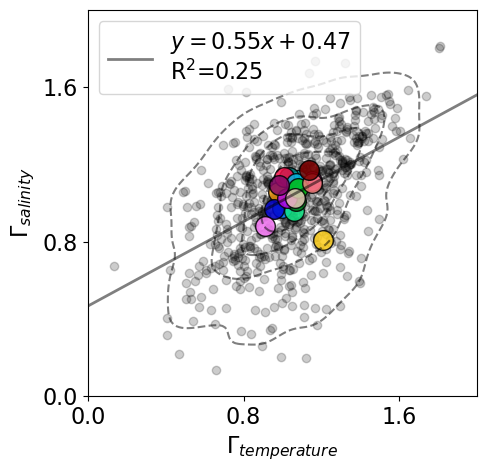

OLS R2=0.50
Pearson R=0.70, p=0.000
Spearman R=0.69, p=0.000


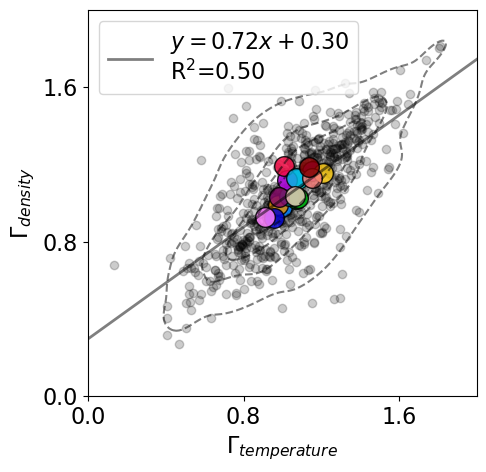

OLS R2=0.17
Pearson R=0.42, p=0.000
Spearman R=0.42, p=0.000


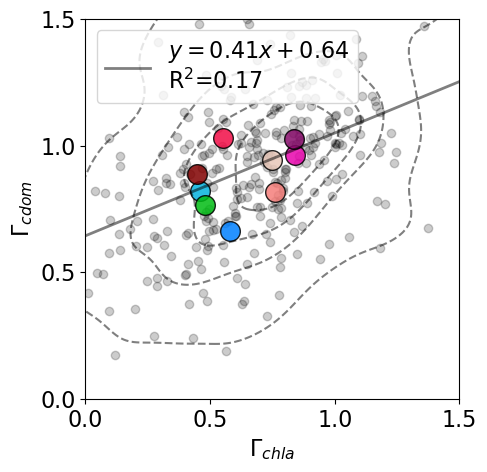

OLS R2=0.06
Pearson R=0.25, p=0.000
Spearman R=0.26, p=0.000


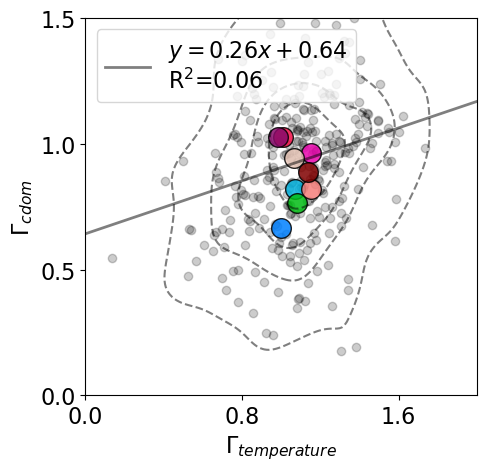

In [200]:
xs = ['c_slope',    'c_slope',          'c_slope', 'c_slope', 't_slope','t_slope', 'c_slope', 't_slope']
ys = ['cp443_slope','transect_g_slope', 't_slope', 's_slope', 's_slope', 'sigma_slope', 'cdom_slope', 'cdom_slope']

xs_names = ['chla', 'chla',  'chla', 'chla', 'temperature','temperature', 'chla', 'temperature']
ys_names = ['c_p(443)','γ', 'temperature', 'salinity', 'salinity', 'density', 'cdom','cdom']

xlims = [[0,1.5],[0,1.5],[0,1.5],[0,1.5],[0,2], [0,2],[0,1.5],[0,2]]
ylims = [[0,1.5],[0,1.5],[0,2],  [0,2],  [0,2], [0,2],[0,1.5],[0,1.5]]


for i in range(len(xs)):
    fig, ax = plt.subplots(figsize=(5.15,5))

    X = gdf_intermit[xs[i]]
    Y = gdf_intermit[ys[i]]

    nas = np.logical_or(np.isnan(X), np.isnan(Y))

    X = X[~nas]
    Y = Y[~nas]

    ols_model = sm.OLS(Y,sm.add_constant(X))
    results = ols_model.fit()

    pear_r = stats.pearsonr(X, Y)
    spear_r = stats.spearmanr(X, Y)

    sns.kdeplot(x=X,y=Y,color='k',alpha=0.5,levels=5, ax=ax, linestyles='--')

    print(f'OLS R2={results.rsquared:.2f}\nPearson R={pear_r.statistic:.2f}, p={pear_r.pvalue:.3f}\nSpearman R={spear_r.correlation:.2f}, p={pear_r.pvalue:.3f}')

    # extract intercept b and slope m
    b, m = results.params

    ax.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$\nR$^2$={results.rsquared:.2f}', ls='-',c='black',lw=2,alpha=0.5)

    counter = 0
    for fid in gdf_intermit.FID.unique():
        if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
            fid_list.append(fid)
            plt.scatter(gdf_intermit[gdf_intermit.FID == fid][xs[i]], 
                         gdf_intermit[gdf_intermit.FID == fid][ys[i]],alpha=0.2,c='k')

    for fid in gdf_intermit.FID.unique():
        if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
            plt.scatter(gdf_intermit[gdf_intermit.FID == fid][xs[i]].mean(), 
                         gdf_intermit[gdf_intermit.FID == fid][ys[i]].mean(),
                        color=colors[counter],alpha=0.85,s=200,edgecolor='k')
            counter +=1

    plt.ylabel('$Γ_{'+ys_names[i]+'}$')
    
    plt.xlabel('$Γ_{'+xs_names[i]+'}$')
    
    plt.ylim(ylims[i][0],ylims[i][1])
    
    plt.xlim(xlims[i][0],xlims[i][1])
    
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    ax.yaxis.set_major_locator(plt.MaxNLocator(3))
    ax.xaxis.set_major_locator(plt.MaxNLocator(3))

    # plt.title('Longhurst provinces plotted on chla\n and chla intermit')

    ax.legend(loc='upper left')
    plt.tight_layout()

    plt.savefig('figures/longhurst_'+xs_names[i]+ys_names[i]+'var_comp.png',dpi=300, transparent=True)
    plt.show()
    # break

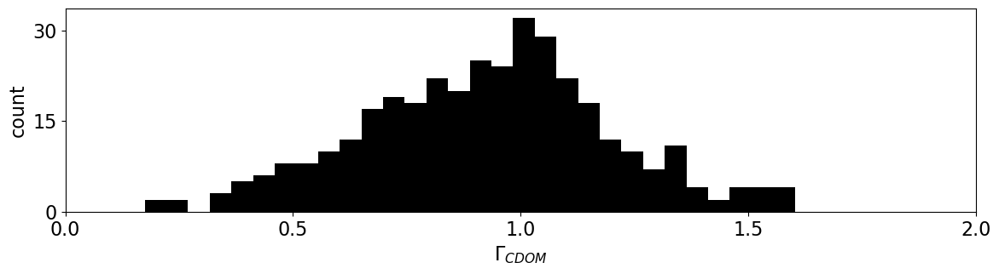

In [146]:
fig, ax = plt.subplots(figsize=(12,3.5))

ax.hist(gdf_intermit.cdom_slope,bins=30,color='k')
# ax.set_yscale('log')
ax.set_xlim(0,2)
# ax.set_ylim(0,68)

ax.xaxis.set_major_locator(plt.MaxNLocator(4))
ax.yaxis.set_major_locator(plt.MaxNLocator(3))

ax.set_ylabel('count')
ax.set_xlabel('$Γ_{CDOM}$')

fig.tight_layout()

plt.savefig('figures/cdom_slope_hist.png',dpi=300, transparent=True)

plt.show()

In [ ]:
# just data within the provinces
for fid in gdf_intermit.FID.unique():
    if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
        if xs[i] in ['chla', 'cp443']:
            plt.scatter(np.log(gdf_intermit[gdf_intermit.FID == fid][xs[i]].mean()), 
                     gdf_intermit[gdf_intermit.FID == fid][ys[i]].mean(),
                    color=colors[counter],alpha=0.85,s=200,edgecolor='k')
        else:
            plt.scatter(gdf_intermit[gdf_intermit.FID == fid][xs[i]].mean(), 
                     gdf_intermit[gdf_intermit.FID == fid][ys[i]].mean(),
                    color=colors[counter],alpha=0.85,s=200,edgecolor='k')

In [ ]:
xs_names = ['Temperature [°C]', 'Salinity [PSU]',  'σ [kg/m3-1000]', 'ln( chla [mg/m3] )',     'ln( $c_p$(443) [1/m] )', 'γ']
ys_names = ['Temperature','Salinity', 'σ', 'chla', 'c_p(443)', 'γ' ]

OLS R2=0.83
Pearson R=0.91, p=0.000
Spearman R=0.91, p=0.000


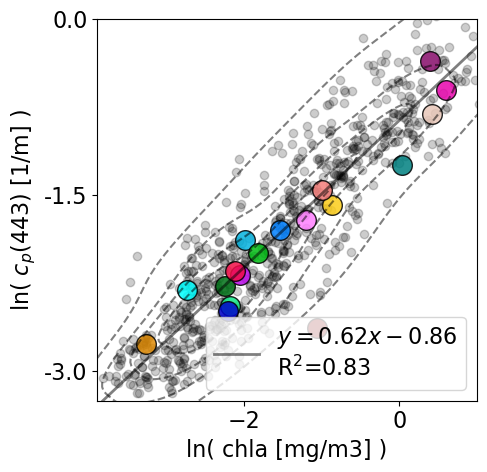

OLS R2=0.03
Pearson R=-0.16, p=0.000
Spearman R=-0.15, p=0.000


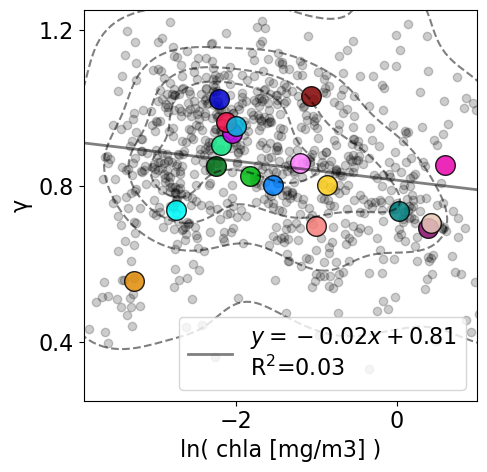

OLS R2=0.36
Pearson R=-0.60, p=0.000
Spearman R=-0.62, p=0.000


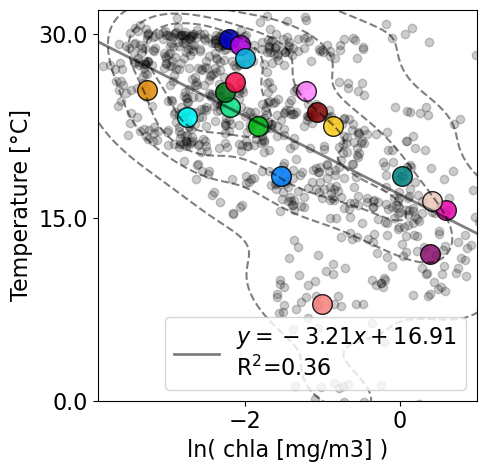

OLS R2=0.16
Pearson R=-0.40, p=0.000
Spearman R=-0.41, p=0.000


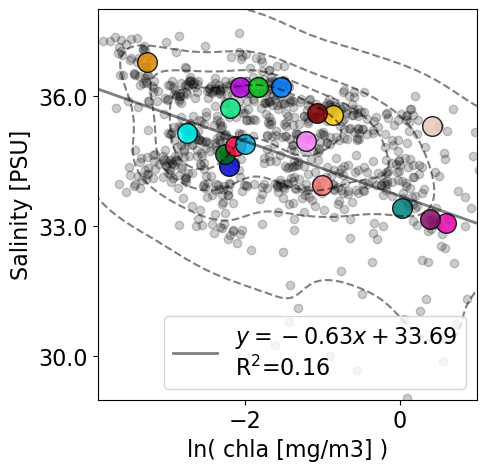

OLS R2=0.04
Pearson R=0.19, p=0.000
Spearman R=0.19, p=0.000


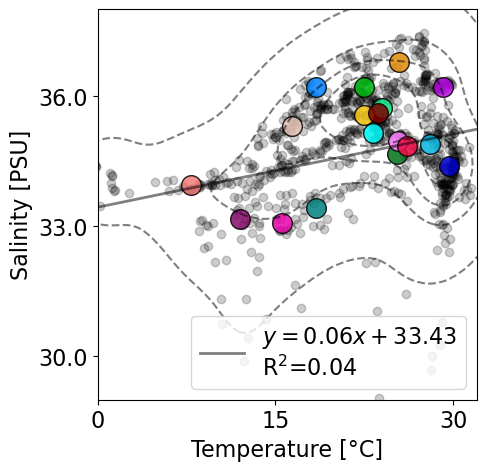

OLS R2=0.46
Pearson R=-0.68, p=0.000
Spearman R=-0.84, p=0.000


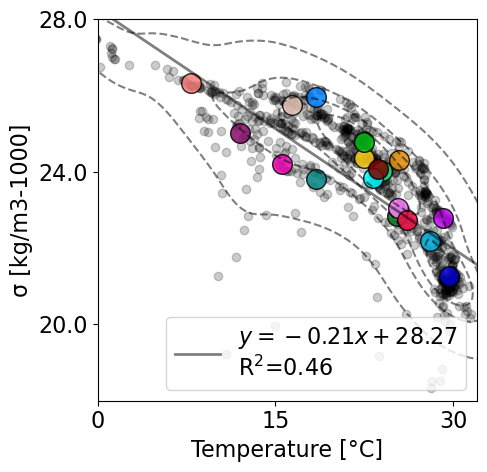

In [201]:
xs = ['chla',    'chla',          'chla', 'chla', 't_mean','t_mean']
ys = ['cp443','gamma', 't_mean', 's_mean', 's_mean', 'sig_mean']

xs_names = ['ln( chla [mg/m3] )', 'ln( chla [mg/m3] )',  'ln( chla [mg/m3] )', 'ln( chla [mg/m3] )', 'Temperature [°C]','Temperature [°C]']
ys_names = ['ln( $c_p$(443) [1/m] )','γ', 'Temperature [°C]', 'Salinity [PSU]', 'Salinity [PSU]', 'σ [kg/m3-1000]']

xlims = [[-3.9,1],[-3.9,1],[-3.9,1],[-3.9,1],[0,32], [0,32]]
ylims = [[-3.25,0],[0.25,1.25],[0,32],  [29,38],  [29,38], [18,28]]


for i in range(len(xs)):
    fig, ax = plt.subplots(figsize=(5.15,5))

    if xs[i] in ['chla','cp443']:
        X = np.log(gdf_intermit[xs[i]])
    else:
        X = gdf_intermit[xs[i]]
        
    if ys[i] in ['chla','cp443']:   
        Y = np.log(gdf_intermit[ys[i]])
    else:
        Y = gdf_intermit[ys[i]]

    nas = np.logical_or(np.isnan(X), np.isnan(Y))

    X = X[~nas]
    Y = Y[~nas]

    sns.kdeplot(x=X,y=Y,color='k',alpha=0.5,levels=5, ax=ax, linestyles='--')

    ols_model = sm.OLS(Y,sm.add_constant(X))
    results = ols_model.fit()

    pear_r = stats.pearsonr(X, Y)
    spear_r = stats.spearmanr(X, Y)

    print(f'OLS R2={results.rsquared:.2f}\nPearson R={pear_r.statistic:.2f}, p={pear_r.pvalue:.3f}\nSpearman R={spear_r.correlation:.2f}, p={pear_r.pvalue:.3f}')

    # extract intercept b and slope m
    b, m = results.params

    ax.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$\nR$^2$={results.rsquared:.2f}', ls='-',c='black',lw=2,alpha=0.5)

    plt.scatter(X,Y,alpha=0.2,c='k')
    counter = 0
    for fid in gdf_intermit.FID.unique():
        if len(gdf_intermit[gdf_intermit.FID == fid]) > 15:
            X_means = gdf_intermit[gdf_intermit.FID == fid][xs[i]].mean()
            Y_means = gdf_intermit[gdf_intermit.FID == fid][ys[i]].mean()
            if xs[i] in ['chla','cp443']:
                X_means = np.log(X_means)
            if ys[i] in ['chla','cp443']:   
                Y_means = np.log(Y_means)

            plt.scatter(X_means, Y_means,
                        color=colors[counter],alpha=0.85,s=200,edgecolor='k')
            counter +=1

    plt.ylabel(ys_names[i])
    
    plt.xlabel(xs_names[i])
    
    plt.ylim(ylims[i][0],ylims[i][1])
    
    plt.xlim(xlims[i][0],xlims[i][1])
    
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    ax.yaxis.set_major_locator(plt.MaxNLocator(3))
    ax.xaxis.set_major_locator(plt.MaxNLocator(3))

    # plt.title('Longhurst provinces plotted on chla\n and chla intermit')

    ax.legend(loc='lower right')
    plt.tight_layout()

    plt.savefig('figures/longhurst_'+xs[i]+ys[i]+'var_comp_absolute_value.png',dpi=300, transparent=True)
    plt.show()
    # break

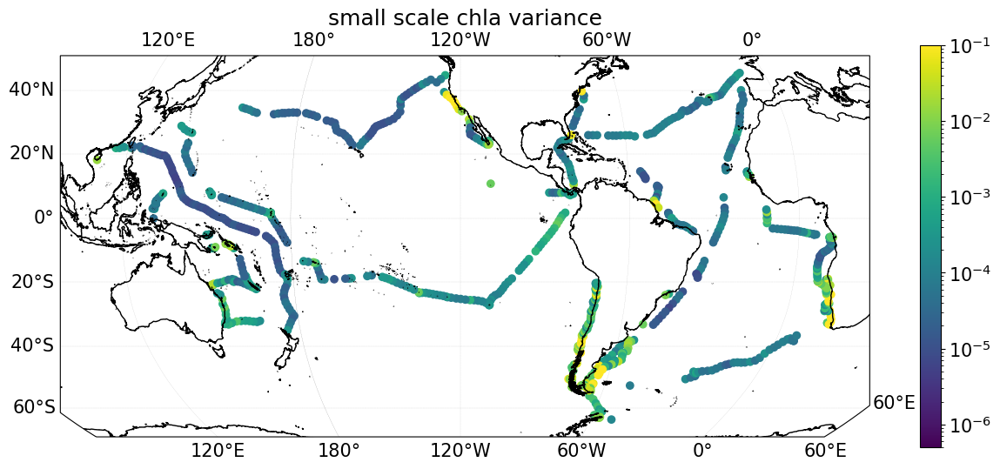

In [85]:
fig, ax = plt.subplots(figsize=(15,6), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf_intermit.to_crs(robinson).plot(ax=ax,column='small_var',legend=True, norm=matplotlib.colors.LogNorm(vmin=0.0000005, vmax=.1), cmap='viridis')

ax.set_title('small scale chla variance')

gl.top_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

# plt.savefig('chla_small_scale_var.png',dpi=300)

plt.show()

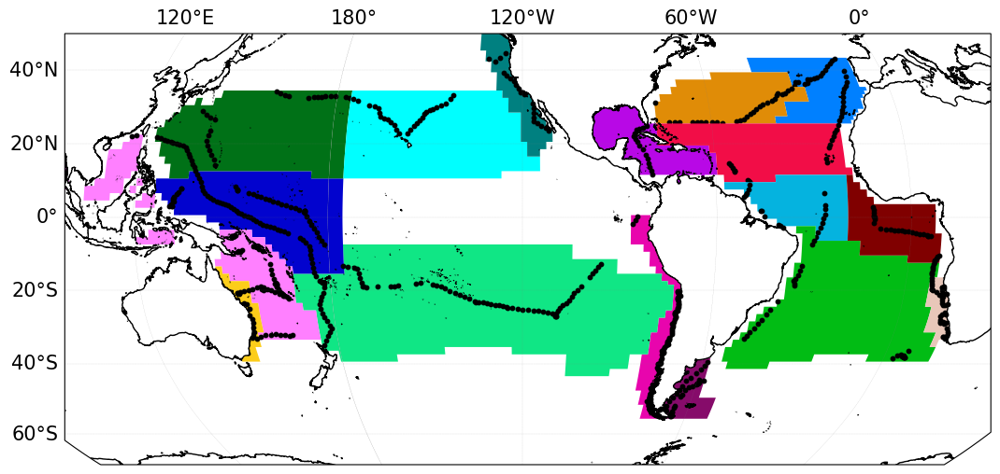

In [110]:
robinson = crs.Robinson(central_longitude=240).proj4_init
longhurst = longhurst.to_crs(robinson)

fig, ax = plt.subplots(figsize=(15,6), subplot_kw=dict(projection=crs.Robinson(central_longitude=240)))
ax.coastlines(resolution='10m')

gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)
gl.bottom_labels=False   # suppress top labels
gl.right_labels=False # suppress right labels

ax.set_xlim(-12134807-1200000,  12450955+1200000)
ax.set_ylim(-6730063-500000,  4851833+500000)

for idx, fid in enumerate(fid_list):
    if fid == 52:
        continue
    longhurst[longhurst.FID==fid].to_crs(robinson).plot(ax=ax,color=colors[idx], legend=True)
    gdf_intermit[gdf_intermit.FID==fid].to_crs(robinson).plot(ax=ax,color='k',markersize=10)

plt.savefig('figures/longhurst_map_matched_to_plot.png',dpi=300, transparent=True)
# plt.savefig('figures/longhurst_map_matched_to_plot_bad.png',dpi=300)
plt.show()

### explore cdom data

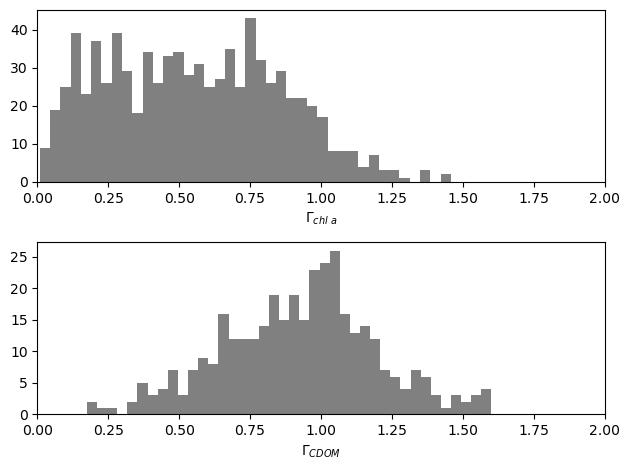

In [46]:
fig, ax = plt.subplots(2,1)
ax[0].hist(gdf_intermit.c_slope,color='grey',bins=40)
ax[0].set_xlim(0,2)
# ax[0].set_ylim(0,55)
ax[0].set_xlabel('$Γ_{chl\ a}$')
ax[1].hist(gdf_intermit.cdom_slope,color='grey',bins=40)
ax[1].set_xlim(0,2)
# ax[1].set_ylim(0,55)
ax[1].set_xlabel('$Γ_{CDOM}$')
fig.tight_layout()
plt.show()

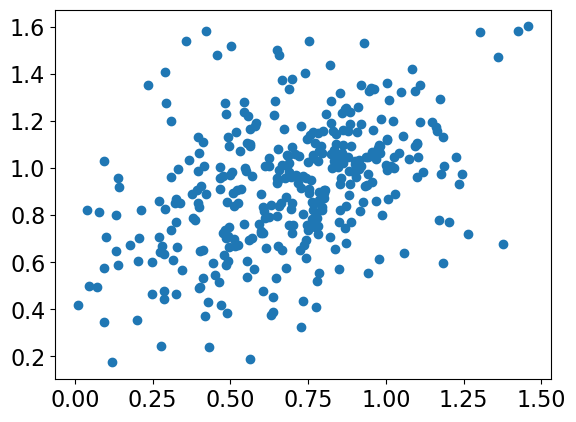

In [117]:
plt.scatter(gdf_intermit.c_slope,gdf_intermit.cdom_slope)

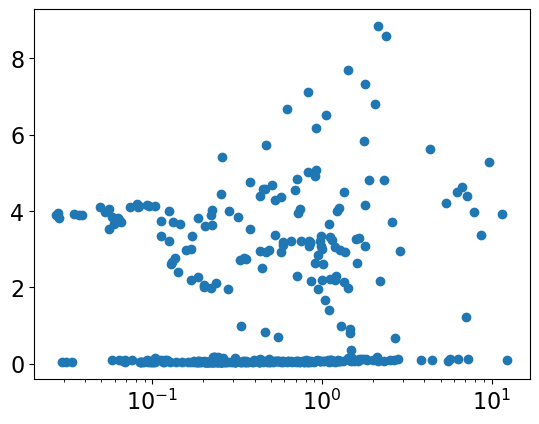

In [120]:
plt.scatter(gdf_intermit.chla,gdf_intermit.cdom_mean)
plt.xscale('log')

(array([131.,  63.,  16.,   0.,   1.,   7.,   3.,  38.,  87.,  14.]),
 array([-3.21676825, -2.67714211, -2.13751597, -1.59788984, -1.0582637 ,
        -0.51863756,  0.02098858,  0.56061472,  1.10024086,  1.639867  ,
         2.17949314]),
 <BarContainer object of 10 artists>)

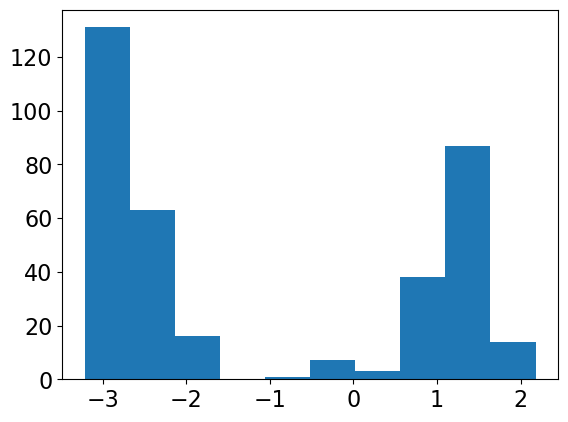

In [125]:
plt.hist(np.log(gdf_intermit.cdom_mean))

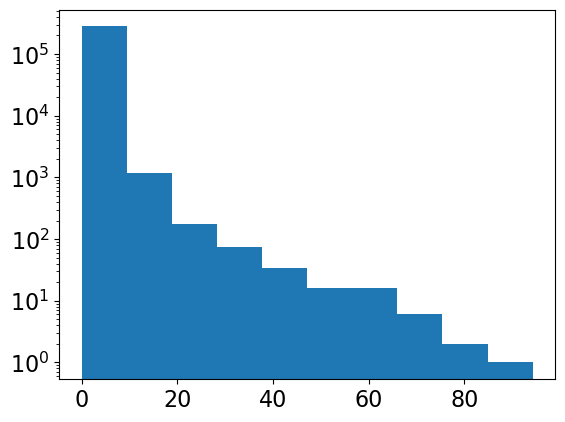

In [124]:
plt.hist(gdf.fdom)
plt.yscale('log')

In [53]:
plt.rcParams.update({'font.size': 14})

large scale
OLS R2=0.03
Pearson R=0.19, p=0.000
Spearman R=0.17, p=0.000


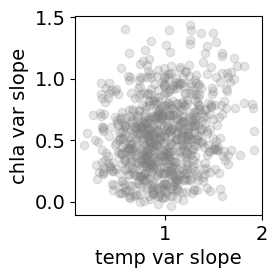

In [158]:
fig, ax = plt.subplots(figsize=(3,3))
X = gdf_intermit.t_slope
Y = gdf_intermit.c_slope

nas = np.logical_or(np.isnan(X), np.isnan(Y))

X = X[~nas]
Y = Y[~nas]

ols_model = sm.OLS(Y,sm.add_constant(X))
results = ols_model.fit()

pear_r = stats.pearsonr(X, Y)
spear_r = stats.spearmanr(X, Y)

print('large scale')
print(f'OLS R2={results.rsquared:.2f}\nPearson R={pear_r.statistic:.2f}, p={pear_r.pvalue:.3f}\nSpearman R={spear_r.correlation:.2f}, p={pear_r.pvalue:.3f}')

# extract intercept b and slope m
b, m = results.params

ax.scatter(X,Y,alpha=0.2,c='grey')
# ax.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$', ls='--',c='black',lw=3)

ax.set_xlabel("temp var slope")
ax.set_ylabel("chla var slope")

# ax.set_xlim(0, 2)
# ax.set_ylim(0, 2)
# ax.plot([10e-8, 100], [10e-8, 100], ls="--",c='k')


# ax.legend()
fig.tight_layout()
plt.savefig('temp_vs_chla_plot.png',dpi=300, transparent=True)
plt.show()

large scale
OLS R2=0.22
Pearson R=0.47, p=0.000
Spearman R=0.45, p=0.000

small scale
OLS R2=0.22
Pearson R=0.48, p=0.000
Spearman R=0.47, p=0.000


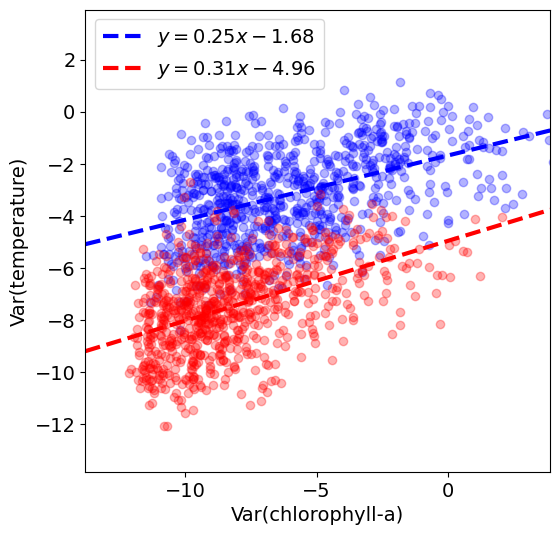

In [113]:
fig, ax = plt.subplots(figsize=(6,6))
X = np.log(gdf_intermit.large_var)
Y = np.log(gdf_intermit.large_t_var)

nas = np.logical_or(np.isnan(X), np.isnan(Y))

X = X[~nas]
Y = Y[~nas]

ols_model = sm.OLS(Y,sm.add_constant(X))
results = ols_model.fit()

pear_r = stats.pearsonr(X, Y)
spear_r = stats.spearmanr(X, Y)

print('large scale')
print(f'OLS R2={results.rsquared:.2f}\nPearson R={pear_r.statistic:.2f}, p={pear_r.pvalue:.3f}\nSpearman R={spear_r.correlation:.2f}, p={pear_r.pvalue:.3f}')

# extract intercept b and slope m
b, m = results.params

ax.scatter(X,Y,alpha=0.3,c='blue')
ax.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$', ls='--',c='blue',lw=3)

X = np.log(gdf_intermit.small_var)
Y = np.log(gdf_intermit.small_t_var)

nas = np.logical_or(np.isnan(X), np.isnan(Y))

X = X[~nas]
Y = Y[~nas]

pear_r = stats.pearsonr(X, Y)
spear_r = stats.spearmanr(X, Y)

print('\nsmall scale')
print(f'OLS R2={results.rsquared:.2f}\nPearson R={pear_r.statistic:.2f}, p={pear_r.pvalue:.3f}\nSpearman R={spear_r.correlation:.2f}, p={pear_r.pvalue:.3f}')

ols_model = sm.OLS(Y,sm.add_constant(X))
results = ols_model.fit()

# extract intercept b and slope m
b, m = results.params

l = ax.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$', ls='--',c='red',lw=3)

p = ax.scatter(X,Y,alpha=0.3,c='red')
ax.set_xlabel("Var(chlorophyll-a)")
ax.set_ylabel("Var(temperature)")

ax.set_xlim(np.log(10e-7), np.log(50))
ax.set_ylim(np.log(10e-7), np.log(50))
# ax.plot([10e-8, 100], [10e-8, 100], ls="--",c='k')

ax.legend(loc='upper left')

plt.savefig('variance_comparison_chla_t.png',dpi=300)

plt.show()

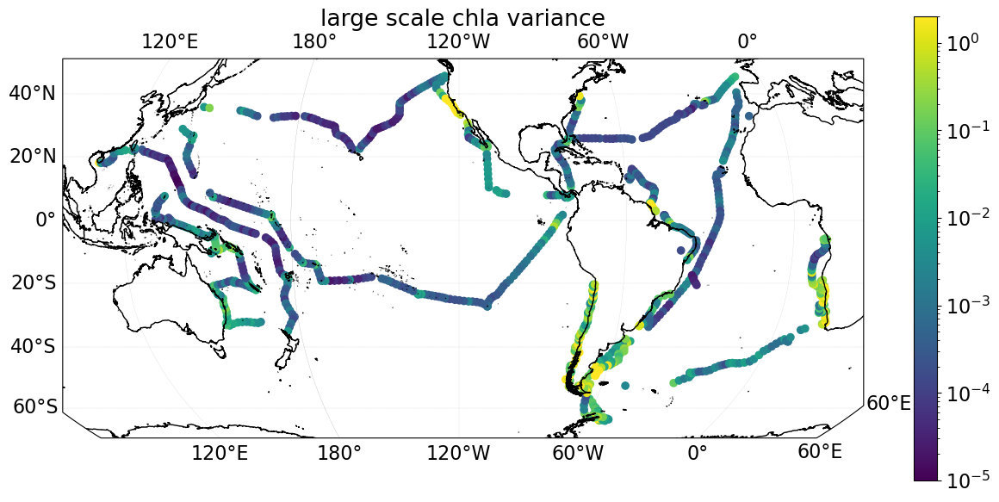

In [143]:
fig, ax = plt.subplots(figsize=(15,7), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf_intermit.to_crs(robinson).plot(ax=ax,column='large_var',legend=True, norm=matplotlib.colors.LogNorm(vmin=0.00001, vmax=2), cmap='viridis')

ax.set_title('large scale chla variance')

# plt.savefig('chla_large_scale_var.png',dpi=300)

plt.show()

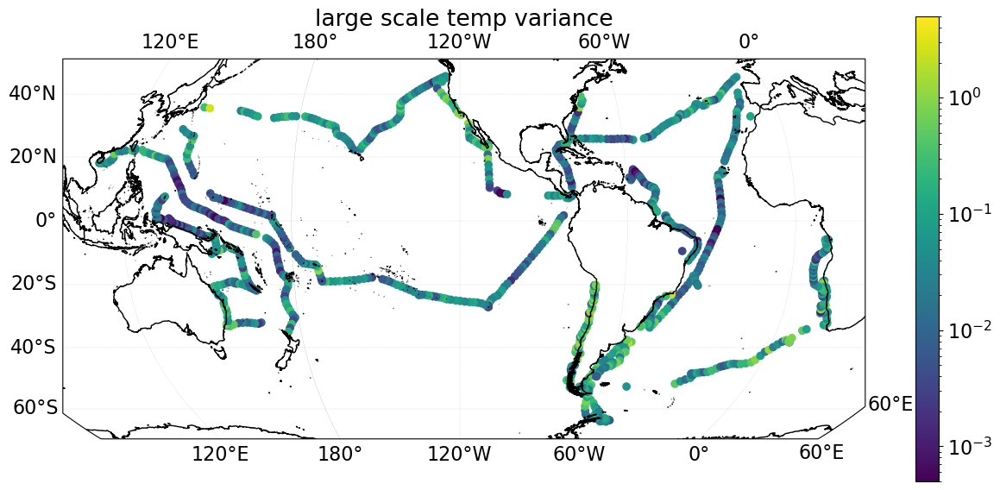

In [144]:
fig, ax = plt.subplots(figsize=(15,7), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=-120).proj4_init
gdf_intermit.to_crs(robinson).plot(ax=ax,column='large_t_var',legend=True, norm=matplotlib.colors.LogNorm(vmin=0.0005, vmax=5), cmap='viridis')

ax.set_title('large scale temp variance')

# plt.savefig('temp_large_scale_var.png',dpi=300)

plt.show()

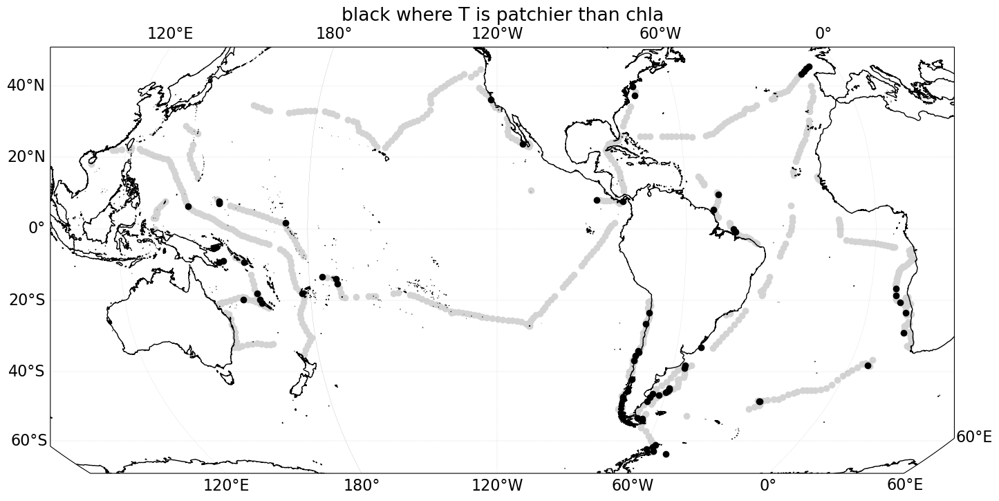

In [203]:
fig, ax = plt.subplots(figsize=(25,8), subplot_kw=dict(projection=crs.Robinson(central_longitude=-120)))
ax.coastlines(resolution='10m')
gl = ax.gridlines(color='grey', linestyle='--', lw=0.1, draw_labels=True)

robinson = crs.Robinson(central_longitude=-120).proj4_init

gdf_intermit[gdf_intermit.c_slope < gdf_intermit.t_slope].to_crs(robinson).plot(ax=ax,c='lightgrey')
gdf_intermit[gdf_intermit.c_slope > gdf_intermit.t_slope].to_crs(robinson).plot(ax=ax,c='black')

ax.set_title('black where T is patchier than chla')

plt.savefig('figures/chla_more_variable.png',dpi=300)

plt.show()

In [173]:
plt.rcParams.update({'font.size': 17})

## big plot of everything

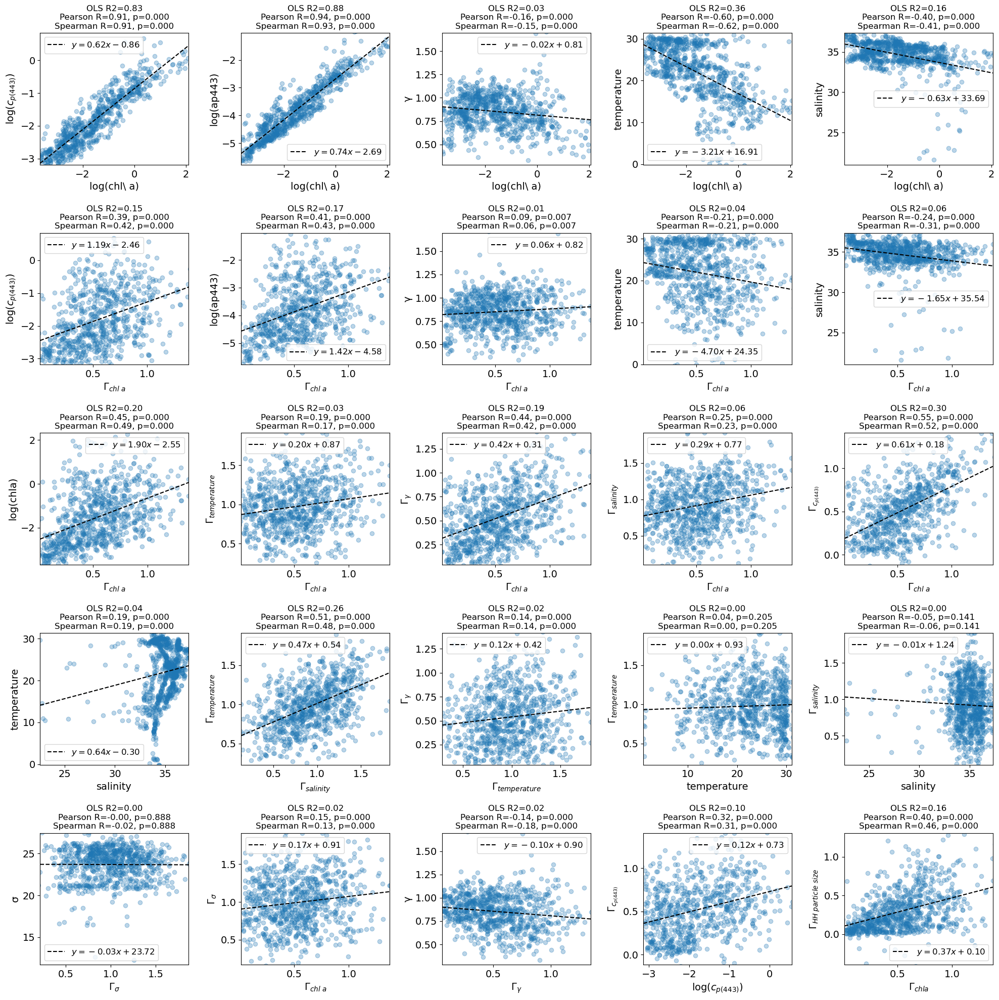

In [117]:
Xs = [np.log(gdf_intermit.chla),np.log(gdf_intermit.chla),np.log(gdf_intermit.chla),np.log(gdf_intermit.chla),np.log(gdf_intermit.chla), 
      gdf_intermit.c_slope,gdf_intermit.c_slope,gdf_intermit.c_slope,gdf_intermit.c_slope,gdf_intermit.c_slope, 
      gdf_intermit.c_slope,gdf_intermit.c_slope,gdf_intermit.c_slope,gdf_intermit.c_slope,gdf_intermit.c_slope,
      gdf_intermit.s_mean, gdf_intermit.s_slope, gdf_intermit.t_slope, gdf_intermit.t_mean, gdf_intermit.s_mean,
      gdf_intermit.sigma_slope, gdf_intermit.c_slope, gdf_intermit.transect_g_slope, np.log(gdf_intermit.cp443), gdf_intermit.c_slope
     ]


Ys = [np.log(gdf_intermit.cp443),np.log(gdf_intermit.ap443),gdf_intermit.gamma,gdf_intermit.t_mean,gdf_intermit.s_mean, 
      np.log(gdf_intermit.cp443),np.log(gdf_intermit.ap443),gdf_intermit.gamma,gdf_intermit.t_mean,gdf_intermit.s_mean,
      np.log(gdf_intermit.chla), gdf_intermit.t_slope, gdf_intermit.transect_g_slope, gdf_intermit.s_slope, gdf_intermit.cp443_slope,
      gdf_intermit.t_mean, gdf_intermit.t_slope,gdf_intermit.transect_g_slope, gdf_intermit.t_slope, gdf_intermit.s_slope,
      gdf_intermit.sig_mean, gdf_intermit.sigma_slope, gdf_intermit.gamma, gdf_intermit.cp443_slope, gdf_intermit.hh_slope
     ]

Xlabels = ['log(chl\ a)','log(chl\ a)','log(chl\ a)','log(chl\ a)','log(chl\ a)', 
           '$Γ_{chl\ a}$','$Γ_{chl\ a}$','$Γ_{chl\ a}$','$Γ_{chl\ a}$','$Γ_{chl\ a}$', 
           '$Γ_{chl\ a}$','$Γ_{chl\ a}$','$Γ_{chl\ a}$','$Γ_{chl\ a}$','$Γ_{chl\ a}$',
           'salinity', '$Γ_{salinity}$', '$Γ_{temperature}$', 'temperature', 'salinity',
          '$Γ_{σ}$', '$Γ_{chl\ a}$', '$Γ_{γ}$', 'log($c_{p(443)}$)', '$Γ_{chl a}$']

Ylabels = ['log($c_{p(443)}$)','log(ap443)', 'γ', 'temperature','salinity', 
           'log($c_{p(443)}$)','log(ap443)', 'γ', 'temperature','salinity',
           'log(chla)', '$Γ_{temperature}$', '$Γ_{γ}$', '$Γ_{salinity}$', '$Γ_{c_{p(443)}}$',
           'temperature', '$Γ_{temperature}$', '$Γ_{γ}$', '$Γ_{temperature}$', '$Γ_{salinity}$',
          'σ', '$Γ_{σ}$', 'γ', '$Γ_{c_{p(443)}}$', '$Γ_{HH\ particle\ size}$']

fig, ax = plt.subplots(5,5,figsize=(5*4,5*4))
for i,a in enumerate(ax.reshape(-1)):

    X = Xs[i]
    Y = Ys[i]

    nas = np.logical_or(np.isnan(X), np.isnan(Y))
    
    X = X[~nas]
    Y = Y[~nas]
    
    pear_r = stats.pearsonr(X, Y)
    spear_r = stats.spearmanr(X, Y)

    ols_model = sm.OLS(Y,sm.add_constant(X))
    results = ols_model.fit()

    # extract intercept b and slope m
    b, m = results.params

    a.scatter(X,Y,alpha=0.3)
    a.set_ylabel(Ylabels[i])
    a.set_xlabel(Xlabels[i])
    a.axline(xy1=(0, b), slope=m, label=f'$y = {m:.2f}x {b:+.2f}$', ls='--',c='k')
    a.set_xlim(np.nanquantile(X,.005),np.nanquantile(X,.995)) 
    a.set_ylim(np.nanquantile(Y,.002),np.nanquantile(Y,.998)) 
    a.legend(prop={'size': 12})
    a.set_title(f'OLS R2={results.rsquared:.2f}\nPearson R={pear_r.statistic:.2f}, p={pear_r.pvalue:.3f}\nSpearman R={spear_r.correlation:.2f}, p={pear_r.pvalue:.3f}',fontsize=12)
    
    
fig.tight_layout()
plt.savefig('relations_across_variables_500step.png',dpi=300, transparent=True)
# plt.savefig('relations_across_variables_250step.png',dpi=300, transparent=True)
# plt.savefig('relations_across_variables_cslope_normed.png',dpi=300, transparent=True)
plt.show()